# ✋**Introduction**
Hi, I'm Gil, and this notebook is my final project for the Data Science Workshop at the Open University of Israel.
I wanted to tackle a real-world, complex problem that would push me to apply advanced technologies and algorithms.

When I came across a kaggle competition about analyzing patient notes from Medical Licensing Exams, it felt like the perfect fit given my passion for NLP and medicine.

#📃 **Presenting The Problem**
The problem was published as a [kaggle competition](https://www.kaggle.com/competitions/nbme-score-clinical-patient-notes/overview), this presentation is my shortend version of the information appears in the competition web page.
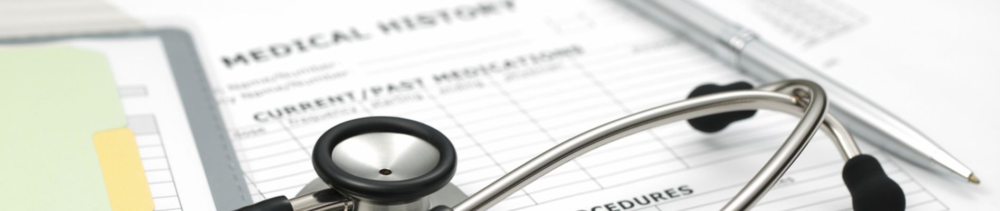

## Background And Motivation

When a physician meets a patient. Her/His ability to interpret a patient symptoms is crucial for making an accurate diagnosis.
For that reason, before a physician is licensed, he/she spends a lot of time  practicing writing 'patient notes' - text detailing important information related by the patient during the physical exam and interview.

A well patient note documents:
- the history of the patient’s complaint
-  physical exam findings
- possible diagnoses, and follow-up care.

Learning and assessing the skill of writing patient notes requires feedback from other doctors, a time-intensive process.

Until recently, the Step 2 Clinical Skills examination was one component of the United States Medical Licensing Examination® (USMLE®):
- Test-takers interacted with Standardized Patients (individuals trained to simulate specific clinical cases) and then wrote a patient note summarizing their findings
- After then, trained physician raters scored patient notes with rubrics that outlined each case’s important concepts (referred to as features).The more such features found in a patient note, the higher the score (among other factors that contribute to the final score for the exam).


Having physicians score patient note exams requires significant time, along with human and financial resources.
## Goal Defenition
 Scoring patient notes computationally is challenging - features may be expressed in many ways, detecting features can sometimes require combining multiple text segments, cases of ambiguous negation, ect.

**My goal is to develop an automated method that extract key phrases from a given patient note, written by a medical student and map them to the correct (given) exam rubrics**.

Developing such method, can be used to score a patient note way more efficiently, while maintaining transparency and explainability.

## The Dataset
The dataset is from the Step 2 Clinical Skills examination described above. It contains three relevant files, which we will explore in more detail later:
1. patient_notes.csv - A collection of 40,000 Patient note history portions which only part of them have features annotated.
2. features.csv - Contains the rubrics for each clinical case.
3. train.csv - Feature annotations for 1000 patient notes, 100 for each of the 10 clinical cases.

## Evaluation Method
The solution is evaluated by a micro-averaged F1 score - it's calculated the following way:
1. For each instance (a pair of patient note and an exam rubric), we predict which characters indices are part of the key phrases.
2. We score each chararcter index as:
 - TP - if it's both a ground-truth and a prediction.
 - TN - if it's neither ground-truth nor a prediction.
 - FN -  if it's a ground-truth but not a prediction.
 - FP - if it's not a ground-truth but in a prediction.
3. Finally, we compute an overall F1 score from the TPs, FNs, and FPs aggregated across all instances:
 - F1 = 2TP/(2TP+FP+FN)



# 📊 **Exploratory Data Analysis (EDA)**
The goal of this section is to gain a deep understanding of the dataset and the unique challenges it presents. This involves both **exploration** and **preparation**, including:
- Identifying patterns in the data
- Detecting and handling inconsistencies
- Extracting meaningful information that can guide model development

This phase also includes **data preprocessing** and **feature extraction**, both of which are essential when working with unstructured clinical text.

## 🔍 **What We'll Cover**:
### 1. **Data Exploration**
*  Explore the structure and content of the three primary dataset files:
  * `train.csv`
  * `patient_notes.csv`
  * `features.csv`
* Analyze how features are distributed across cases, how consistently they appear and how they are expressed in natural language.
* Identify challenges such as annotation sparsity and language variability.
* Detect and address inconsistencies, anomalies, and potential data quality issues.

### 2. **Feature Extraction**
*  Building on the insights from data exploration (along with some trial-and-error), we’ll identify textual patterns and linguistic cues that may help detect key phrases corresponding to each feature.
* These features will be the building blocks for a model that can reliably find and link key phrases to the right clinical concepts.

Throughout both stages, we'll perform data transformations and preprocessing steps as needed

## Data Exploration


In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")
from wordcloud import WordCloud, STOPWORDS
from matplotlib_venn import venn3
import spacy
import matplotlib.gridspec as gridspec

In [2]:
BASE_DIRECTORY = "/content/drive/MyDrive/university/Data science workshop final project/"
BASE_FILE_PATH = BASE_DIRECTORY + r"{file_name}.csv"

In [3]:
train_df = pd.read_csv(BASE_FILE_PATH.format(file_name="train"))
pn_df = pd.read_csv(BASE_FILE_PATH.format(file_name="patient_notes"))
features_df = pd.read_csv(BASE_FILE_PATH.format(file_name="features"))

### Train Table
> Feature annotations for 1000 patient notes, 100 for each of the 10 clinical cases. Has 6 columns:
  - id - id for each patient note / feature pair.
  - pn_num - The id of the patient note annotated in this row.
  - feature_num - The id of the feature annotated in this row.
  - case_num - The id of the case to which this patient note belongs.
  - annotation - The text(s) within a patient note indicating a feature. A feature may be indicated multiple times within a single note.
  - location - Character spans indicating the location of each annotation within the note. Multiple spans may be needed to represent an annotation, in which case the spans are delimited by a semicolon ;.


In [4]:
train_df.sample(5, random_state=32)

,id,case_num,pn_num,feature_num,annotation,location
1570,10183_110,1,10183,110,[],[]
7665,53039_509,5,53039,509,"['Three weeks ago more frequent', 'past 3 week...","['233 248;286 299', '85 109;124 129']"
187,00372_005,0,372,5,"['Denies hair changes', 'Denies heat/cold inot...","['304 310;450 462', '304 310;464 485']"
6567,43451_407,4,43451,407,['F'],['6 7']
3258,21051_212,2,21051,212,['with variable flow'],['148 166']


Let's start off by making sure all the columns are valid and look as expected:

In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14300 entries, 0 to 14299
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           14300 non-null  object
 1   case_num     14300 non-null  int64 
 2   pn_num       14300 non-null  int64 
 3   feature_num  14300 non-null  int64 
 4   annotation   14300 non-null  object
 5   location     14300 non-null  object
dtypes: int64(3), object(3)
memory usage: 670.4+ KB


In [6]:
print(f"Is id column in unique per row? {train_df['id'].is_unique}")
is_comb_unique = train_df.groupby(['pn_num', 'feature_num']).size().max() == 1
print(f"Is the combination of pn_num and feature_num unique per row? {is_comb_unique}")

Is id column in unique per row? True
Is the combination of pn_num and feature_num unique per row? True


Let's group the data by case_num to check that each case has the same number of samples, see features are split, and make sure there’s no missing data:

In [7]:
train_df.groupby('case_num').agg(amount_of_unique_patient_notes=('pn_num', 'nunique'),amount_of_unique_features=('feature_num','nunique'))

,amount_of_unique_patient_notes,amount_of_unique_features
case_num,,
0,100,13
1,100,13
2,100,17
3,100,16
4,100,10
5,100,18
6,100,12
7,100,9
8,100,18


The grouped df reveals that for each case there are truly 100 different patient notes samples, and the number of features varies across different cases.
Let's ensure that all features appear in all patient notes:

In [8]:
aggregate_by_feature_num = train_df.groupby('feature_num').agg(amount_of_patient_notes=('pn_num','count'),amount_of_unique_cases=('case_num','nunique'))
print(f"Is there existing feature number that is used twice in different cases? {(aggregate_by_feature_num.amount_of_unique_cases != 1).any()}")
print(f"Is there a feature number that was not filled for one of the patient notes? {(aggregate_by_feature_num.amount_of_patient_notes != 100).any()}")
del aggregate_by_feature_num

Is there existing feature number that is used twice in different cases? False
Is there a feature number that was not filled for one of the patient notes? False


We still need to validate the 'annotation' and 'location' columns:

In [9]:
train_df['annotation'][0], train_df['location'][0]

("['dad with recent heart attcak']", "['696 724']")

Although they were loaded as strings, It seems like the annotation and the location are supposed to be lists.  Let's fix it:

In [10]:
string_to_list = lambda x: eval(x) # converts string representation of a list
train_df['annotation'] = train_df['annotation'].apply(string_to_list)
train_df['location'] = train_df['location'].apply(string_to_list)

In [11]:
train_df.sample(5, random_state=32)

,id,case_num,pn_num,feature_num,annotation,location
1570,10183_110,1,10183,110,[],[]
7665,53039_509,5,53039,509,"[Three weeks ago more frequent, past 3 weeks h...","[233 248;286 299, 85 109;124 129]"
187,00372_005,0,372,5,"[Denies hair changes, Denies heat/cold inotler...","[304 310;450 462, 304 310;464 485]"
6567,43451_407,4,43451,407,[F],[6 7]
3258,21051_212,2,21051,212,[with variable flow],[148 166]


Now we can verify that the number of annotations and locations are the same for each corresponding entry:

In [12]:
is_the_list_lengths_corresponding = (train_df.annotation.apply(len) == train_df.location.apply(len)).all()
print(f"Is the amount of annotations in the annotaion column corresponds to the num of locations in the locations column for each row? {is_the_list_lengths_corresponding}")

Is the amount of annotations in the annotaion column corresponds to the num of locations in the locations column for each row? True


#### Findings About The Train Table
  - No null values are present in the table.
  - Each row has a unique ID.
  - Each `(patient_num, feature_num)` pair is unique per row.
  - There are 10 distinct case numbers.
  - Each case contains exactly 100 patient notes.
  - We assume that all features for each case are represented in the table. This assumption will be validated further using additional tables:
   - Each feature has a unique `feature_num`, with no overlap between features from different cases.
   - Every feature is populated for each patient note, which we will verify in subsequent tables.
  - The `annotation` and `location` columns contain valid Python lists.
  - For each row, both `annotation` and `location` lists have matching lengths.

We’ll now examine the additional tables and later return to the training table to analyze it in a broader context.

### Features Table
> Contains the rubrics for each clinical case. Has 3 columns:
  - feature_num - An id for each feature.
  - case_num - An id for each case.
  - feature_text - A description of the feature.

In [13]:
features_df.sample(10, random_state=32)

,feature_num,case_num,feature_text
41,215,2,Sleep-disturbance-OR-Early-awakenings
128,902,9,1-day-duration-OR-2-days-duration
131,905,9,Neck-pain
27,201,2,Last-Pap-smear-I-year-ago
132,906,9,Vomiting
113,805,8,67-year
34,208,2,Female
91,604,6,Worse-with-deep-breath-OR-pleuritic
12,12,0,Male
119,811,8,Diminished-energy-OR-feeling-drained


Following the approach used for the training data, we will first validate the columns in this table to ensure they are as expected

In [14]:
features_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 143 entries, 0 to 142
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   feature_num   143 non-null    int64 
 1   case_num      143 non-null    int64 
 2   feature_text  143 non-null    object
dtypes: int64(2), object(1)
memory usage: 3.5+ KB


In [15]:
print(f"Is feature num column in unique per row? {features_df.feature_num.is_unique}")

Is feature num column in unique per row? True


In [16]:
feature_case_sym_diff = set(zip(features_df.feature_num, features_df.case_num)).symmetric_difference(set(zip(train_df.feature_num, train_df.case_num)))
print(f"Does the features table contain the exact same features as in the train table? {len(feature_case_sym_diff)==0}") # TODO - check also the case_num is equal

Does the features table contain the exact same features as in the train table? True


In [17]:
print(f"Do all the feature_text values are a none empty string? {(features_df.feature_num.astype(str).str.len()>0).all()}")

Do all the feature_text values are a none empty string? True


It seems that each feature text is a string containing alphanumeric chars
seperated by '-' ,
 let's validate it:

In [18]:
pattern = r'^[a-zA-Z0-9]+(?:-[a-zA-Z0-9]+)*$' # a regex matches the above criterias
format_check_result = features_df['feature_text'].str.match(pattern).all()
print(f"Does each feature text match the pattern of alphanumeric seperated by '-'? {format_check_result}")

Does each feature text match the pattern of alphanumeric seperated by '-'? True


Let's replace the `'-'` with regular spaces:

In [19]:
features_df['feature_text'] = features_df['feature_text'].str.replace('-', ' ')
features_df.head(5)

,feature_num,case_num,feature_text
0,0,0,Family history of MI OR Family history of myoc...
1,1,0,Family history of thyroid disorder
2,2,0,Chest pressure
3,3,0,Intermittent symptoms
4,4,0,Lightheaded




#### Findings About The Features Table
  - No null values are present in the table.
  - Each `feature_num` is unique per row.
   - We validated the assumption that all the features are represented in the train table and there are no features in the train table that do not present in the features table.
  - The feature text is a string containing alhpanumeric chars seperated by '-', we replaced them by regular space

### Patient Notes Table
> A collection of 40,000 Patient note history portions which only part of them have features annotated (and are in the train table). Has 3 columns:
 - pn_num - An id for each patient note.
 - case_num - An id for the clinical case the patient note representes.
 - pn_history - The text written by the test taker.

In [20]:
pn_df.sample(5, random_state=32)

,pn_num,case_num,pn_history
4457,21505,2,44yo Female w/ a PMH of HTN who presents with ...
16633,41911,4,45 yo F with no past medical history comes in ...
22236,52103,5,Mrs Whelan is a 26 y/o F with no prior medical...
12153,37260,3,35 yo male with stomahc problems. For 2 months...
19587,44961,4,45 YO F with constant nervousness for weeks. I...


In [21]:
pn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42146 entries, 0 to 42145
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   pn_num      42146 non-null  int64 
 1   case_num    42146 non-null  int64 
 2   pn_history  42146 non-null  object
dtypes: int64(2), object(1)
memory usage: 987.9+ KB


In [22]:
print(f"Is pn_num column unique per row? {pn_df.pn_num.is_unique}")

Is pn_num column unique per row? True


In [23]:
is_pn_train_contained_in_pn_table = set(zip(train_df.pn_num, train_df.case_num)).issubset(set(zip(pn_df.pn_num, pn_df.case_num)))
all_pn_nums = set(pn_df.pn_num)
train_pn_nums = set(train_df.pn_num)
print(f"Does all the patient notes in the train table are in the patient notes table? {is_pn_train_contained_in_pn_table}")
print(f"{len(all_pn_nums) - len(train_pn_nums)} patient notes are unlabeled out of {len(pn_df)} which is {100*(len(all_pn_nums) - len(train_pn_nums))/len(all_pn_nums):.2f}%")
print(f"Are all patient note texts non-empty strings? {(pn_df.pn_history.astype(str).str.len()>0).all()}")

Does all the patient notes in the train table are in the patient notes table? True
41146 patient notes are unlabeled out of 42146 which is 97.63%
Are all patient note texts non-empty strings? True


#### Findings About The Patient Notes Table
  - No null values are present in the table.
  - Each `pn_num` is unique per row.
  - All the patient notes are not empty.
  - All the patient notes in the train table are in the patient notes table.
  - 97.63% precent of the patient notes are unlabeled.

Having reviewed all the tables, we are now ready to begin exploring the data itself.

### Analyzing The Entire Dataset

For easier access during processing, let’s add the corresponding feature text and patient note text directly to our training DataFrame.

In [24]:
train_df = train_df.merge(features_df.loc[:,["feature_num","feature_text"]],on="feature_num")
train_df = train_df.merge(pn_df.loc[:,["pn_num","pn_history"]],on="pn_num")

#### Validating The Slicing From The Patient Notes
Let's ensure the locations and annotations align correctly with the patient notes text.

In [25]:
def parse_location_string(location: str) -> list[tuple[int, int]]:
    """
    Parses a location string into a list of (start, end) index pairs.

    Args:
        location: A string with start and end indices separated by spaces and `;`.

    Returns:
        A list of tuples representing character spans as (start, end) pairs.
    """
    return [tuple(map(int, str_slice.split())) for str_slice in location.split(';')]

def extract_text_from_indices(patient_note: str, indices: list[tuple[int, int]]) -> str:
    """
    Extracts text from a patient note based on a list of character spans.

    Args:
        patient_note: The text of the patient note.
        indices: A list of (start, end) index pairs.

    Returns:
        The extracted text as a single string.
    """
    return " ".join(patient_note[start:end] for start, end in indices)

def validate_row_slices(row: pd.Series) -> bool:
    """
    Validates that the character spans (locations) in a row match the actual text in the patient note.

    Args:
        row: A row from the train dataframe.

    Returns:
        True if all slices are valid, False if any mismatch is found.
    """
    pn_num = row['pn_num']
    feature_num = row['feature_num']
    patient_note = row['pn_history']

    locations = row['location']
    annotations = row['annotation']

    for i, (location, annotation) in enumerate(zip(locations, annotations)):
        indices = parse_location_string(location)
        extracted_text = extract_text_from_indices(patient_note, indices)

        if extracted_text != annotation:
            print(f"Mismatch for pn_num {pn_num}, "
                  f"feature {feature_num}, "
                  f"location {location} number {i} in the locations list, "
                  f" annotation {list(annotation)}, "
                  f"extracted text: {list(extracted_text)}")
            return False

    return True

def validate_annotations(train_df: pd.DataFrame) -> None:
    """
    Validates that all annotations and locations in the train DataFrame
    are correctly aligned with the patient notes.

    Args:
        train_df: The DataFrame containing patient note annotations and locations.

    Prints:
        A message indicating whether all annotations and locations are correctly aligned.
    """
    validation_results = train_df.apply(validate_row_slices, axis=1)

    if validation_results.all():
        print("All annotations and locations are correctly aligned with patient notes.")
    else:
        print("There are mismatches between annotations and locations.")



In [26]:
validate_annotations(train_df)

Mismatch for pn_num 20747, feature 214, location 549 558 number 0 in the locations list,  annotation ['s', 'w', 'e', 'a', 't', 'i', 'n', 'g'], extracted text: ['s', 'w', 'e', 'a', 't', 'i', 'n', 'g', '\r']
Mismatch for pn_num 52512, feature 500, location 101 121 number 0 in the locations list,  annotation ['f', 'i', 'r', 's', 't', ' ', 's', 't', 'a', 'r', 't', 'e', 'd', ' ', '5', ' ', 'y', 'r', 's'], extracted text: [' ', 'f', 'i', 'r', 's', 't', ' ', 's', 't', 'a', 'r', 't', 'e', 'd', ' ', '5', ' ', 'y', 'r', 's']
Mismatch for pn_num 92385, feature 900, location 182 213;225 236 number 1 in the locations list,  annotation ['w', 'i', 't', 'h', 'o', 'u', 't', ' ', 'i', 'm', 'p', 'r', 'o', 'v', 'e', 'm', 'e', 'n', 't', ' ', 'w', 'h', 'e', 'n', ' ', 't', 'a', 'k', 'i', 'n', 'g', ' ', 'i', 'b', 'u', 'p', 'r', 'o', 'f', 'e', 'n'], extracted text: ['w', 'i', 't', 'h', 'o', 'u', 't', ' ', 'i', 'm', 'p', 'r', 'o', 'v', 'e', 'm', 'e', 'n', 't', ' ', 'w', 'h', 'e', 'n', ' ', 't', 'a', 'k', 'i', '

In most cases, all columns are well-aligned. A mismatch occurred only four times, and each case was due to the location capturing different types of spaces around the text. Since there are only four instances, we can address these manually.

In [27]:
corrections = [
    {"pn_num": 20747, "feature": 214, "corrected_location": "549 557", "index": 0},  # Removing the last \r character
    {"pn_num": 52512, "feature": 500, "corrected_location": "102 121", "index": 0},  # Adjusted start index by 1 to remove leading space
    {"pn_num": 92385, "feature": 900, "corrected_location": "182 213;225 234", "index": 1},  # Removing \r\n at end
    {"pn_num": 92385, "feature": 902, "corrected_location": "409 418", "index": 1}  # Removing \r\n at end
]

for correction in corrections:
    pn_num = correction["pn_num"]
    feature = correction["feature"]
    corrected_location = correction["corrected_location"]
    index = correction["index"]
    locations_list =  train_df.loc[(train_df['pn_num'] == pn_num) & (train_df['feature_num'] == feature), 'location'].iloc[0]
    locations_list[index]= corrected_location


Let's check that it worked correctly:

In [28]:
validate_annotations(train_df)

All annotations and locations are correctly aligned with patient notes.


#### Train-Validation Split
Before diving into the full dataset analysis, let's first split the data into a training set and a validation set.

To prevent bias, we will visualize only the training set.

We will split the data by randomly partitioning the **patient note IDs** found in the training table.

In [29]:
from sklearn.model_selection import train_test_split
train_pn_nums, val_pn_nums = train_test_split(train_df.pn_num.drop_duplicates(), test_size=0.2, random_state=42)

dataset_type_to_pn_nums = {
    "train": train_pn_nums,
    "val": val_pn_nums,
}

def get_df_mask_by_dataset_type(df: pd.DataFrame, dataset_type: str) -> pd.Series:
  """
    Generates a boolean mask for filtering a DataFrame based on the dataset type.

    Parameters:
    - df (pd.DataFrame): The input DataFrame containing a 'pn_num' column.
    - dataset_type (str): The dataset type (e.g., 'train', 'val' - validation) used to filter the DataFrame.

    Returns:
    - pd.Series: A boolean mask indicating which rows belong to the specified dataset type.

    Example:
    >>> mask = get_df_mask_by_dataset_type(df, "train")
    >>> filtered_df = df[mask]
    """

  return df.pn_num.isin(dataset_type_to_pn_nums[dataset_type])

### Exploring Distributions of Text Size
In this section, we delve into the charactersitics of text data by examining the distruibutions of its size, measured in both character count and word count. Understanding these distributions can provide valuable insights into the nature of the patient notes, annotations and feature text we are working with.

In [30]:
def plot_histogram_with_stats(data: pd.Series, title: str, ax: plt.Axes, color: str, bins: int = 10, **kwargs) -> None:
    """Plot histogram and display statistics for given data.

    Args:
        data: A Pandas Series containing the data to plot.
        title: The title of the plot.
        ax: The matplotlib Axes object to draw the plot on.
        color: The color of the histogram bars.
    """
    sns.histplot(x=data, bins=bins, ax=ax, color=color, **kwargs)
    ax.set_title(title)
    ax.set_ylabel(kwargs.get("stat",'count').capitalize())
    # Display statistics
    ax.text(0.95, 0.95,
            f"Median: {data.median():.2f}\n"
            f"Std: {data.std():.2f}\n"
            f"Mean: {data.mean():.2f}\n"
            f"Min: {data.min():.2f}\n"
            f"Max: {data.max():.2f}",
            transform=ax.transAxes,
            fontsize=10,
            verticalalignment='top',
            horizontalalignment='right',
            bbox=dict(facecolor='white', alpha=0.5))

The first questions we will tackle are:

1. *How long are the patient notes in terms of characters and words?*

2. *Are there noticeable differences between patient notes present in the training set and those that are not?*

3. *What is the variability in patient note length? Are there any significant outliers?*

In [31]:
pn_df["pn_length"] = pn_df['pn_history'].str.len()
pn_df["pn_word_amount"] = pn_df['pn_history'].str.split().str.len()
pn_df['in_train'] = pn_df['pn_num'].isin(train_df['pn_num'])

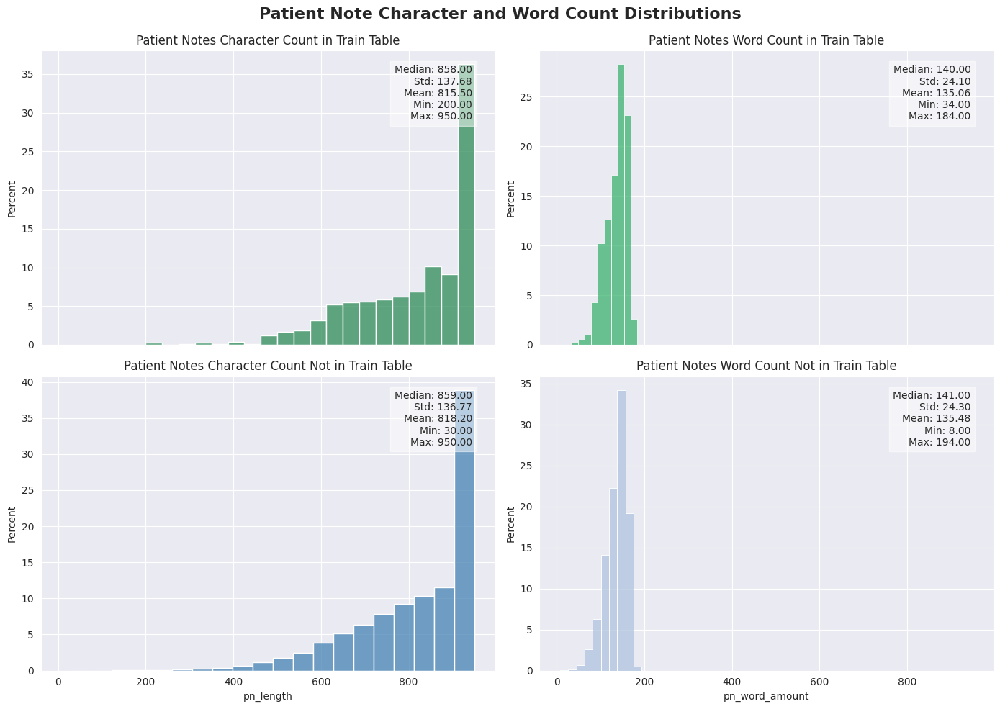

In [32]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10), sharex=True)

plot_histogram_with_stats(
    pn_df.loc[get_df_mask_by_dataset_type(pn_df,"train"), 'pn_length'],
    'Patient Notes Character Count in Train Table',
    axes[0][0],
    color="seagreen",
    bins=20,
    stat="percent",
)


plot_histogram_with_stats(
    pn_df.loc[get_df_mask_by_dataset_type(pn_df,"train"), 'pn_word_amount'],
    'Patient Notes Word Count in Train Table',
    axes[0][1],
    color="mediumseagreen",
    stat="percent",
    bins=10
)

plot_histogram_with_stats(
    pn_df.loc[~pn_df.in_train, 'pn_length'],
    'Patient Notes Character Count Not in Train Table',
    axes[1][0],
    color="steelblue",
    bins=20,
    stat="percent"
)

plot_histogram_with_stats(
    pn_df.loc[~pn_df.in_train, 'pn_word_amount'],
    'Patient Notes Word Count Not in Train Table',
    axes[1][1],
    color="lightsteelblue",
    bins=10,
    stat="percent"
)

plt.tight_layout()
fig.suptitle("Patient Note Character and Word Count Distributions", fontsize=16, fontweight='bold')
plt.subplots_adjust(top=0.92)

plt.show()


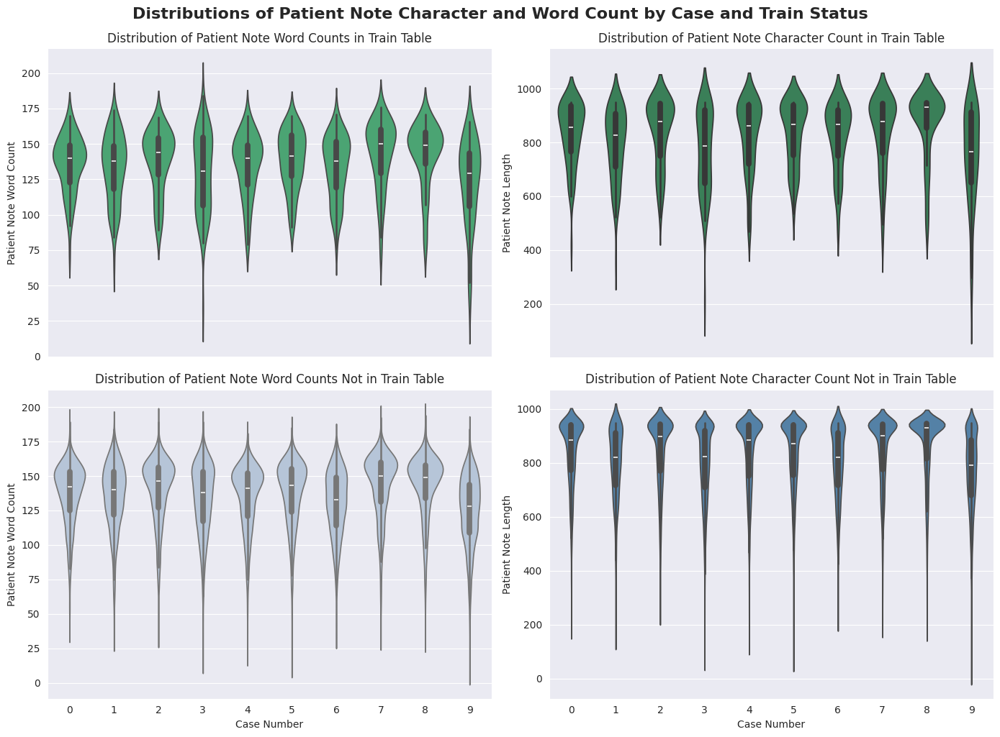

In [33]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10), sharex=True)

axes[0][0].set_title('Distribution of Patient Note Word Counts in Train Table')
axes[0][0].set_ylabel('Patient Note Word Count')

sns.violinplot(
    x='case_num', y='pn_word_amount',
    data=pn_df[get_df_mask_by_dataset_type(pn_df,"train")],
    ax=axes[0][0], color='mediumseagreen'
)

axes[1][0].set_title('Distribution of Patient Note Word Counts Not in Train Table')
axes[1][0].set_ylabel('Patient Note Word Count')

sns.violinplot(
    x='case_num', y='pn_word_amount',
    data=pn_df[pn_df['in_train'] == False],
    ax=axes[1][0], color='lightsteelblue'
)

axes[0][1].set_title('Distribution of Patient Note Character Count in Train Table')
axes[0][1].set_ylabel('Patient Note Length')

sns.violinplot(
    x='case_num', y='pn_length',
    data=pn_df[get_df_mask_by_dataset_type(pn_df,"train")],
    ax=axes[0][1], color='seagreen'
)

axes[1][1].set_title('Distribution of Patient Note Character Count Not in Train Table')
axes[1][1].set_ylabel('Patient Note Length')

sns.violinplot(
    x='case_num', y='pn_length',
    data=pn_df[pn_df['in_train'] == False],
    ax=axes[1][1], color='steelblue'
)

# Common xlabel for all plots
for ax in axes[1]:
    ax.set_xlabel('Case Number')

plt.tight_layout()
plt.suptitle("Distributions of Patient Note Character and Word Count by Case and Train Status", fontsize=16, fontweight='bold', y=1.02)
plt.show()


From observing both the histograms and violin plots we can see that:
- A typical patient note has around 150 words and 800 characters, while there are a few outliers containing fewer word. For now, there don't appear to be any special cases we should handle.
- The text size distribution of the train table data is quite similar to that of the entire patient notes dataset.

The next question we will cover is *What are the typical lengths (in characters and words) of individual annotations and feature texts?*

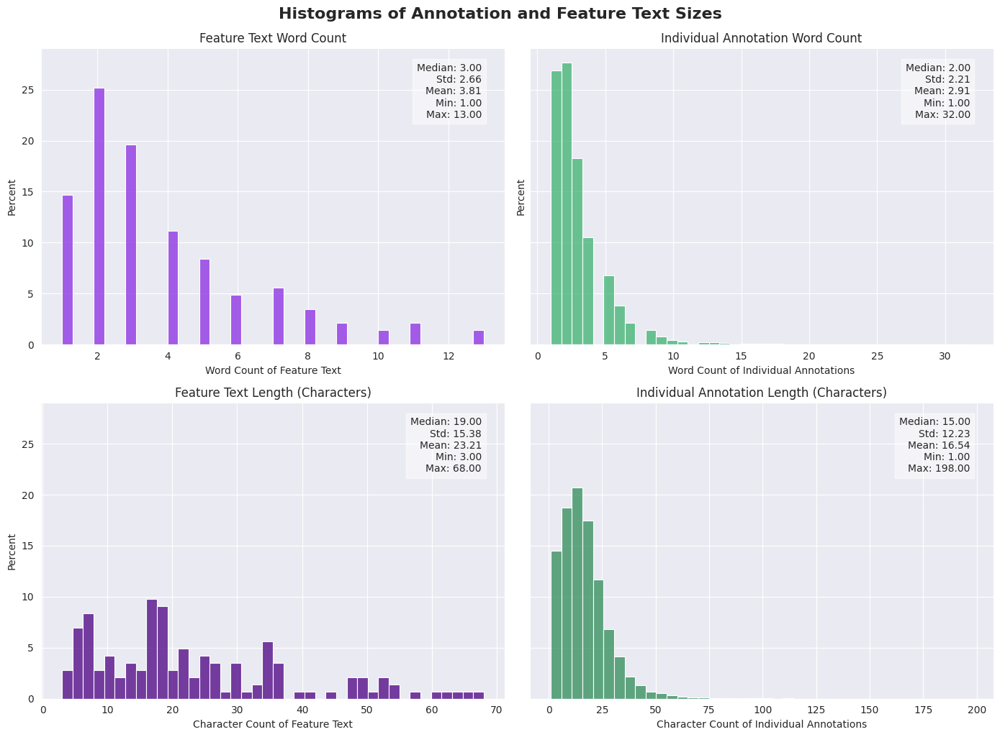

In [34]:
annotation_df = train_df.loc[get_df_mask_by_dataset_type(train_df,"train")].explode(['annotation', 'location']).dropna(subset=['annotation', 'location']).reset_index(drop=True)
annotation_df["annotation_length"] = annotation_df['annotation'].str.len()
annotation_df["annotation_word_counts"] = annotation_df['annotation'].str.split().apply(len)

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10), sharey=True)

axes[0, 0].set_xlabel('Word Count of Feature Text')
plot_histogram_with_stats(
    features_df['feature_text'].str.split(" ").apply(len),
    'Feature Text Word Count',
    axes[0, 0],
    color='blueviolet',
    bins=40,
    stat="percent"
)

axes[1, 0].set_xlabel('Character Count of Feature Text')
plot_histogram_with_stats(
    features_df['feature_text'].str.len(),
    'Feature Text Length (Characters)',
    axes[1, 0],
    color='indigo',
    bins=40,
    stat="percent"
)

axes[0, 1].set_xlabel('Word Count of Individual Annotations')
axes[0, 1].set_ylabel('Percentage')

plot_histogram_with_stats(
    annotation_df["annotation_word_counts"],
    'Individual Annotation Word Count',
    axes[0, 1],
    color='mediumseagreen',
    bins=40,
    stat="percent"
)

axes[1, 1].set_xlabel('Character Count of Individual Annotations')
plot_histogram_with_stats(
    annotation_df["annotation_length"],
    'Individual Annotation Length (Characters)',
    axes[1, 1],
    color='seagreen',
    bins=40,
    stat="percent"
)
plt.tight_layout()
plt.suptitle('Histograms of Annotation and Feature Text Sizes', fontsize=16, fontweight='bold', y=1.02)
plt.show()


The figures shows that both the feature text and individual annotations are generally quite short, usually just a few words.

However, looking more closely at the annotation text sizes:

- We observe some annotations that are notably longer, with the maximum reaching 32 words. This suggests some annotations are considerably more detailed.
- We also see annotations with very short character counts, with the minimum being just one character. These could represent abbreviations or specific codes.

On the other hand, the feature text has a more limited length range. The word count tops out at 13 words, and the shortest is 3 characters. This indicates a more consistent length for feature descriptions.

Given these observations, particularly the longer and very short annotations, it would be beneficial to examine these outliers to better understand their content and potential importance for our analysis:

In [35]:

def identify_outliers(df: pd.DataFrame, group_col: str, value_col: str) -> pd.DataFrame:
    """Identify outliers in a DataFrame using the IQR method within each group.

    Args:
        df: A Pandas DataFrame containing the data.
        group_col: The name of the column to group by.
        value_col: The name of the column to check for outliers.

    Returns:
        A DataFrame containing all rows identified as outliers.
    """
    grouped = df.groupby(group_col)[value_col]
    Q1 = grouped.transform(lambda x: x.quantile(0.25))
    Q3 = grouped.transform(lambda x: x.quantile(0.75))
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    is_outlier = (df[value_col] < lower_bound) | (df[value_col] > upper_bound)
    return df[is_outlier]

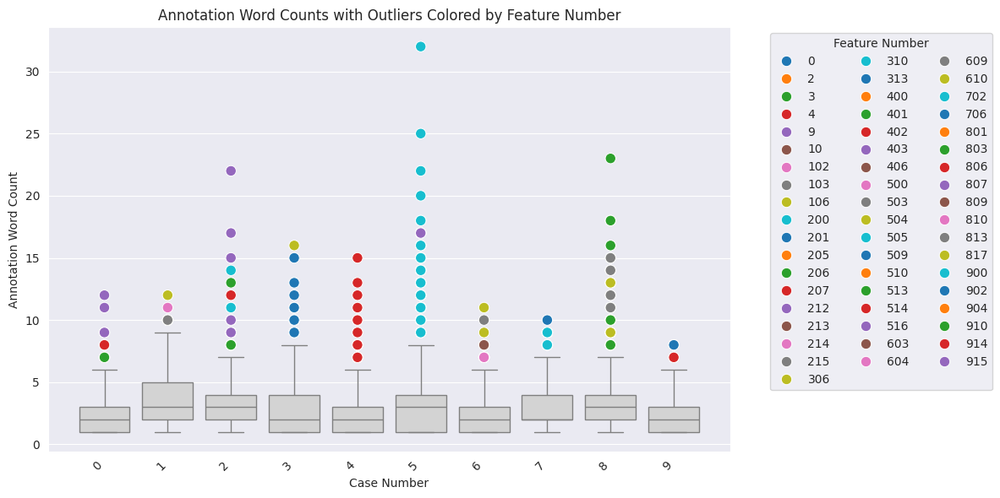

In [36]:
outliers_df = identify_outliers(annotation_df, 'case_num', 'annotation_word_counts')

plt.figure(figsize=(12, 6))

sns.boxplot(x='case_num', y='annotation_word_counts', data=annotation_df, color='lightgray',showfliers=False,
)

sns.scatterplot(data=outliers_df, x='case_num', y='annotation_word_counts',
                hue='feature_num', palette='tab10', s=80, legend='auto')

plt.title('Annotation Word Counts with Outliers Colored by Feature Number')
plt.xlabel('Case Number')
plt.ylabel('Annotation Word Count')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Feature Number', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend(
    title="Feature Number",
    bbox_to_anchor=(1.05, 1),
    ncol=3
)
plt.tight_layout()
plt.show()

Most annotation word counts are fairly consistent across cases, showing no major anomalies.

However, a few features—like 505 and 402—stand out with significantly longer annotations. Comparing these to features with shorter annotations could help explain the differences:

In [37]:
from IPython.display import display, HTML

html_output = ""

for feature_num in [505, 402]:
    annotations = annotation_df[annotation_df['feature_num'] == feature_num]
    feature_text = features_df.loc[features_df.feature_num == feature_num, 'feature_text'].iloc[0]

    html_output += f"<h3>Feature {feature_num}</h3>"
    html_output += f"<p><b>Feature text:</b> {feature_text}</p>"

    html_output += "<p><u>Example annotation:</u></p><ul>"

    for annotation in annotations['annotation'].head(5):
        html_output += f"<li>{annotation}</li>"
    html_output += "</ul>"

    if feature_num == 505:
        long_505 = annotations[annotations.annotation_word_counts == 32]
        html_output += "<p><u>Extra long annotation (32 words):</u></p><ul>"
        for annotation in long_505['annotation'].head(5):
          html_output += f"<li>{annotation}</li>"
          html_output += "</ul>"

short = annotation_df[annotation_df.annotation_length < 5].copy()
html_output += "<h3>Shorter Annotations (length &lt; 5)</h3><ul>"
for _, row in short.head(5).iterrows():
    html_output += f"<li>{row['annotation']} <br><small><i>(Feature {row['feature_num']} text: {row['feature_text']})</i></small></li>"
html_output += "</ul>"

display(HTML(html_output))

**Observing the annotation samples reveals several insights:**

1. **Use of abbreviations:** Medical abbreviations (e.g., **CBC**, **ECG**, **WNL**, **SOB**) are common. Our model needs to recognize these to interpret the annotations correctly.

2. **Capitalization can be inconsistent:** We see full sentences with different capitalization ("TAKES CARE OF SICK MOTHER" vs. "taking care of her elderly mother and in-laws"). Our model should probably ignore capitalization so it doesn't get confused by these differences.

3. **Annotation length reflects complexity:** Longer annotations typically correspond to more complex features, like **Feature 505**, which requires detailed medical descriptions. Simpler features, such as **gender** or **age**, are usually described briefly. Most annotations are concise, with only a few edge cases requiring more detailed descriptions, which need deeper contextual understanding.

### Exploring Properties Of Annotations
In this section, we will explore further questions related to the annotation data:

- **How many annotations are typically associated with each feature within a patient note?**  
We look at how often each feature is annotated in a patient note to understand the coverage and variation.

- **What is the structure of annotations?**  
  We analyze how many spans each annotation contains and how long they are.

- **How far apart are spans within a single annotation?**  
  We measure the distances between spans to understand how fragmented annotations tend to be.

- **How much of the patient note text is actually annotated?**  
  We calculate the proportion of annotated words per patient-note-feature pair and across the entire dataset.

- **Is the data balanced?**  
  We assess the overall balance between annotated and non-annotated content, revealing potential challenges for model learning.

These questions guide our exploration and help highlight important patterns and edge cases in the data.

In [38]:
train_df["annotation_amount"] = train_df.annotation.apply(len)

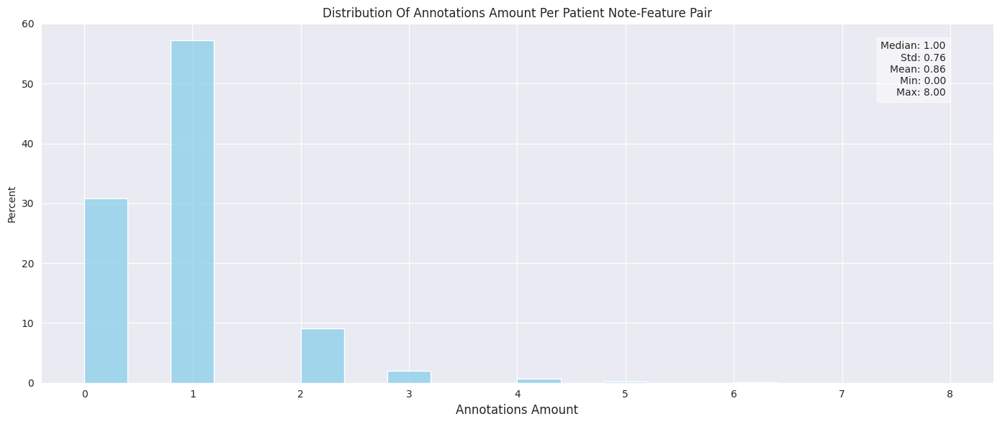

In [39]:
plt.figure(figsize=(14, 6))
plot_histogram_with_stats(data=train_df["annotation_amount"], title='Distribution Of Annotations Amount Per Patient Note-Feature Pair', ax=plt.gca(), color="skyblue", stat="percent", bins=20)
plt.xlabel('Annotations Amount', fontsize=12)
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

From the histogram, we can observe that:
- **Mostly Single Annotations** - Around 57% of patient note-feature pairs have just one annotation, which is the most common.
- **Many Unannotated** - About 30% of pairs have no annotation at all, the second most common case.
- **Few Multiple Annotations** - Having more than one annotation per pair is rare (9% for two, even less for more). The maximum is 8, but that's unusual.

<ipython-input-40-049628a073ac>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=metrics_long_df, x='metric', y='value', palette='viridis', showfliers=False)


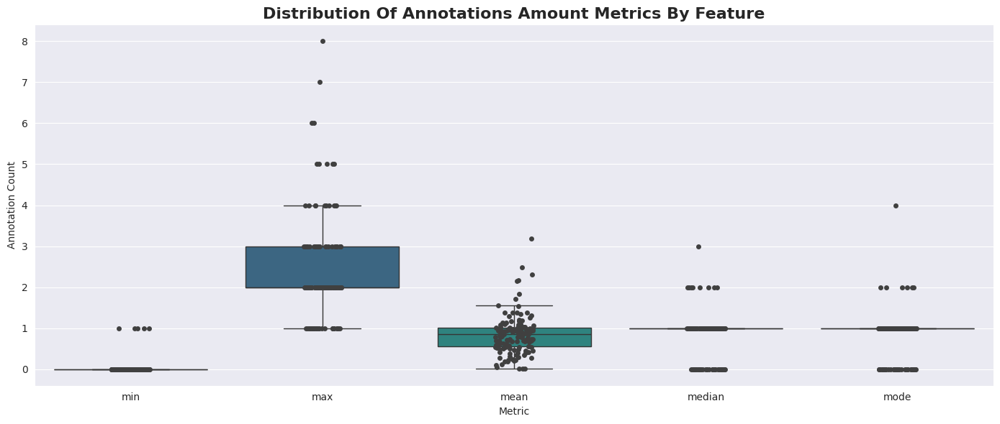

In [40]:
annotations_per_feature_df = train_df.loc[get_df_mask_by_dataset_type(train_df, "train")].groupby("feature_num").agg(
    min=("annotation_amount", "min"),
    max=("annotation_amount", "max"),
    mean=("annotation_amount", "mean"),
    median=("annotation_amount", "median"),
    mode=("annotation_amount", lambda x: x.mode().iloc[0] if not x.mode().empty else None)
).reset_index()

plt.figure(figsize=(14, 6))


metrics_long_df = annotations_per_feature_df.melt(
    id_vars='feature_num',
    var_name='metric',
    value_name='value'
)

sns.stripplot(data=metrics_long_df, x='metric', y='value', jitter=True, color=".25")


sns.boxplot(data=metrics_long_df, x='metric', y='value', palette='viridis', showfliers=False)

plt.title('Distribution Of Annotations Amount Metrics By Feature', fontsize=16, fontweight='bold')
plt.xlabel('Metric')
plt.ylabel('Annotation Count')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

Looking at the box plot, we see that:

* Most features have some patient notes without annotations (low 'min', points at 0).
* All features have at least one annotation (no 'max' below 0).
* Many features often have one annotation per note ('mean'/'median'/'mode' around 1), but a lot also frequently have zero ('mean'/'median'/'mode' often 0).
* Most features have notes with multiple annotations ('max' > 1, scattered points), but this varies.

In [41]:
def render_annotations(annotations: list[str], locations: list[str]) -> str:
    """
    Generate HTML list of annotations with their corresponding locations.

    Args:
        annotations: A list of annotation strings.
        locations: A list of location strings corresponding to each annotation.

    Returns:
        A string containing HTML formatted <ul> list of annotations and locations.
    """
    return "<ul>" + "".join(
        f"<li>{a} <span style='color:gray'>(location: {loc})</span></li>"
        for a, loc in zip(annotations, locations)
    ) + "</ul>"

def render_feature_examples(feature_nums: list[int], train_df: pd.DataFrame, features_df: pd.DataFrame, min_annotations: int) -> str:
    """
    Generate HTML examples of annotations for given feature numbers.

    Args:
        feature_nums: List of feature_num to include.
        train_df: DataFrame with annotation and location info.
        features_df: DataFrame with feature_num and feature_text.
        min_annotations: Minimum number of annotations required for examples.

    Returns:
        HTML string of feature examples.
    """
    subset = train_df[train_df["feature_num"].isin(feature_nums) & (train_df["annotation_amount"] >= min_annotations)]
    subset = subset.drop_duplicates(subset=["feature_num"])

    def row_to_html(row):
        items_html = render_annotations(row["annotation"], row["location"])
        return f"<li><b>{row['feature_text']}</b><br/><i>Annotations from one sample:</i>{items_html}</li>"

    return "\n".join(subset.apply(row_to_html, axis=1))

example_row = train_df.loc[train_df.annotation_amount == 8].iloc[0]
annotations_with_locations = list(zip(example_row["annotation"], example_row["location"]))
feature_text_of_annots = example_row["feature_text"]

low_annot_features = metrics_long_df.query("metric == 'mean' and value < 0.1")["feature_num"].tolist()
high_annot_features = metrics_long_df.query("metric == 'mode' and value > 1")["feature_num"].tolist()

html_output = f"""
<h3>Example: Case with 8 Annotations</h3>
<ul>
    <li><b>Feature Text:</b> {feature_text_of_annots}</li>
    <li><b>Annotations:</b>
        <ol>
            {''.join(f'<li>{a} <span style="color:gray">(location: {loc})</span></li>' for a, loc in annotations_with_locations)}
        </ol>
        <i>(This is just one specific sample from the training data)</i>
    </li>
</ul>

<h3>Features with Almost No Annotations (mean &lt; 0.1)</h3>
<ul>{render_feature_examples(low_annot_features, train_df, features_df, min_annotations=1)}</ul>

<h3>Features That Usually Have More Than One Annotation (mode &gt; 1)</h3>
<ul>{render_feature_examples(high_annot_features, train_df, features_df, min_annotations=2)}</ul>
"""

display(HTML(html_output))


From looking at the samples, we can see multiple phenomena:
- **Overlapping annotations:** The same text span can have multiple annotations (e.g., "irregular periods" and "heavy periods" in "heavy periods OR irregular periods").
- **Granularity and domain knowledge:** Annotations vary in detail and require different degrees of domain knowledge. Some annotations may simply repeat a term from the feature text, while others require understanding of related symptoms or medical concepts (e.g., "tampon change every 2 hours" for "heavy periods").
- **Repetitive annotations within a sample:** The same concept can be annotated multiple times within the same text.
- From these examples alone, the reason for certain features to have low annotation counts is still unclear.

Let's continue investigating the annotations by examining their structure and fragmentation, specifically by analyzing the spans:

In [42]:
annotation_df['location'] = annotation_df['location'].str.split(';')
annotation_df['num_spans'] = annotation_df['location'].apply(len)

In [43]:
def calculate_span_distances(row: pd.Series) -> list[int]:
    """
    Calculate the distances between consecutive spans in words.

    Args:
        row (pd.Series):
        contains the following:
        location: A list of span ranges (e.g., [0 5,10 15]).
                        Each span is represented as "start end" with start and end positions as integers.
        annotation_text : The text where spans are located, used to count words between spans.

    Returns:
        list[int]:
            - A list of distances in words between consecutive spans.
    """
    spans = [tuple(map(int, span.split())) for span in row.location]

    distances_characters = []
    distances_words = []

    for (start1, end1),(start2, end2) in zip(spans[:-1], spans[1:]):
        distances_words.append(len(row["pn_history"][end1:start2].split()))
    return distances_words

In [44]:
spans_dist_df = annotation_df
spans_dist_df['span_distances_words'] = annotation_df.apply(calculate_span_distances, axis=1)
spans_dist_df = spans_dist_df.explode(['span_distances_words']).dropna(subset=['span_distances_words']).reset_index(drop=True)

In [45]:
spans_df = annotation_df.explode(['location']).dropna(subset=['location'])

spans_df['span_start'] = spans_df['location'].apply(lambda x: int(x.split()[0]))
spans_df['span_end'] = spans_df['location'].apply(lambda x: int(x.split()[1]))

spans_df['span_word_count'] = spans_df.apply(lambda row: len(row["pn_history"][row['span_start']:row['span_end']].split()), axis=1)

spans_df['span_index'] = spans_df.groupby(level=0).cumcount()


<ipython-input-46-428c5aa44858>:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


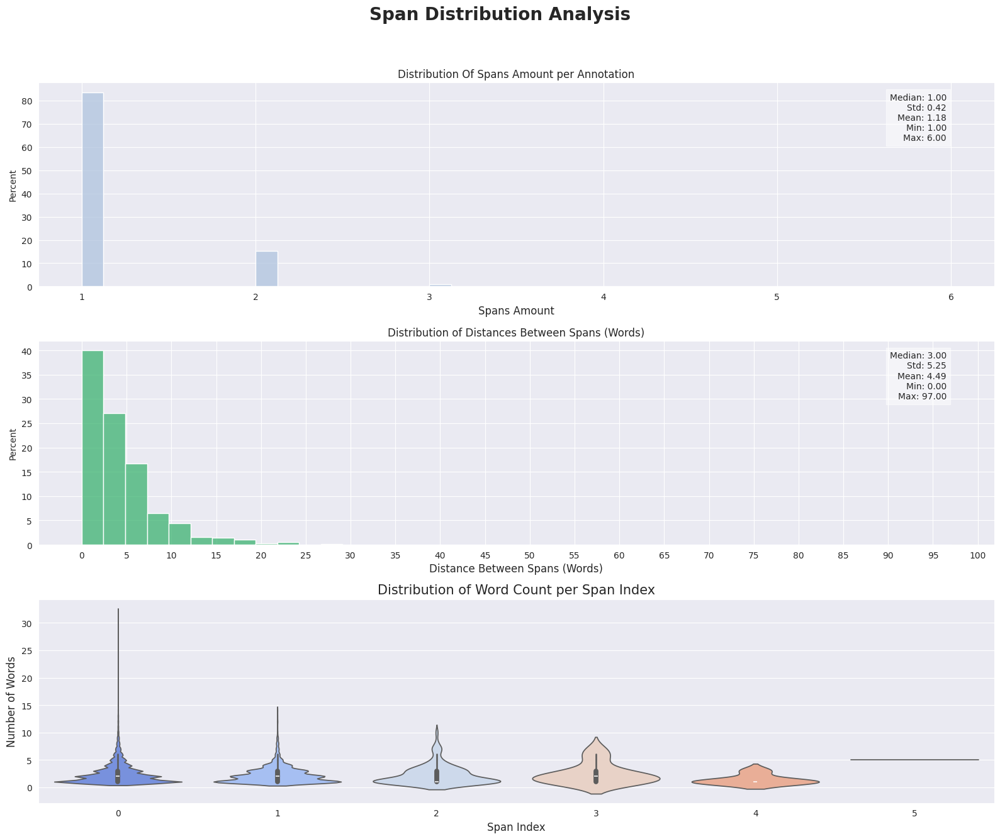

In [46]:
fig = plt.figure(figsize=(16, 14))
fig.suptitle('Span Distribution Analysis', fontsize=20, fontweight='bold')
axes = [fig.add_subplot(3,1,i) for i in range(1,4)]
axes[0].set_xlabel('Spans Amount', fontsize=12)

plot_histogram_with_stats(
    annotation_df['num_spans'],
    'Distribution Of Spans Amount per Annotation',
    axes[0],
    color='lightsteelblue',
    bins=40,
    stat="percent"
)
axes[1].set_xlabel('Distance Between Spans (Words)', fontsize=12)
max_dist = spans_dist_df['span_distances_words'].max()
axes[1].set_xticks(range(0, int(100)+5, 5))
plot_histogram_with_stats(
    spans_dist_df['span_distances_words'],
    'Distribution of Distances Between Spans (Words)',
    axes[1],
    color='mediumseagreen',  # Teal
    bins=40,
    stat="percent"
)


axes[2].set_xlabel('Span Index', fontsize=12)
axes[2].set_ylabel('Number of Words', fontsize=12)
axes[2].set_title('Distribution of Word Count per Span Index', fontsize=15)
spans_df['span_index'] = spans_df['span_index'].astype(str)
sns.violinplot(
    data=spans_df,
    x='span_index',
    y='span_word_count',
    ax=axes[2],
    palette='coolwarm'
)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Based on the span analysis graphs, here are some key findings about the distribution of spans within annotations:
- **Most annotations have a single span** (approximately 85%)  - almost 15% have two spans and more than that is rare having maximum of 6 spans in a single annotations.
- **When annotations have multiple spans, the distances between them are generally short:** around 60% have a distance of 5 words or less, and around 40% have a distance of 5 to 25 words. Larger distances are uncommon (maximum 97 words).
- Span length is generally consistent across different span indices.

Let's look at some different samples of annotations with multiple spans.

In [47]:
def render_annotation_details_with_skips(row: pd.Series, feature_text: str, note_text: str, title: str) -> str:
    html = f"""
    <h4>{title}</h4>
    <ul>
        <li><b>Feature Text:</b> {feature_text}</li>
        <li><b>Number of Spans:</b> {row.num_spans}</li>
        <li><b>Span Details (with skipped text):</b></li>
    </ul>
    <ol style="font-family: monospace;">
    """

    for i, loc_str in enumerate(row.location):
        start, end = map(int, loc_str.split())
        span_text = note_text[start:end]

        if i > 0:
            prev_end = int(row.location[i - 1].split()[1])
            skipped = note_text[prev_end:start].strip()
            distance = row.span_distances_words[i - 1]
            html += f"""
            <li><span style='color:gray;'>↑ Distance from previous span: {distance} words</span></li>
            <li><i style='color:#999;'>Skipped text:</i> <code style="color:#b33;'">{skipped}</code></li>
            """

        html += f"<li><b>Text:</b> <code>{span_text}</code> <span style='color:gray;'>(location: {start} {end})</span></li>"

    html += "</ol><hr>"
    return html

row_many_spans = annotation_df.query("num_spans >= 6").iloc[0]
feature_text_1 = row_many_spans["feature_text"]
note_text_1 = row_many_spans["pn_history"]
html1 = render_annotation_details_with_skips(row_many_spans, feature_text_1, note_text_1, "🧵 Annotation with Many Spans (≥ 6)")

row_long_dist = annotation_df[annotation_df.id.isin(spans_dist_df.query("span_distances_words > 90").id)].iloc[0]
feature_text_2 = row_long_dist["feature_text"]
note_text_2 = row_long_dist["pn_history"]
html2 = render_annotation_details_with_skips(row_long_dist, feature_text_2, note_text_2, "📏 Annotation with Long Distance Between Spans (> 90 Words)")

row_mid_dist = annotation_df[annotation_df.id.isin(spans_dist_df.query("span_distances_words >= 20 and span_distances_words <= 30").id)].iloc[1]
feature_text_3 = row_mid_dist["feature_text"]
note_text_3 = row_mid_dist["pn_history"]
html3 = render_annotation_details_with_skips(row_mid_dist, feature_text_3, note_text_3, "⚖️ Annotation with Medium Span Distance (~20 Words)")

display(HTML(html1 + html2 + html3))

From observing the annotations we gain new insights:
- Short-distance separation of spans appears to be used to exclude less informative words. For instance, the word 'maybe' is skipped between the spans 'had' and '4 occurrences'.
- Longer-distance spans are used to group together related but non-contiguous information. For example, the words 'pain' and 'RLQ', separated by 20 words, are grouped together for the feature 'right lower quadrant abdominal pain'.

These findings suggest that our models must be capable of handling discontinuous annotations (which account for approximately 15% of the annotations, as we saw earlier) and understanding relationships between words separated by varying distances, while also avoiding the annotation of minimally informative words.

Annotations often consist of short, specific segments within the notes, potentially leading to significant data imbalances. Let's investigate this further:

In [48]:
def create_tuple_of_words_indices(row: pd.Series) -> set[tuple[int,int]]:
  """
  Extracts a set of (start, end) index tuples for words in annotation.

  Parameters:
  - row (pd.Series): a pandas series containing:
  - 'location' (list of str): List of space-separated start and end indices for each annotation span.
  - 'annotation' (str): The annotated text.

  Returns:
  - Set[Tuple[int, int]]: A set of tuples where each tuple represents the start and end character indices of a word in the annotation.

  """
  locations = iter(row['location'])
  word_start, end_span = map(int, next(locations).split())
  annotation_words_list = row['annotation'].split()
  words_indices_set = set()
  for word in annotation_words_list:
    word_end = word_start + len(word)
    if end_span< word_end:
      word_start, end_span = map(int, next(locations).split())
      word_end = word_start+len(word)

    words_indices_set.add((word_start, word_end))
    word_start = word_end + 1
  return words_indices_set

annotation_df["words_indices_set"] = annotation_df.apply(create_tuple_of_words_indices, axis=1)

annotated_words_amount_per_id_df = (
    annotation_df
    .groupby(["id", "pn_num"])["words_indices_set"]
    .apply(lambda x: len(set.union(*x.tolist())))
    .rename("annotated_words_amount")
    .reset_index()
)

words_amount_df = pn_df.loc[get_df_mask_by_dataset_type(pn_df,"train")].merge(annotated_words_amount_per_id_df, left_on="pn_num", right_index=True)

In [49]:
annotated_words_amount = int(words_amount_df['annotated_words_amount'].sum())
non_annotated_words_amount = words_amount_df['pn_word_amount'].sum() - annotated_words_amount

<ipython-input-50-3de65ec35dda>:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


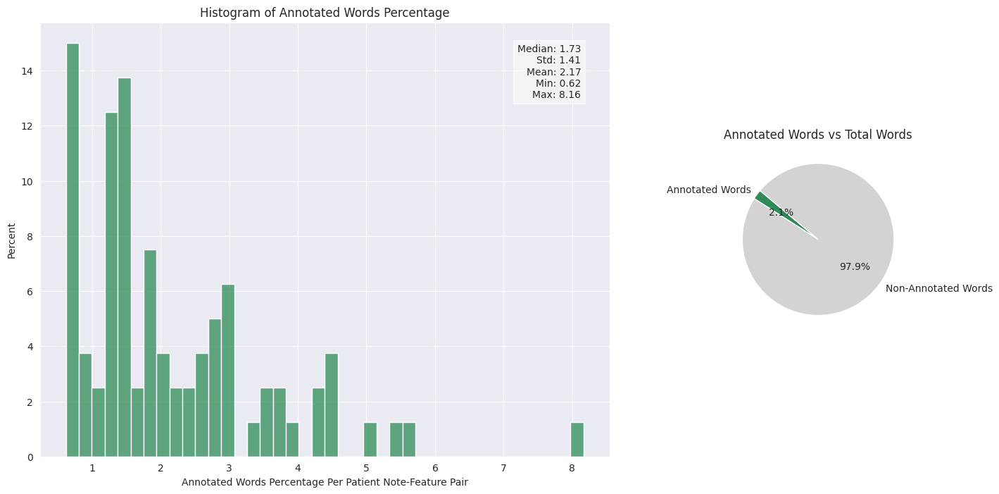

In [50]:
labels = ['Annotated Words', 'Non-Annotated Words']
sizes = [annotated_words_amount, non_annotated_words_amount]
colors = ['seagreen', 'lightgray']

fig = plt.figure(figsize=(16, 8))
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1], wspace=0.3)

ax_hist = fig.add_subplot(gs[0])
plot_histogram_with_stats(
    (words_amount_df['annotated_words_amount'] / words_amount_df['pn_word_amount']) * 100,
    "Histogram of Annotated Words Percentage",
    ax_hist,
    colors[0],
    bins=40,
    stat="percent"
)
ax_hist.set_xlabel('Annotated Words Percentage Per Patient Note-Feature Pair')

ax_pie = fig.add_subplot(gs[1])
ax_pie.pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140)
ax_pie.set_title('Annotated Words vs Total Words')

plt.tight_layout()
plt.show()


**The data is clearly imbalanced**.
- For any given patient-note feature pair, annotated words are only a small part of the whole thing, usually less than 3% and never more than 9%.
- Consequently, for each patient-note feature pair, the vast majority of words are not annotated. A naive classifier predicting no annotations would achieve approximately 97.9% accuracy.

### Visualizing Annotations Within Full Patient Notes

To better understand the nature of the annotations, we visualize them in the context of the entire patient note. This allows us to explore how annotated spans are distributed, how they relate to surrounding text, and what kinds of information are most frequently marked as relevant.

In [51]:
from spacy import displacy

def get_patient_annotation_doc(pn_num: int, feature_num: int|None = None) -> dict:
    """
    Retrieves the annotated patient history for a given patient note and optional feature number.

    Args:
        pn_num (int): Patient note number.
        feature_num (Optional[int]): Specific feature number to filter annotations (default is None).

    Returns:
        dict: A dictionary containing the patient history text and its annotations.
    """
    if feature_num is not None:
        subset = train_df[(train_df['pn_num'] == pn_num) & (train_df['feature_num'] == feature_num)].copy()
    else:
        subset = train_df[train_df['pn_num'] == pn_num].copy()

    pn_text = subset["pn_history"].iloc[0]
    locations = subset["location"]

    ents = []
    for location_list in locations:
        for location in location_list:
            list_of_location_indices = parse_location_string(location)
            for annot_slice in list_of_location_indices:
                ents.append({
                    'start': annot_slice[0],
                    'end': annot_slice[1],
                    'label': "Annotation"
                })

    ents = sorted(ents, key=lambda i: i['start'])

    return {
        'text': pn_text,
        'ents': ents
    }

def display_doc_with_colors(doc: dict, colors_map: dict) -> None:
  options = {"colors": colors_map}
  displacy.render(doc, style='ent', options=options, manual=True, jupyter=True)



def display_patient_annotation(pn_num: int, feature_num: int | None = None) -> None:
    """
    Displays annotated patient history for a given patient and optional feature.

    Args:
        pn_num (int): Patient note number.
        feature_num (Optional[int]): Feature number to filter annotations (default is None).

    Returns:
        None
    """
    doc = get_patient_annotation_doc(pn_num, feature_num)

    print("*" * 80)
    print(f"\nPatient Number: {pn_num}")
    print("\nAnnotated Patient History")

    colors_map = {"Annotation": "pink"}
    display_doc_with_colors(doc, colors_map)

# choosing random patient notes ids:
display_patient_annotation(93534)
display_patient_annotation(82028)
display_patient_annotation(20643)

********************************************************************************

Patient Number: 93534

Annotated Patient History


********************************************************************************

Patient Number: 82028

Annotated Patient History


********************************************************************************

Patient Number: 20643

Annotated Patient History


Based on the examined samples, we observe that annotations commonly include:

- Age and time terms in various formats
- Medical terms, including abbreviations
- Gender-related terms in different formats
- Stop words that are essential for understanding the full meaning of the annotation
- Details regarding the patient's general habits

Additionally, it is apparent that overlaps between different annotations can occasionally occur.

Note that not all of the terms listed above will always be annotated, as it depends on their relevance to the case and it's existing features.

### Vocabulary Analysis in Labeled Data
This section explores the vocabulary used across three core text sources in the training dataset:

1. Feature descriptions (feature_text)
2. Annotated spans (annotation)
3. Full patient notes (pn_history)

By comparing the vocabulary across these sources, we aim to answer questions like:
- How much do annotations resemble their associated feature text?
- What distinguishes annotation vocabulary from the rest of the words in the patient note?
- How much overlap exists between these text sources at a lexical level?

In [52]:
def generate_word_cloud(text: str):
  return WordCloud(width=800, height=400, background_color="white", colormap="viridis").generate(text)

In [53]:
feature_text = " ".join(features_df['feature_text'].astype(str).dropna().tolist())
annot_text = " ".join(annotation_df['annotation'].dropna().tolist())
pn_text_in_train = " ".join(pn_df.loc[get_df_mask_by_dataset_type(pn_df,"train"),'pn_history'].str.strip().dropna().tolist())

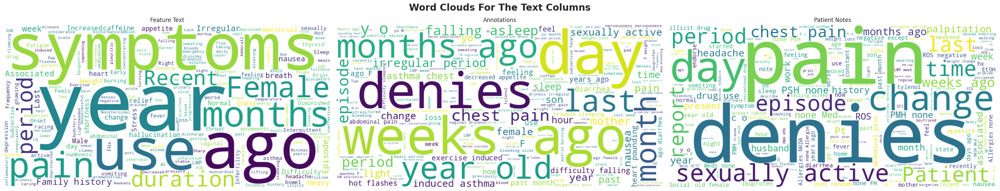

In [54]:
fig, axes = plt.subplots(1, 3, figsize=(30, 6))
fig.suptitle('Word Clouds For The Text Columns', fontsize=20, fontweight='bold')

text_n_title_list = [
    (feature_text, "Feature Text"),
    (annot_text, "Annotations"),
    (pn_text_in_train, "Patient Notes")
]

for i in range(3):
    text, title = text_n_title_list[i]
    axes[i].imshow(generate_word_cloud(text))
    axes[i].set_title(title)
    axes[i].axis("off")

plt.tight_layout()
plt.show()

As expected, the word clouds for feature text and annotations are highly similar. Interestingly, time-related terms stand out in both, whereas they appear less prominently in the patient notes word cloud. However, many terms are shared across all three word clouds

In [55]:
feature_words_sensitive = set(feature_text.split())
annot_words_sensitive = set(annot_text.split())
pn_words_sensitive = set(pn_text_in_train.split())

feature_words_insensitive = set(feature_text.lower().split())
annot_words_insensitive = set(annot_text.lower().split())
pn_words_insensitive = set(pn_text_in_train.lower().split())

As we already noticed before, same words appear with different casing

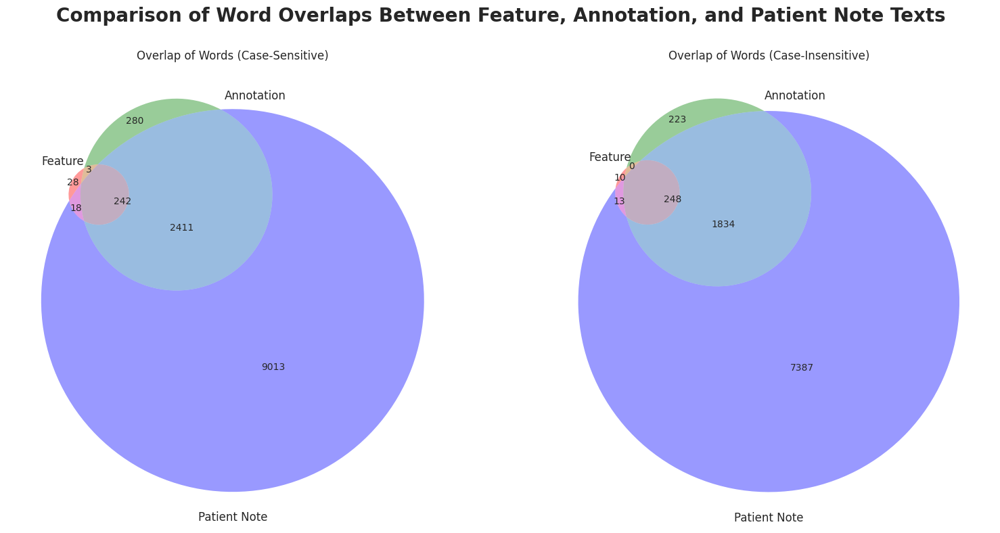

In [56]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle('Comparison of Word Overlaps Between Feature, Annotation, and Patient Note Texts', fontsize=20, fontweight='bold')


venn3([feature_words_sensitive, annot_words_sensitive, pn_words_sensitive],
      ('Feature', 'Annotation', 'Patient Note'), ax=axes[0])
axes[0].set_title("Overlap of Words (Case-Sensitive)")

venn3([feature_words_insensitive, annot_words_insensitive, pn_words_insensitive],
      ('Feature', 'Annotation', 'Patient Note'), ax=axes[1])
axes[1].set_title("Overlap of Words (Case-Insensitive)")

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the suptitle
plt.show()


It is interesting to note that compared to the patient notes word set, the set of annotation words is relatively small, yet it contains most of the feature words.

The fact that the annotation word set is not fully contained within the patient notes word set suggests that some spans start or end in the middle of a word in the patient notes (defined as a string sequence up to the next space), accounting for approximately 20%.

In [57]:
list(annot_words_insensitive - pn_words_insensitive)[:30]

['burning/nawing',
 'hemotochezia',
 'out"',
 'unpredictable"',
 'intolearance',
 'asting',
 'efective',
 'unsuccessflly',
 'appetie',
 '"unpredictable',
 'insomina',
 'stabby',
 '25-28days',
 'toughts',
 'unpredictably',
 'hevier',
 'happe',
 'thougths',
 'intermittnetly',
 'activitie',
 'benefit',
 'plapations',
 'unsuccesful',
 'dates',
 'apettite',
 'quadrent',
 'achiness',
 '+fatigue',
 '2-3/day',
 'shaking']

After examining samples of words that appear only in annotations but not in the patient notes, it seems that many of them result from annotations starting or ending in the middle of a word. I hypothesize that replacing all non-alphanumeric characters with spaces will significantly reduce this issue. Let’s test this hypothesis.

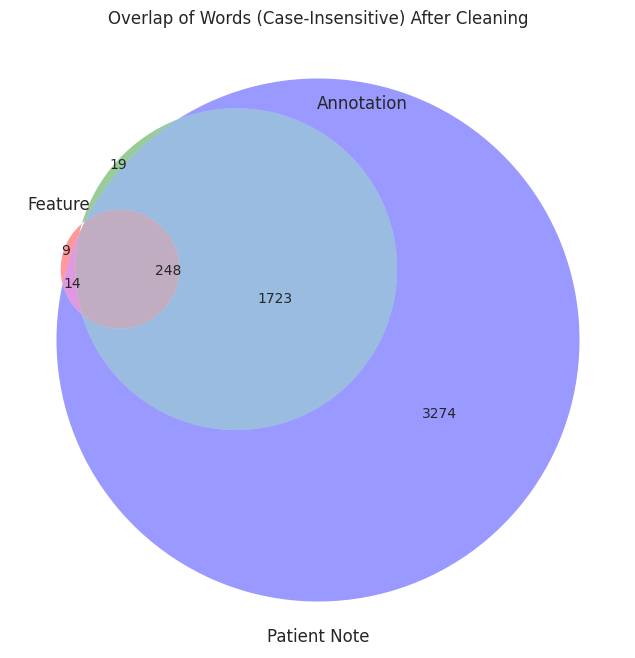

In [58]:
def clean_text_and_split_to_words(df: pd.DataFrame, column: str) -> set:
  """
  Cleans text by converting to lowercase, removing non-word characters (except apostrophes),
  and split into a set of unique words.

  Parameters:
  - df (pd.DataFrame): DataFrame containing the text column
  - column (str): Column name containing text data

  Returns:
  - set: A set of cleaned, unique words
  """
  cleaned_text = " ".join(
      df[column]
      .dropna()  # Handle missing values
      .str.lower()  # Convert to lowercase
      .replace(r"[^\w']", " ", regex=True)  # Remove non-word characters except apostrophes
      .tolist()
  )
  return set(cleaned_text.split())


feature_words_cleaned = clean_text_and_split_to_words(features_df, 'feature_text')
annot_words_cleaned = clean_text_and_split_to_words(annotation_df, 'annotation')
pn_words_cleaned = clean_text_and_split_to_words(
    pn_df.loc[get_df_mask_by_dataset_type(pn_df, "train")], 'pn_history'
)

# Plot Venn diagram
plt.figure(figsize=(16, 8))
venn3(
    [feature_words_cleaned, annot_words_cleaned, pn_words_cleaned],
    ('Feature', 'Annotation', 'Patient Note'),
    ax=plt.gca()
)
plt.title("Overlap of Words (Case-Insensitive) After Cleaning")
plt.show()

The cleaning process significantly reduced the total word count and greatly decreased the occurrence of annotations that begin or end mid-word.

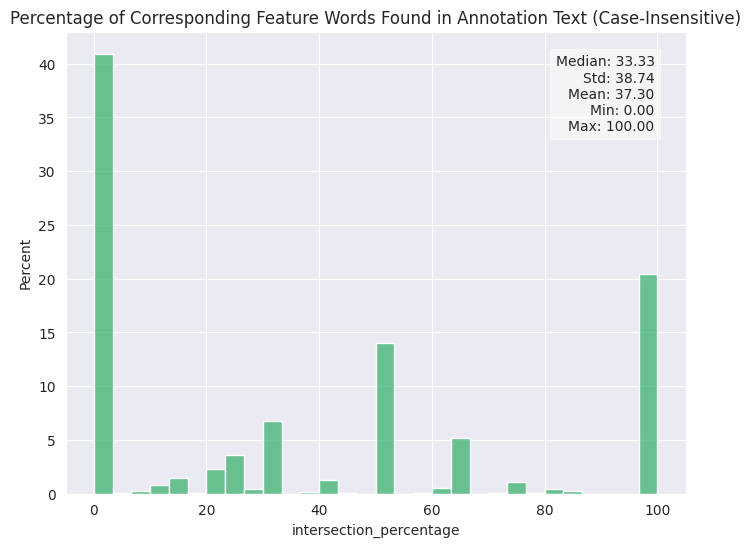

In [59]:
def feature_in_annotation_word_match_percentage(row: pd.Series) -> float:
  """
  Calculates the percentage of annotation words that appear in the corresponding feature text.

  Parameters:
  - row (pd.Series): A pandas Series containing 'annotation' and 'feature_text' columns.

  Returns:
  - float: The percentage of annotation words found in the feature text (0-100).
  """

  annotation_words = set(row['annotation'].lower().split())
  feature_words = set(row['feature_text'].lower().split())
  matched_words = annotation_words.intersection(feature_words)
  if annotation_words:
    return len(matched_words) / len(annotation_words) * 100
  else:
    return 0

annotation_df["intersection_percentage"] = annotation_df.apply(feature_in_annotation_word_match_percentage, axis=1)

fig, ax = plt.subplots(figsize=(8, 6))

plot_histogram_with_stats(annotation_df["intersection_percentage"],
                          title="Percentage of Corresponding Feature Words Found in Annotation Text (Case-Insensitive)",
                          ax=ax, color="mediumseagreen", bins=30, stat="percent")
plt.show()

Key findings from the histogram:

- **Variable Intersection:** Annotations vary in how much they overlap with the feature text (0% to 100%).

- **Low Overlap Common:** Many annotations have low overlap, using different vocabulary.

- **Most Above 33%:** Most annotations contain more than 33% of the feature text words.

- **Full Overlap Substantial:** About 20% of annotations match the feature text exactly.

These findings suggest that while feature text intersection can be a useful indicator, it should not be the sole basis for annotation.

### Key Insights from Data Exploration

### Data Structure:
- The labeled data trully contain 100 patient note for each of the 10 cases.
- Each case has 9-18 different features.
- Most of the data is unlabeled ~97.63%.
- The data is clearly imbalanced. A naive classifier that predicts no annotations would be correct for 97.9% of the words.

### Text Size Distributions:
- A typical patient note has around 150 words and 800 characters, this distribution remains mainly the same for each case.
- Both feature texts and individual annotations are usually short, often limited to single-digit word counts.
  - A few features lead to notably longer annotations, likely due to their complexity.

### Annotation Characteristics
- Most patient note-feature pairs have a single annotation (~57%).
- The second most common scenario is no annotation (~30%), while multiple annotations are less frequent.
- While every feature has at least some annotations, their frequency varies  — some are annotated more often than others.
- About 85% of annotations are contiguous spans in the text, but multi-span annotations are also used to skip irrelevant words or connect semantically related but distant terms.
- Overlapping annotations are possible and do occur.
- The complexity of annotations varies:
  - Some annotations simply echo terms from the feature text.
  - Others require domain knowledge to infer relevant symptoms or medical context.
  - The same concept may be annotated multiple times within the same patient note.
- Annotations often include:
  - Time expressions
  - Medical terminology (including abbreviations)
  - Demographic details (age, gender)
  - Patient habits
  - Essential stop words
- Not all terms from these categories are always annotated; inclusion depends on their relevance to the case and feature.

### Vocabulary Analysis
- The vocabulary used in the feature text is almost entirely contained within the annotation vocabulary (~90%), but makes up only ~10% of the total annotation vocabulary.
- The annotation vocabulary accounts for only ~25% of the full patient notes vocabulary.
  - Around 10% of the words in the annotations are not complete words in the patient notes.
  - After text cleaning, the annotation vocabulary increases to ~35% of the patient notes vocabulary, and the proportion of incomplete words drops to just 1%.
- Most annotations contain at least one word that also appear in the corresponding feature text.

### Implications for Method Development
Based on these findings, we need to design a method that classifies different text segments to determine whether they should be annotated. This classification should be done based on:
  - Analyzing the semantic relationship between the text segment and the corresponding feature text, leveraging domain knowledge where necessary.
  - Understanding context — the broader the contextual understanding, the better, though local context is also valuable.
  - Is as resilient as possible to variations in formats, abbreviations, synonyms, etc.
  - Handles with the imbalanced nature of the data.

## Feature Extraction

Following the comprehensive data exploration, we now transition into **feature extraction** — a critical step in preparing our data for modeling.

The objective of this phase is to convert raw patient notes, features, and annotations into structured, machine-readable representations that will enable the model to determine whether a given span of text should be annotated for a specific feature.

Since our goal is to build a model that classifies text segments based on their relevance to a feature, the first design choice is how to segment the patient notes:

- A **simple approach** is to treat each word as a segment and handle spacing separately.  
- A **more sophisticated alternative** involves advanced tokenization methods, which may account for punctuation, subwords, and other edge cases.

As observed in the earlier analysis, **99% of annotated words appear as complete words** in the patient notes after basic text cleaning. This, combined with the improved interpretability and ease of feature engineering when using word-level segments, supports our decision to proceed with the **word-based segmentation** approach — at least as a starting point.

Let’s add labels to the training table — this will help us test how useful our features actually are:

In [75]:
def create_label_for_train_row(train_row: pd.Series) -> np.ndarray:
  """
  Creates a binary label array for a given training row, indicating which character positions
  in the patient note are annotated.

  Parameters:
  - train_row (pd.Series): A row from the training DataFrame, containing 'pn_num' (patient note ID)
    and 'location' (list of annotated spans as strings).

  Returns:
  - np.ndarray: A binary array of length equal to the patient note's length,
    where 1 indicates an annotated character and 0 indicates non-annotated characters.
  """
  patient_note_length = pn_df[pn_df.pn_num==train_row.pn_num].pn_length.item()
  label = np.zeros(patient_note_length)
  for span_str in train_row.location:
    for start, end in parse_location_string(span_str):
      label[start:end] = 1
  return label
train_df["labels"] = train_df.apply(create_label_for_train_row, axis=1)

Let’s begin by generating word-level segments from the cleaned patient notes text:

In [ ]:
word_train_df = train_df.copy()
for col in ['feature_text', 'pn_history']:
    word_train_df[col] = word_train_df[col].str.lower().replace(r"[^\w']", ' ', regex=True)

In [ ]:
def split_to_words_with_indices(text: str) -> tuple[list[str], list[tuple[int,int]]]:
  """
  Splits a given text into words while keeping track of their start and end indices.

  Parameters:
  - text (str): The input text to be split.

  Returns:
  - tuple: A tuple containing:
      - A list of words (List[str]) extracted from the text.
      - A list of tuples (List[Tuple[int, int]]), where each tuple represents
        the start and end index of a word in the original text.
  """
  words = text.split()
  indices = []
  start = 0

  for word in words:
      start = text.find(word, start)
      end = start+len(word)
      indices.append((start,end))
      start = end

  return words, indices

In [ ]:
def create_segment_level_label(char_level_labels: pd.Series) -> pd.Series:
    """
    Convert character-level binary labels to segment-level labels.

    A segment is labeled as 1 if at least half of its characters are labeled as 1; otherwise, 0.

    Args:
        char_level_labels (pd.Series): Series of binary label lists per character.

    Returns:
        pd.Series: Binary segment-level labels.
    """
    segment_lengths = char_level_labels.apply(len)
    positive_counts = char_level_labels.apply(sum)
    segment_labels = (positive_counts >= segment_lengths / 2).astype(int)
    return segment_labels

In [ ]:
def evaluate_segment_labeling(char_labels: pd.Series, segment_labels: pd.Series) -> None:
    """
    Evaluate the accuracy, recall, and precision of binary segment-level labels
    derived from character-level annotations.

    Args:
        char_labels (pd.Series): Series of binary label lists per character.
        segment_labels (pd.Series): Series of binary segment-level predictions.

    Prints:
        - Segment-level accuracy
        - Segment-level recall
        - Segment-level precision
    """
    segment_lengths = char_labels.apply(len)
    num_positive_chars = char_labels.apply(sum)

    predicted_positive_chars = segment_labels * segment_lengths
    label_errors = predicted_positive_chars - num_positive_chars

    accuracy = 1 - abs(label_errors).sum() / segment_lengths.sum()
    recall = 1 - abs(label_errors[label_errors < 0]).sum() / num_positive_chars.sum()
    precision = 1 - label_errors[label_errors > 0].sum() / predicted_positive_chars.sum()

    print(f"📊 Segment-Level Evaluation:")
    print(f" - Accuracy : {accuracy}")
    print(f" - Recall   : {recall}")
    print(f" - Precision: {precision}")


In [ ]:
word_train_df['pn_history_word'], word_train_df['words_indices'] = zip(*word_train_df['pn_history'].apply(split_to_words_with_indices))
word_train_df = word_train_df.explode(["pn_history_word","words_indices"], ignore_index=True)
word_train_df["words_start_index"] = word_train_df["words_indices"].apply(lambda x: x[0])
word_train_df["words_end_index"] = word_train_df["words_indices"].apply(lambda x: x[1])
word_train_df = word_train_df.drop(columns=["words_indices"])
word_train_df["word_labels"] = word_train_df.apply(lambda x: x["labels"][x["words_start_index"]:x["words_end_index"]], axis=1)
word_train_df["word_label"] = create_segment_level_label(word_train_df["word_labels"])
word_df_train_mask = get_df_mask_by_dataset_type(word_train_df,"train")
word_train_df.head()

,id,case_num,pn_num,feature_num,annotation,location,feature_text,pn_history,annotation_amount,labels,pn_history_word,words_start_index,words_end_index,word_labels,word_label
0,00016_000,0,16,0,[dad with recent heart attcak],[696 724],family history of mi or family history of myoc...,hpi 17yo m presents with palpitations patien...,1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",hpi,0,3,"[0.0, 0.0, 0.0]",0
1,00016_000,0,16,0,[dad with recent heart attcak],[696 724],family history of mi or family history of myoc...,hpi 17yo m presents with palpitations patien...,1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",17yo,5,9,"[0.0, 0.0, 0.0, 0.0]",0
2,00016_000,0,16,0,[dad with recent heart attcak],[696 724],family history of mi or family history of myoc...,hpi 17yo m presents with palpitations patien...,1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",m,10,11,[0.0],0
3,00016_000,0,16,0,[dad with recent heart attcak],[696 724],family history of mi or family history of myoc...,hpi 17yo m presents with palpitations patien...,1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",presents,12,20,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",0
4,00016_000,0,16,0,[dad with recent heart attcak],[696 724],family history of mi or family history of myoc...,hpi 17yo m presents with palpitations patien...,1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",with,21,25,"[0.0, 0.0, 0.0, 0.0]",0


Before feature extraction, we assess the accuracy of the word-level labels:

In [ ]:
evaluate_segment_labeling(word_train_df.loc[word_df_train_mask,"word_labels"], word_train_df.loc[word_df_train_mask,"word_label"])

📊 Segment-Level Evaluation:
 - Accuracy : 0.9999842884594738
 - Recall   : 0.9997334162704936
 - Precision: 0.9994225815048414


The results confirm that the binary labels are highly accurate and well-aligned with the character-level annotations.

### Trying Word Matching with Feature Text
During the EDA phase, we observed that most annotations contain words that also appear in the feature text. Now, let's explore whether words present in the feature text are more likely to be annotated.

In [ ]:
# Mark if the word is in the feature text, excluding "or" as it's often non-informative
word_train_df["is_word_in_feature_text"] = word_train_df.apply(lambda x: x.pn_history_word in x.feature_text and x.pn_history_word != "or",axis=1).astype(int)

In [ ]:
def plot_cross_table_to_labels(df: pd.DataFrame, column_name: str, labels_column_name: str) -> None:
  """
  Plots a heatmap of a cross-table between a specified column and label column in the given DataFrame.

  This function calculates the cross-table (contingency table) normalized by index, representing the
  probability distribution of labels for each category in the specified column. It then plots this
  distribution as a heatmap.

  Parameters:
  - df (pd.DataFrame): The DataFrame containing the data.
  - column_name (str): The column to compare against the labels column.
  - labels_column_name (str): The column containing the labels for comparison.

  Returns:
  - None: This function directly displays a heatmap plot.
  """

  cross_table = pd.crosstab(df.loc[word_df_train_mask, column_name],
                            df.loc[word_df_train_mask,
                                   labels_column_name],normalize='index')

  plt.figure(figsize=(8, 6))
  sns.heatmap(cross_table, annot=True, fmt=".4f")
  plt.title(f"Probability Matrix: {column_name} vs. Labels")
  plt.xlabel("Labels")
  plt.ylabel(column_name)
  plt.show()

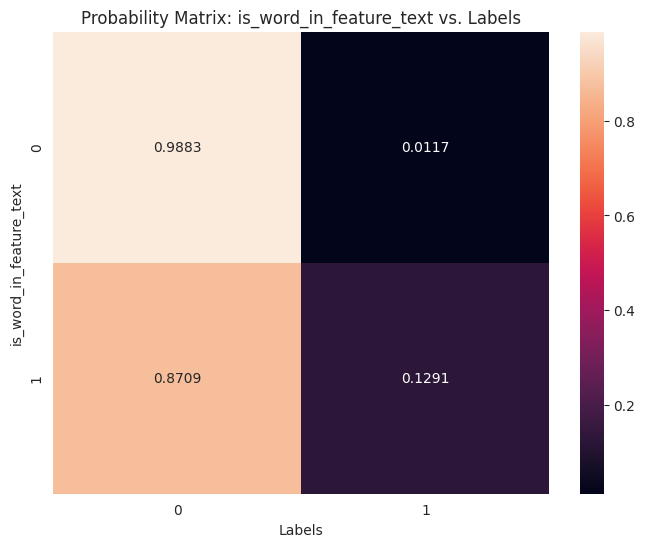

In [ ]:
plot_cross_table_to_labels(word_train_df,"is_word_in_feature_text","word_label")

If a word appears in the feature text, it's noticeably more likely to be annotated — about 13% compared to just 1% when it doesn't. So, the feature text clearly offers a strong signal.

Now, let’s see if that signal holds not only for the word itself but also for neighboring words. It’s reasonable to think that a word might be more likely to be annotated if a word near it appears in the feature text — especially if they’re part of the same phrase or idea.

We'll test this by checking whether annotation likelihood increases when a nearby word (within 1, 2, or 3 positions to the left or right) is part of the feature text.

Let’s create those “neighbor word” features and explore the results:

In [ ]:
word_train_df = word_train_df.sort_values(["id","words_start_index"])

def add_i_near_segment_feature(df: pd.DataFrame, column_feature_name: str, i: int, is_right: bool=True) -> pd.DataFrame:
  """
  Adds a feature to the DataFrame by shifting a specified column's values to the left or right by `i` positions.

  If the shift crosses to a different patient note (`id` mismatch), the value is set to -1.

  Parameters:
  - df (pd.DataFrame): The DataFrame.
  - column_feature_name (str): Column to shift.
  - i (int): Number of positions to shift.
  - is_right (bool): If True, shift right; otherwise, left. Default is True.

  Returns:
  - pd.DataFrame: Updated DataFrame with the new feature.
  """
  relative_place = "right" if is_right else "left"
  shift_val = -i if is_right else i
  df[f"{i}_{relative_place}_{column_feature_name}"] = df[column_feature_name].shift(shift_val,fill_value=-1)
  df.loc[(df.id.shift(shift_val) != df.id), f"{i}_{relative_place}_{column_feature_name}"] = -1
  return df

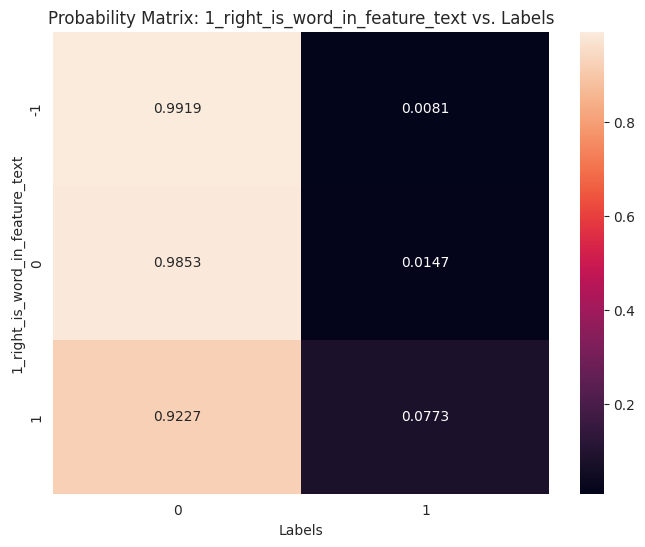

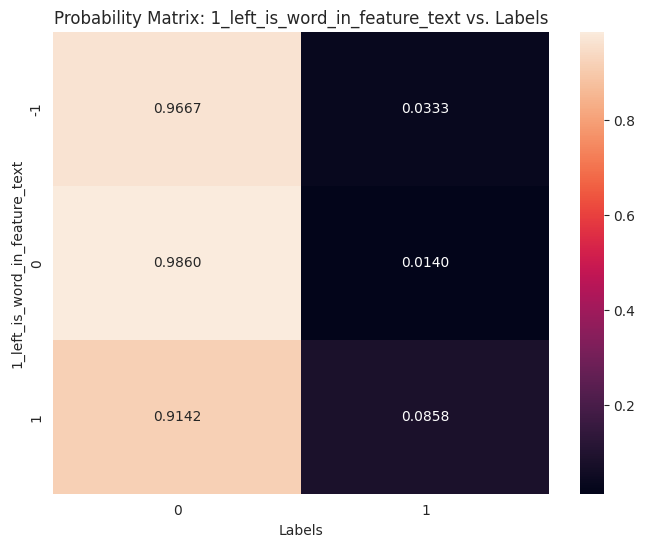

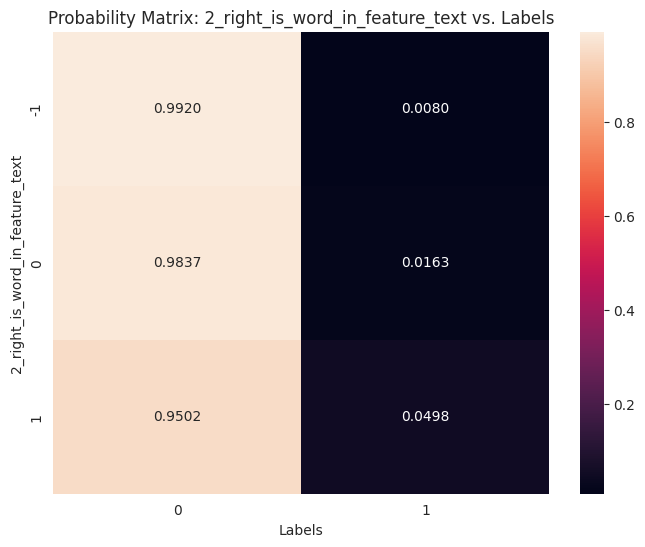

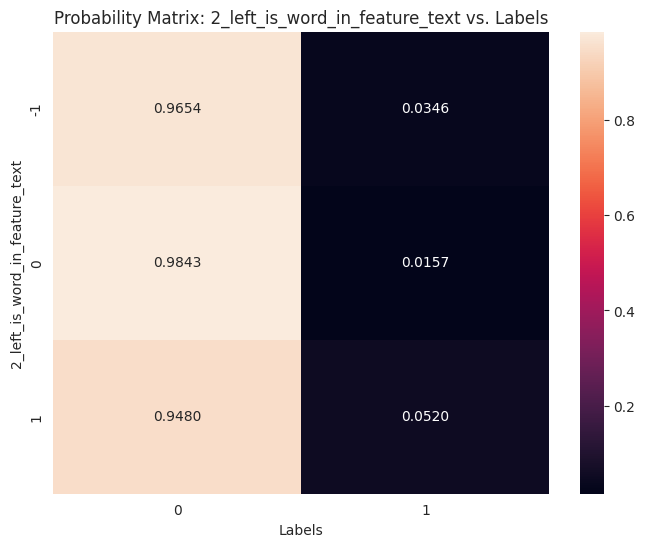

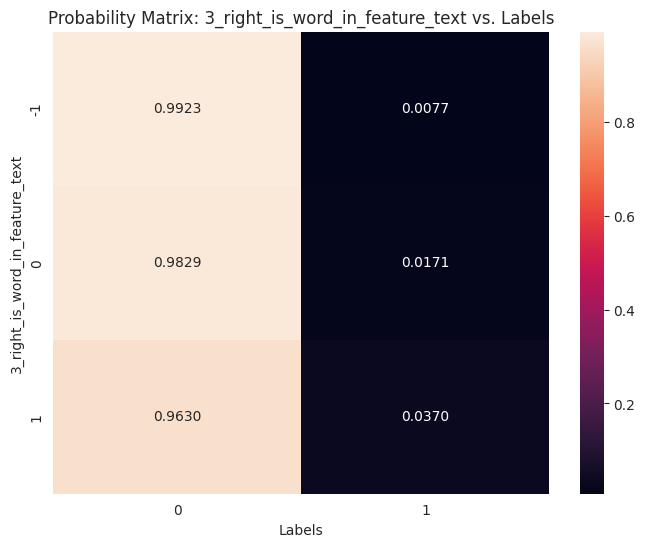

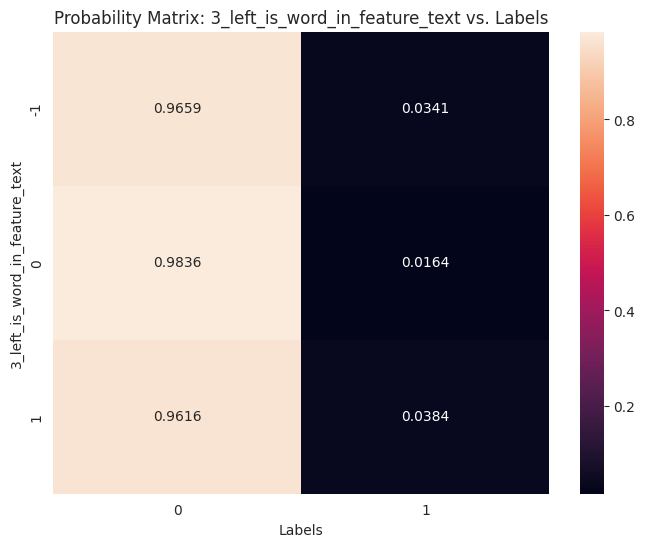

In [ ]:
for i in range(1,4):
  for is_right in [True,False]:
    word_train_df = add_i_near_segment_feature(word_train_df,"is_word_in_feature_text",i,is_right)
    relative_place = "right" if is_right else "left"
    plot_cross_table_to_labels(word_train_df, f"{i}_{relative_place}_is_word_in_feature_text", "word_label")

-1 means there's no neighboring word at that distance — this typically happens near the beginning or end of a patient note, or when we've hit the edge of a sentence.

From the results, we can see that the closer a word is to a word from the feature text, the more informative that nearness becomes in predicting annotations. While the predictive power does fade with distance, even a gap of 3 words still carries useful information.

<Axes: >

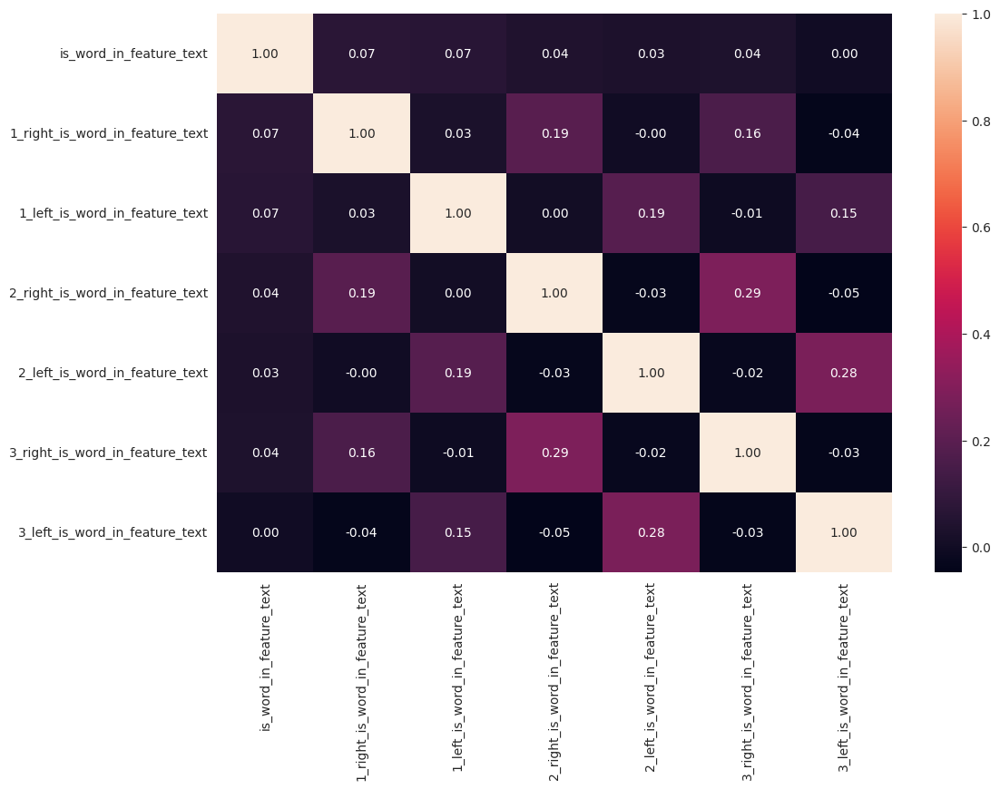

In [ ]:
plt.figure(figsize=(12, 8))
in_feature_text_column_names = [column for column in word_train_df.columns if "in_feature_text" in column]
sns.heatmap(word_train_df.loc[word_df_train_mask,in_feature_text_column_names].corr(), annot=True, fmt=".2f")

We can see that the features show low correlation with one another, which suggests that they provide complementary information rather than overlapping — a good sign for combining them in a model.

###Exploring Synonym Matching
In our EDA, we observed that most of the annotation vocabulary are not directly part of the feature text vocabulary.
Let's investigate whether the annotated words include synonyms of the feature text.

In [ ]:
import nltk
from nltk.corpus import wordnet

nltk.download('wordnet')

def get_synonyms(text: str) -> str:
  """
  Generates a space-separated string of synonyms for each word in the input text.

  Args:
      text (str): The input text.

  Returns:
      str: A string containing synonyms of the words in the input text.
  """

  synonyms = []
  for word in text.lower().split():
    if word != "or":
      for syns in wordnet.synonyms(word):
        for syn in syns:
          if word not in syn:
            synonyms.append(syn)
  return " ".join(synonyms).replace("_"," ")

[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
features_df['feature_synonyms'] = features_df['feature_text'].apply(get_synonyms)

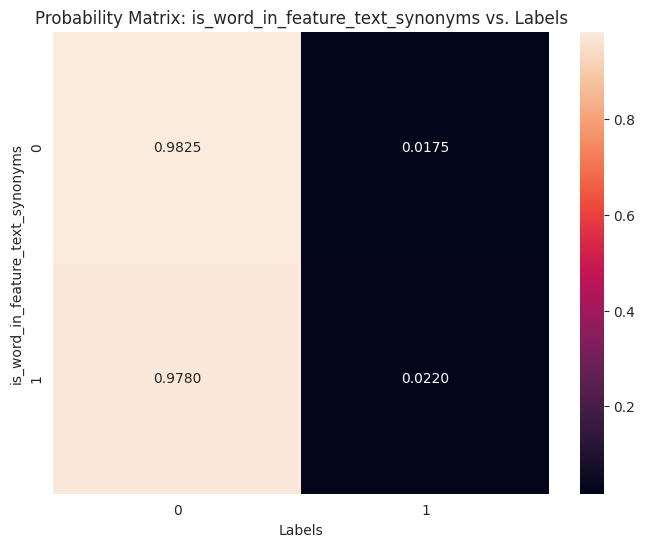

In [ ]:
word_train_df = word_train_df.merge(features_df.loc[:,["feature_num","feature_synonyms"]],on="feature_num")
word_train_df["is_word_in_feature_text_synonyms"] = word_train_df.apply(lambda x: x.pn_history_word in x.feature_synonyms,axis=1).astype(int)
plot_cross_table_to_labels(word_train_df, "is_word_in_feature_text_synonyms", "word_label")

It seems that words synonymous with terms in the feature text do not provide a significant signal, likely due to the presence of many unrelated synonyms.

### Exploring the Use Of Known Annotations
So far, the features we've extracted mainly help with cases where the annotation closely matches how it's written in the feature text. However, these features fall short when the annotation expresses the concept in a different way.  

A potential solution is to expand beyond just the feature text for word matching and also include annotations that appear in the training data. By doing so, the model will be better equipped to identify a wider range of possible ways a specific feature could be expressed.

In [ ]:
def remove_first_occurrences(source: list, to_remove: list) -> list:
    source_copy = source.copy()
    for word in to_remove:
        try:
            source_copy.remove(word)
        except ValueError:
            continue
    return source_copy

In [ ]:
def create_set_of_known_annotated_words(row: pd.Series) -> set:
  """
  Creates a set of feature-specific annotated words for checking,
  excluding those that also appear in the same patient note (`id`).

  Args:
      row (pd.Series): A row from the DataFrame containing annotation lists.

  Returns:
      set: A set of words to be used for matching, with same-id words removed.
  """
  if not(isinstance(row["annotated_list_per_feature"],list)):
    return set()
  elif not(isinstance(row["annotated_list_per_id"],list)):
      return set(row["annotated_list_per_feature"])
  else:
    return set(remove_first_occurrences(row["annotated_list_per_feature"],row["annotated_list_per_id"]))

In [ ]:
annotated_words_mask = (word_train_df.word_label == 1) & word_df_train_mask
annot_words_per_feature = word_train_df.loc[annotated_words_mask].groupby(["case_num","feature_num"])["pn_history_word"].apply(list).reset_index(name="annotated_list_per_feature")
annot_words_per_id = word_train_df.loc[annotated_words_mask].groupby("id")["pn_history_word"].apply(list).reset_index(name="annotated_list_per_id")
word_train_df = word_train_df.merge(annot_words_per_feature,how="left",on=["case_num","feature_num"])
word_train_df = word_train_df.merge(annot_words_per_id,how="left",on="id")
word_train_df["annotated_set_to_check"] = word_train_df.apply(create_set_of_known_annotated_words,axis=1)

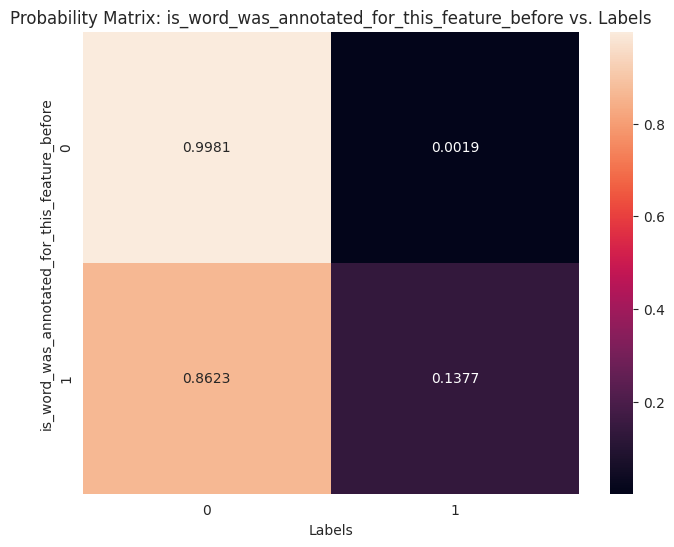

In [ ]:
word_train_df["is_word_was_annotated_for_this_feature_before"] = word_train_df.apply(lambda row: row.pn_history_word in row.annotated_set_to_check,axis=1).astype(int)
word_train_df.drop(columns=["annotated_list_per_feature","annotated_list_per_id", "annotated_set_to_check"],inplace=True)
plot_cross_table_to_labels(word_train_df,"is_word_was_annotated_for_this_feature_before","word_label")

This looks like a useful feature:
- among words that were never annotated for this feature before, 99.81% remain unannotated — splitting on it reveals a notable shift: for words that were previously annotated, the likelihood of being annotated again rises to 13.77%.
- However, it's important to remember that new data may introduce entirely different words or representations of features, so this pattern may not always hold.

Interestingly, we observe that ~86% of the time when a word appears that was previously annotated, it remains unannotated. This could be due to the presence of stopwords and other common words. Let's add the word frequency as a feature and and also if a word is a stop word:

Word Frequency:

In [ ]:
all_pn_history = ' '.join(word_train_df.loc[word_df_train_mask].drop_duplicates("pn_num")['pn_history'])
all_pn_history_words = all_pn_history.split()
word_freq_df = pd.Series(all_pn_history_words).value_counts()/len(all_pn_history_words)
word_train_df = word_train_df.merge(word_freq_df,left_on="pn_history_word",right_index=True,how="left").rename(columns={"count": "freq"})
word_train_df["freq"] = word_train_df["freq"].fillna(word_freq_df.mean())

We calculate word frequencies based on the training data. Since there is a possibility that a word may not appear in the training set but could appear in the validation set, we fill in the missing frequencies using the mean frequency from the training data.

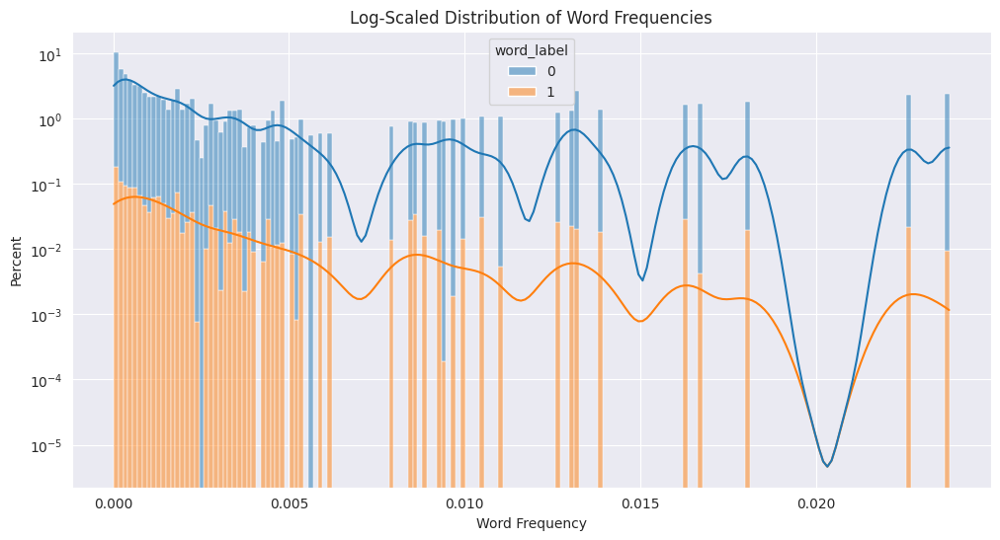

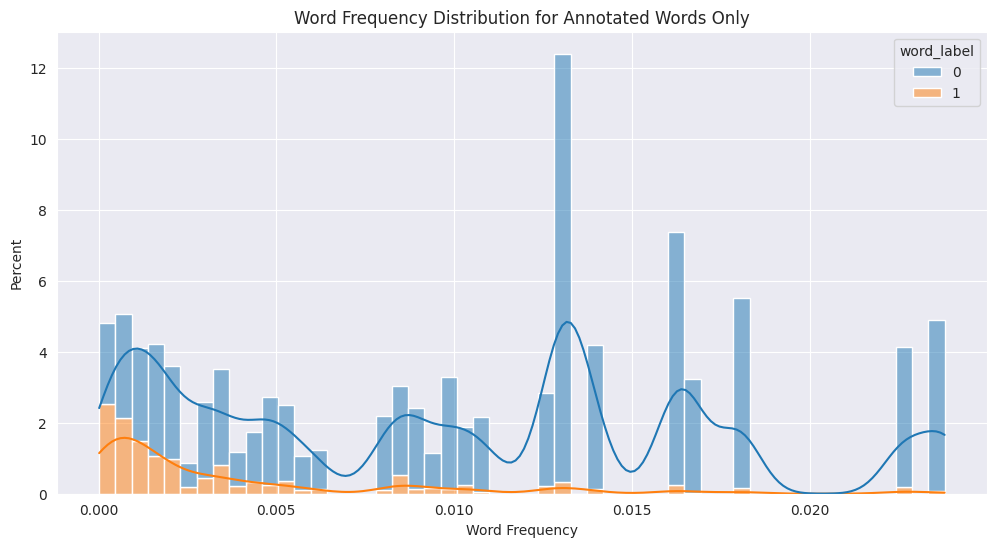

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(data=word_train_df.loc[word_df_train_mask],
             x='freq',
             hue="word_label",
             multiple="stack",stat='percent',kde=True)
plt.title('Log-Scaled Distribution of Word Frequencies')
plt.xlabel('Word Frequency')
plt.ylabel('Percent')
plt.yscale('log')
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(data=word_train_df.loc[word_df_train_mask].query("is_word_was_annotated_for_this_feature_before==1"),
             x='freq',
             hue="word_label",
             multiple="stack",stat='percent',kde=True)
plt.title('Word Frequency Distribution for Annotated Words Only')
plt.xlabel('Word Frequency')
plt.ylabel('Percent')
plt.show()

By observing the two plots, we can see that word frequency alone does not effectively distinguish between annotated and unannotated words. The proportion of unannotated words to annotated words remains relatively consistent across different frequencies.

From the second plot, it appears that if a word that has been annotated previously has a low frequency, it is much more likely to be annotated again.

However, we must keep in mind that there is a bias towards low-frequency words. This trend will likely be weaker, and potentially less significant, in the validation set. This is because, the lower the frequency of a word, the more influence a single known annotation in the training data has on the calculation.

Stopwords:

In [ ]:
from nltk.corpus import stopwords

nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

word_train_df["is_stopword"] = word_train_df["pn_history_word"].apply(lambda word: 1 if word in stop_words else 0)

word_train_df["is_stopword"].value_counts()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


,count
is_stopword,
0,1363837
1,609495


Unsurprisingly, patient notes contain a significant number of stopwords.

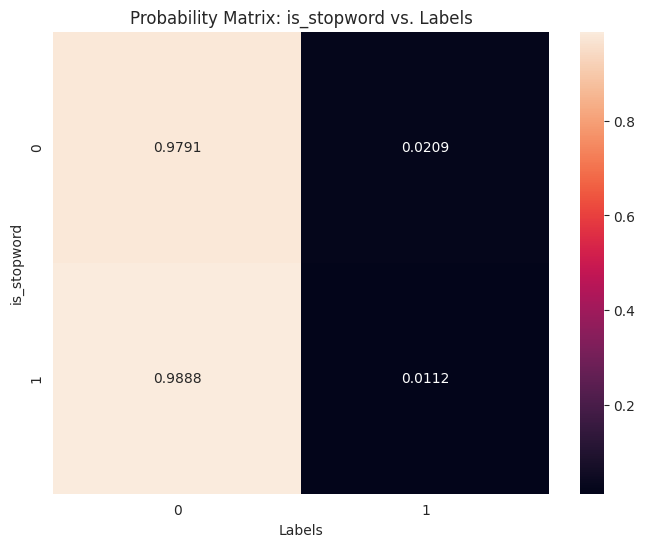

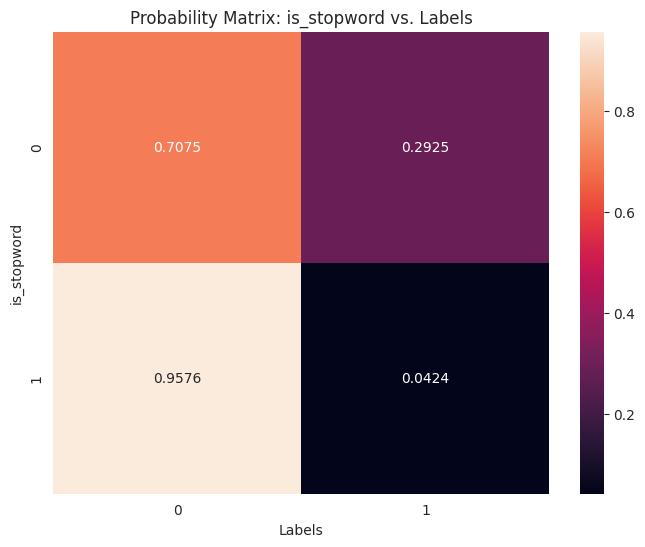

In [ ]:
plot_cross_table_to_labels(word_train_df, "is_stopword", "word_label")
print()
display(HTML("<b>Now, let's compare with the subset of annotated words:</b>"))
print()
plot_cross_table_to_labels(word_train_df.query("is_word_was_annotated_for_this_feature_before == 1"), "is_stopword", "word_label")

From the first heatmap, we can observe that, in general, words that are not stopwords are twice as likely to be annotated.

The second heatmap shows a much more significant separation: if a word has been annotated previously and is not a stopword, it is six times more likely to be annotated again! This insight could greatly enhance the model’s performance.

Previously, we attempted to use synonyms as a potential feature, but the results were not successful. Now, let’s investigate whether synonyms that **are not stopwords** provide additional meaningful information for annotation:

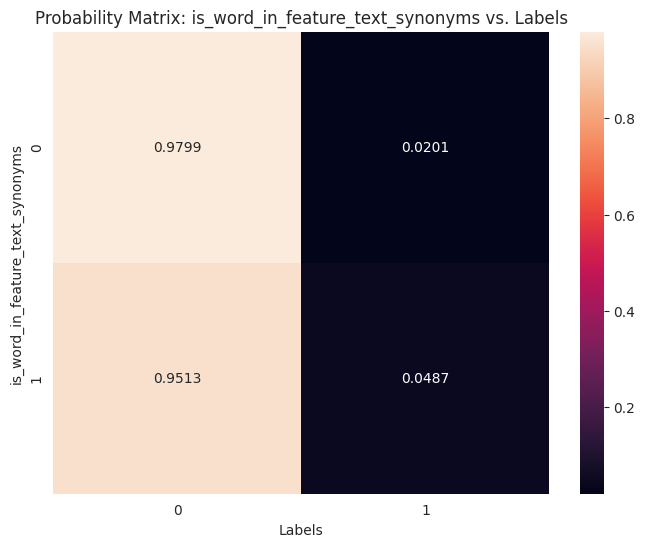

In [ ]:
plot_cross_table_to_labels(word_train_df.query("is_stopword == 0"), "is_word_in_feature_text_synonyms", "word_label")

Now, we can observe information gain: when a non-stopword is a synonym of a word in the feature, it is more than twice as likely to be annotated.

Similar to how we created features based on word matching with the feature text, let’s now introduce features that capture how close a word to an annotated word.

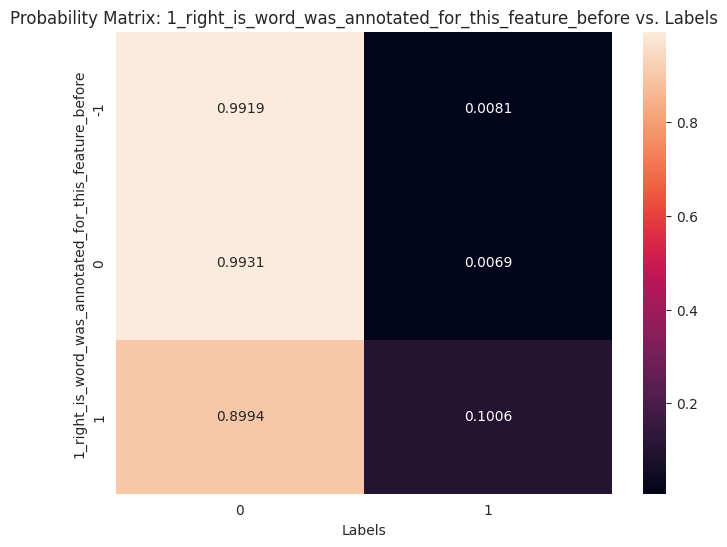

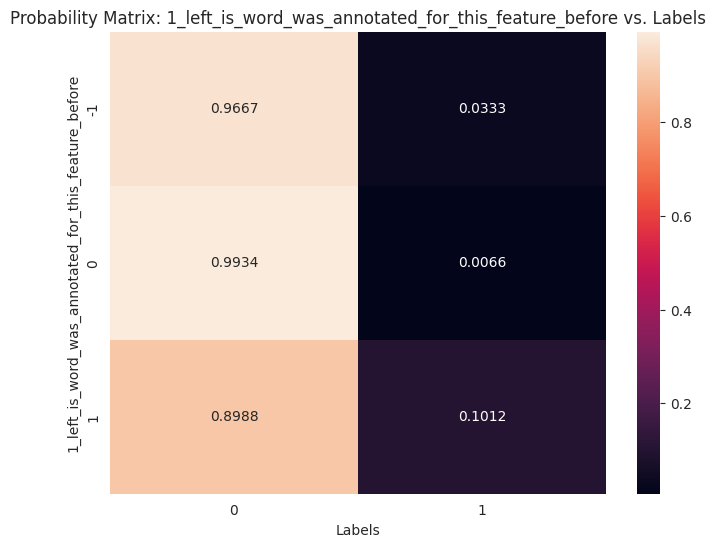

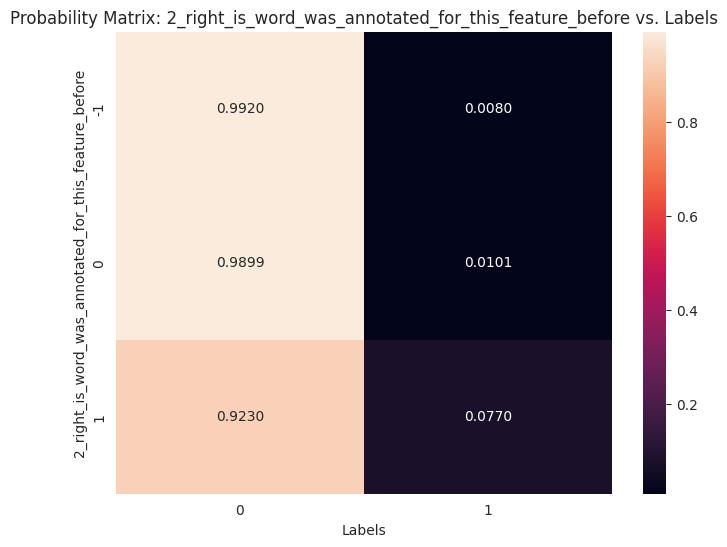

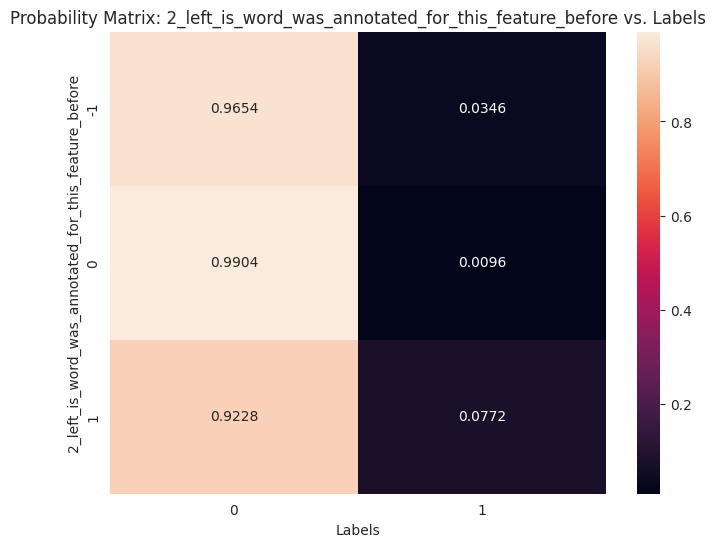

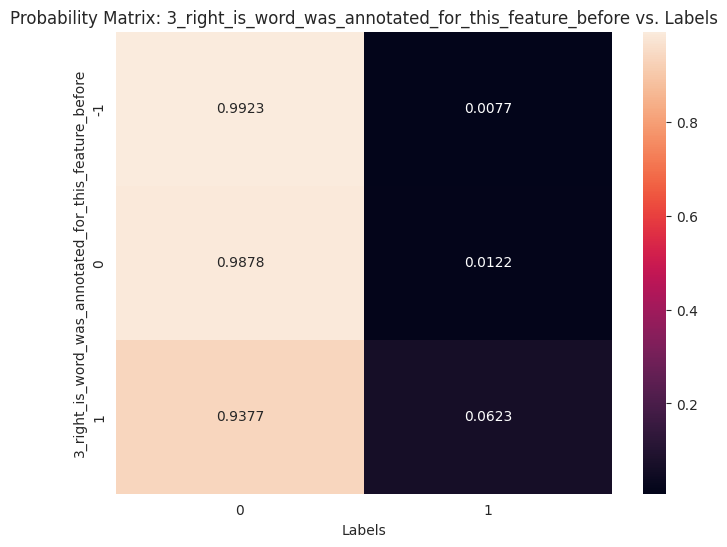

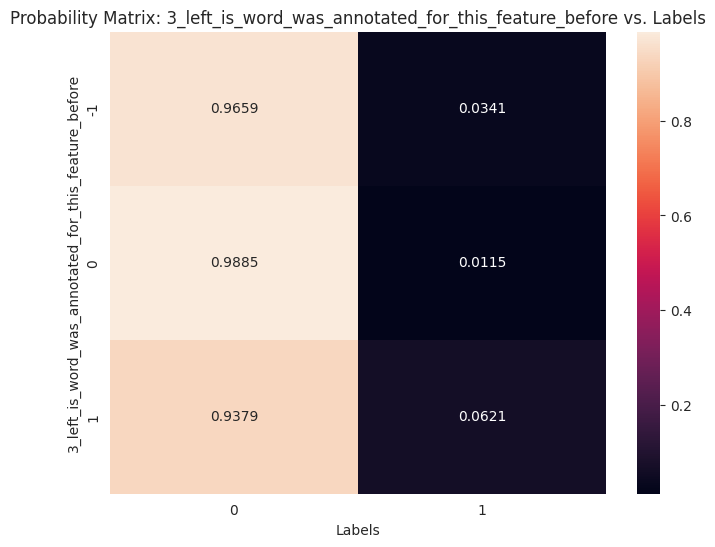

In [ ]:
for i in range(1,4):
  for is_right in [True,False]:
    word_train_df = add_i_near_segment_feature(word_train_df,"is_word_was_annotated_for_this_feature_before",i,is_right)
    relative_place = "right" if is_right else "left"
    plot_cross_table_to_labels(word_train_df, f"{i}_{relative_place}_is_word_was_annotated_for_this_feature_before", "word_label")

Similar to previous features, the further away a word is, the less informative the feature becomes. However, even when a word is three words away, it still carries a significant signal.

### Final Overview of Word Segment Feature Extraction
Now that we’ve extracted multiple features, let’s examine the correlation map to better understand their relationships.

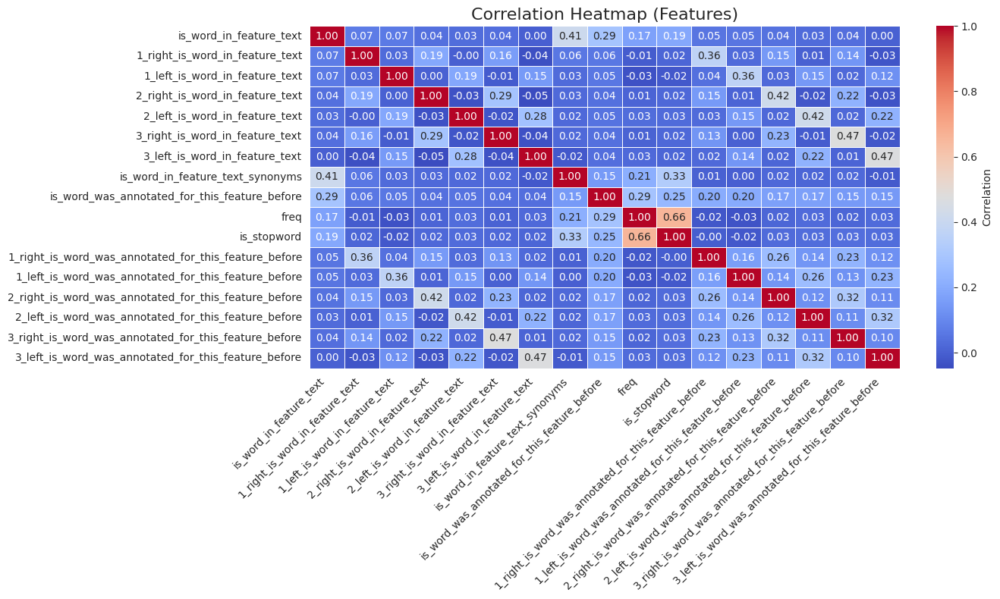

In [ ]:
words_features_names = [feature for feature in list(word_train_df.columns[15:]) if feature not in ["feature_synonyms", "annotated_set"]]

plt.figure(figsize=(14, 8))
sns.heatmap(word_train_df.loc[:, words_features_names].corr(), annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Correlation'}, linewidths=0.5)

plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

plt.title('Correlation Heatmap (Features)', fontsize=16)
plt.tight_layout()
plt.show()


As we can observe, there are a few feature pairs that show noticeable correlations:

- A high word frequency increases the likelihood of the word being a stopword.
- Some correlations exist between words in the feature text and words that have been annotated previously.

Overall, it appears that our features exhibit some degree of redundancy, which we should consider addressing.

We have extracted 17 features, primarily based on word matching. These features will enable us to build a simple, lightweight, and explainable model.

However, building a model based solely on these features will have its limitations:

- Potential challenges in generalizing to new cases and features (due to the need for extensive labeled data).
- Inability to handle variations in expression that were not present in the training data.
- Lack of logical and semantic understanding.

To overcome these limitations, we will need to incorporate more sophisticated tools that can help our model understand semantics and meaning in a deeper, more resilient way.

### Exploring ModernBERT Embeddings for Deeper Semantic Understanding

As previously mentioned, to overcome the limitations of the features we’ve extracted based on word matching, a more sophisticated approach is needed—one that can capture the rich, contextual relationships between words. This is where **ModernBERT embeddings** come into play.

ModernBERT, a transformer-based language model, has been pretrained on a vast and diverse corpus of text. Unlike traditional word matching methods, ModernBERT captures nuanced semantic relationships and generates embeddings (vectors) that represent each token in its specific context.

- **Tokenization**: ModernBERT processes input text by first tokenizing it into smaller units (tokens), which are then transformed into numerical representations.
- **Embeddings**: For each token, ModernBERT generates embeddings that encode both the meaning and the context of the word. These embeddings are more sophisticated and robust compared to traditional feature extraction methods.

By leveraging ModernBERT embeddings, we can build features that better capture the semantics and context of words, which may help our model generalize more effectively to unseen data and better handle variations in language.

In the next steps, we’ll explore how to use these embeddings to build advanced features that will enhance our model’s performance and enable a deeper understanding of the text.

#### Instantiating ModernBERT:

In [ ]:
import torch
from transformers import AutoModel
from transformers import AutoTokenizer
from tqdm import tqdm

In [ ]:
MODEL_NAME = "answerdotai/ModernBERT-base"

In [ ]:
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.13M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/694 [00:00<?, ?B/s]

In [ ]:
embeddings_model = AutoModel.from_pretrained(MODEL_NAME)
embeddings_model

config.json:   0%|          | 0.00/1.19k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/599M [00:00<?, ?B/s]

ModernBertModel(
  (embeddings): ModernBertEmbeddings(
    (tok_embeddings): Embedding(50368, 768, padding_idx=50283)
    (norm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (drop): Dropout(p=0.0, inplace=False)
  )
  (layers): ModuleList(
    (0): ModernBertEncoderLayer(
      (attn_norm): Identity()
      (attn): ModernBertAttention(
        (Wqkv): Linear(in_features=768, out_features=2304, bias=False)
        (rotary_emb): ModernBertRotaryEmbedding()
        (Wo): Linear(in_features=768, out_features=768, bias=False)
        (out_drop): Identity()
      )
      (mlp_norm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (mlp): ModernBertMLP(
        (Wi): Linear(in_features=768, out_features=2304, bias=False)
        (act): GELUActivation()
        (drop): Dropout(p=0.0, inplace=False)
        (Wo): Linear(in_features=1152, out_features=768, bias=False)
      )
    )
    (1-21): 21 x ModernBertEncoderLayer(
      (attn_norm): LayerNorm((768,), eps=1e-05, e

#### Tokenizing Patient Notes and Feature Text

ModernBERT supports input as either a single text segment or a pair of segments.
In our case, we pass the **patient note** and the **feature text** together as a paired input, allowing the model to express the relationship between them.

In [ ]:
def tokenize_pandas_series(series: pd.Series):
  """
  Tokenizes a pandas Series of text into tokenized inputs using ModernBERT tokenizer.

  Args:
      series (pd.Series): A pandas Series containing the text data to be tokenized.

  Returns:
      dict like object containing tokenized tensors and offset mappings.
  """
  return tokenizer(
      series.tolist(),
      padding=True,
      return_tensors="pt",
      return_offsets_mapping=True
  )

def tokenize_pandas_series_pair(series1: pd.Series, series2: pd.Series):
    """
    Tokenizes two pandas Series of text into tokenized inputs using ModernBERT tokenizer.

    Args:
        series1 (pd.Series): The first pandas Series containing the first set of text data.
        series2 (pd.Series): The second pandas Series containing the second set of text data.

    Returns:
        ict like object containing tokenized tensors and offset mappings for both input text segments.
    """
    tokenized = tokenizer(
        series1.tolist(),
        series2.tolist(),
        padding=True,
        return_tensors="pt",
        return_offsets_mapping=True
    )
    return tokenized

In [ ]:
encoded_patient_feature_pairs = tokenize_pandas_series_pair(train_df.pn_history, train_df.feature_text)

In [ ]:
def check_special_tokens(encoded_inputs):
  """
  Checks and prints the percentage of special tokens (e.g., 'unknown' and 'pad')
  in the given encoded inputs.

  Args:
      encoded_inputs: A dict like object containing the tokenized inputs,
                      with 'input_ids' as a key and the corresponding tensor as its value.

  Returns:
      None: This function prints the percentage of special tokens but does not return any value.
  """
  vocab = tokenizer.get_vocab()
  special_tokens = {token_type: vocab.get(token, None)
                      for token_type, token in tokenizer.special_tokens_map.items()}
  for special_token_type, special_token_id in special_tokens.items():
    count = torch.sum(encoded_inputs["input_ids"] == special_token_id).item()
    total_elements = encoded_inputs["input_ids"].numel()
    percentage = (count / total_elements) * 100

    print(f"Percentage of {special_token_type} in the tensor: {percentage:.2f}%")

check_special_tokens(encoded_patient_feature_pairs)

Percentage of unk_token in the tensor: 0.00%
Percentage of sep_token in the tensor: 0.49%
Percentage of pad_token in the tensor: 45.56%
Percentage of cls_token in the tensor: 0.24%
Percentage of mask_token in the tensor: 0.00%


#### Creating Embeddings with ModernBERT

Move data to gpu:

In [89]:
def move_data_to_device(encoded_inputs: dict[str, torch.Tensor],device: str="cpu"):
  return {key: value.to(device) if isinstance(value, torch.Tensor) else value for key, value in encoded_inputs.items()}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
embeddings_model = embeddings_model.to(device)
encoded_patient_feature_pairs_to_model = move_data_to_device(encoded_patient_feature_pairs,device)

Compute Embeddings:

In [ ]:
def process_batch(batch_input_ids: torch.Tensor, batch_attention_mask: torch.Tensor) -> torch.Tensor:
  """
  Processes a batch of input IDs and attention masks through the embeddings model.

  Args:
      batch_input_ids (torch.Tensor): Tokenized input IDs for the batch.
      batch_attention_mask (torch.Tensor): Attention mask for the batch.

  Returns:
      torch.Tensor: The last hidden state of the embeddings for the batch, moved to CPU.
  """
  embeddings_model.eval()
  with torch.no_grad():
    outputs = embeddings_model(batch_input_ids, attention_mask=batch_attention_mask)
  return outputs.last_hidden_state.to("cpu")

def get_embeddings(encoded_inputs, batch_size: int = 100) -> torch.Tensor:
  """
  Computes embeddings for tokenized input text using the embeddings model.

  Args:
      encoded_inputs: A dict like object containing tokenized inputs
          with 'input_ids' and 'attention_mask' as keys.
      batch_size (int, optional): The number of samples to process per batch. Defaults to 100.

  Returns:
      torch.Tensor: A tensor containing the concatenated last hidden states of all input sequences.
  """
  input_ids = encoded_inputs["input_ids"]
  attention_mask = encoded_inputs["attention_mask"]
  all_last_hidden_states = []

  for start_idx in tqdm(range(0, input_ids.size(0), batch_size), desc="Processing batches"):
    end_idx = min(start_idx + batch_size, input_ids.size(0))
    batch_input_ids = input_ids[start_idx:end_idx]
    batch_attention_mask = attention_mask[start_idx:end_idx]

    batch_embeddings = process_batch(batch_input_ids, batch_attention_mask)
    all_last_hidden_states.append(batch_embeddings)

  return torch.cat(all_last_hidden_states, dim=0)


In [ ]:
patient_feature_pairs_embeddings = get_embeddings(encoded_patient_feature_pairs_to_model,batch_size=1000)

Processing batches:   0%|          | 0/15 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/_inductor/compile_fx.py:194: UserWarning: TensorFloat32 tensor cores for float32 matrix multiplication available but not enabled. Consider setting `torch.set_float32_matmul_precision('high')` for better performance.
  warnings.warn(
W0508 11:44:16.257000 709 torch/_inductor/utils.py:1137] [1/0] Not enough SMs to use max_autotune_gemm mode
Processing batches: 100%|██████████| 15/15 [04:22<00:00, 17.48s/it]


Clean gpu:

In [ ]:
del embeddings_model
#clean gpu:
if torch.cuda.is_available():
    torch.cuda.reset_max_memory_allocated()
    torch.cuda.reset_max_memory_cached()
    print("GPU cache cleared.")
else:
    print("No GPU available.")

GPU cache cleared.


/usr/local/lib/python3.11/dist-packages/torch/cuda/memory.py:391: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/cuda/memory.py:417: FutureWarning: torch.cuda.reset_max_memory_cached now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(


Back Up For the Embeddings

In [ ]:
# """back up for the embeddings"""
# import os

# def save_embeddings(embeddings: torch.Tensor, filename: str):
#   """Saves embeddings to a file.

#   Args:
#     embeddings: The embeddings to save.
#     filename: The name of the file to save to.
#   """
#   torch.save(embeddings, filename)


# backups_dir = "embeddings_backups"
# os.makedirs(backups_dir, exist_ok=True)

# save_embeddings(patient_feature_pairs_embeddings, os.path.join(backups_dir, f"{BASE_DIRECTORY}patient_feature_pairs_embeddings_modern.pt"))

# print("Embeddings saved successfully to the 'embeddings_backups' directory.")

Load Embeddings From Disk:

In [ ]:
# patient_feature_pairs_embeddings = torch.load(f"{BASE_DIRECTORY}patient_feature_pairs_embeddings_modern.pt").to(torch.float16) # float16 for saving memory

#### Constructing the Token and Embedding Dataset

Creating labeled token df:

In [ ]:
def add_tensors_to_df(df: pd.DataFrame,
                      column_name_to_tensor: dict[str,torch.Tensor]) -> pd.DataFrame:
  """
  Adds tensor values as new columns to a pandas DataFrame.

  Each tensor in `column_name_to_tensor` should have a length matching the number of rows in `df`.
  The function converts each tensor to a list and assigns it to the corresponding column in `df`.

  Args:
      df (pd.DataFrame): The DataFrame to which tensors should be added.
      column_name_to_tensor (Dict[str, torch.Tensor]): A dictionary where keys are column names
          and values are tensors of the same length as `df`.

  Returns:
      pd.DataFrame: The updated DataFrame with new columns containing tensor values.
  """
  for column_name, tensor in column_name_to_tensor.items():
    df[column_name] = list(tensor.numpy())
  return df

def split_slice_column(df: pd.DataFrame,
                       column_name: str,
                       remove_zero_end_tokens: bool = True) -> pd.DataFrame:
  """
  Splits a column containing start and end indices into two separate columns.

  The function assumes that the specified column contains tuples or lists of size 2,
  representing (start, end) indices. It creates two new columns: `<column_name>_start`
  and `<column_name>_end`, then drops the original column.

  Optionally, it removes rows where the end index is zero.

  Args:
      df (pd.DataFrame): The DataFrame containing the column to split.
      column_name (str): The name of the column containing (start, end) index pairs.
      remove_zero_end_tokens (bool, optional): If True, removes rows where the end index is zero.
          Defaults to True.

  Returns:
      pd.DataFrame: The updated DataFrame with separate start and end columns.
  """

  df[f"{column_name}_start"] = df[column_name].apply(lambda x: x[0])
  df[f"{column_name}_end"] = df[column_name].apply(lambda x: x[1])
  df.drop(column_name, axis=1, inplace=True)
  if remove_zero_end_tokens:
    df = df[df[f"{column_name}_end"] != 0]
  return df

def slice_labels_for_df(df: pd.DataFrame,
                        label_column_name: str,
                        start_slice_column_name: str,
                        end_slice_column_name: str) -> pd.Series:
  """
  Extracts a slice from a label column based on start and end indices.

  Args:
      df (pd.DataFrame): The DataFrame containing the label column and slice indices.
      label_column_name (str): Name of the column containing sequences (e.g., lists, strings).
      start_slice_column_name (str): Column name containing the start index for slicing.
      end_slice_column_name (str): Column name containing the end index for slicing.

  Returns:
      pd.Series: A Series containing the sliced label values for each row.
  """
  return df.apply(lambda x: x[label_column_name][x[start_slice_column_name]:x[end_slice_column_name]], axis=1)

def filter_type(row: pd.Series, column: str, text_type: int) -> np.ndarray:
  """
  Filters array in the specified column for the given text_type.

  Args:
      row (pd.Series): A row from the DataFrame.
      column (str): The column containing array (ndarray).
      text_type (int): The token type to filter by (0 for patient notes, 1 for features).
  Returns:
      np.ndarray: Filtered tokens corresponding to the specified text_type.
  """
  return row[column][np.array(encoded_patient_feature_pairs.sequence_ids(row.name)) == text_type]

In [ ]:
column_name_to_tensor = {
                        "embeddings":patient_feature_pairs_embeddings,
                        "embeddings_slice":encoded_patient_feature_pairs["offset_mapping"]
}

token_pair_df = train_df.copy()
token_pair_df = add_tensors_to_df(token_pair_df, column_name_to_tensor)

token_pair_df["embeddings_slice"] = (
    token_pair_df.apply(lambda x: filter_type(x,"embeddings_slice",0),axis=1)
    .apply(list)
)
token_pair_df["feature_text_embeddings"] = (
    token_pair_df.apply(lambda x: filter_type(x,"embeddings",1).mean(axis=0),axis=1)
) # we use average to save memory
token_pair_df["embeddings"] = (
    token_pair_df.apply(lambda x: filter_type(x,"embeddings",0),axis=1)
    .apply(list)
)

del patient_feature_pairs_embeddings
del column_name_to_tensor
del encoded_patient_feature_pairs

token_pair_df = token_pair_df.explode(["embeddings","embeddings_slice"], ignore_index=True)
token_pair_df = split_slice_column(token_pair_df,"embeddings_slice")



token_pair_df["labels"] = slice_labels_for_df(token_pair_df, "labels", "embeddings_slice_start", "embeddings_slice_end")

token_pair_df["token_label"] = create_segment_level_label(token_pair_df["labels"])
token_pair_df["token_text"] = token_pair_df.apply(lambda x: x["pn_history"][x["embeddings_slice_start"]:x["embeddings_slice_end"]],axis=1)

In [ ]:
token_pair_train_mask = get_df_mask_by_dataset_type(token_pair_df,"train")
token_pair_df.head()

,id,case_num,pn_num,feature_num,annotation,location,feature_text,pn_history,annotation_amount,labels,embeddings,feature_text_embeddings,embeddings_slice_start,embeddings_slice_end,token_label,token_text
0,00016_000,0,16,0,[dad with recent heart attcak],[696 724],Family history of MI OR Family history of myoc...,HPI: 17yo M presents with palpitations. Patien...,1,[0.0],"[-1.2379907, -0.943692, 0.12684122, 0.44396305...","[0.20168562, -0.9590918, -0.37705204, 0.272309...",0,1,0,H
1,00016_000,0,16,0,[dad with recent heart attcak],[696 724],Family history of MI OR Family history of myoc...,HPI: 17yo M presents with palpitations. Patien...,1,"[0.0, 0.0]","[-0.6117623, -0.9867336, 0.12497296, 0.1828752...","[0.20168562, -0.9590918, -0.37705204, 0.272309...",1,3,0,PI
2,00016_000,0,16,0,[dad with recent heart attcak],[696 724],Family history of MI OR Family history of myoc...,HPI: 17yo M presents with palpitations. Patien...,1,[0.0],"[0.054909285, -0.6778732, -0.15464847, 1.20050...","[0.20168562, -0.9590918, -0.37705204, 0.272309...",3,4,0,:
3,00016_000,0,16,0,[dad with recent heart attcak],[696 724],Family history of MI OR Family history of myoc...,HPI: 17yo M presents with palpitations. Patien...,1,"[0.0, 0.0, 0.0]","[0.12627918, -0.41715077, -0.8309384, 0.856364...","[0.20168562, -0.9590918, -0.37705204, 0.272309...",4,7,0,17
4,00016_000,0,16,0,[dad with recent heart attcak],[696 724],Family history of MI OR Family history of myoc...,HPI: 17yo M presents with palpitations. Patien...,1,"[0.0, 0.0]","[-0.19973013, -1.1866815, -0.18574919, -0.1512...","[0.20168562, -0.9590918, -0.37705204, 0.272309...",7,9,0,yo


Let's assess the accuracy of the token-level labels:

In [ ]:
evaluate_segment_labeling(token_pair_df.loc[token_pair_train_mask].labels,token_pair_df.loc[token_pair_train_mask].token_label)

📊 Segment-Level Evaluation:
 - Accuracy : 0.9989189746035861
 - Recall   : 0.9999869066245933
 - Precision: 0.9386241435462562


The results show that the binary labels are accurate and closely aligned with the character-level annotations.

However, the precision score (0.9386) is slightly lower than accuracy and recall, indicating a potential issue. This drop in precision is mainly caused by cases where the tokenizer includes a preceding space as part of the token, while the annotated word does not. This mismatch leads to false positives in character-level predictions and should be addressed to improve precision.

In [ ]:
precision_mask = (token_pair_df.labels.apply(sum) - token_pair_df.labels.apply(len)*token_pair_df.token_label)<0
token_pair_df.loc[token_pair_train_mask&precision_mask,["token_text","labels"]].sample(10,random_state=32).map(repr)

,token_text,labels
1150459,' ep',"array([0., 1., 1.])"
1912606,' 1',"array([0., 1.])"
320076,' 20',"array([0., 1., 1.])"
777267,' sweating',"array([0., 1., 1., 1., 1., 1., 1., 1., 1.])"
2294920,' use',"array([0., 1., 1., 1.])"
1442983,' denies',"array([0., 1., 1., 1., 1., 1., 1.])"
2170372,' 35',"array([0., 1., 1.])"
2775775,' T',"array([0., 1.])"
2573299,' saw',"array([0., 1., 1., 1.])"
1482899,' sweating',"array([0., 1., 1., 1., 1., 1., 1., 1., 1.])"


#### Explore Cosine Similarity
- One widely used approach in NLP for measuring similarity is cosine similarity:

$$
\text{Cosine Similarity}(\mathbf{A}, \mathbf{B}) = \frac{\mathbf{A} \cdot \mathbf{B}}{\|\mathbf{A}\| \|\mathbf{B}\|} = \frac{\sum_{i=1}^n A_i B_i}{\sqrt{\sum_{i=1}^n A_i^2} \sqrt{\sum_{i=1}^n B_i^2}}
$$

- Let's explore whether cosine similarity can help identify tokens likely to be annotated. We ill start by checking the similarity between feature text embedding average to a token
- We start by comparing each token's embedding to the average embedding of the feature text to assess its potential for annotation.

In [ ]:
def compute_cosine_similarity_batchwise(embedding_series1: pd.Series,
                                        embedding_series2: pd.Series,
                                        batch_size: int):
  """
  Compute cosine similarity for two pandas series in smaller batches to avoid OOM.
  """
  similarities = []
  num_rows = len(embedding_series1)
  for start in tqdm(range(0, num_rows, batch_size), desc="Processing batches"):
      end = min(start + batch_size, num_rows)
      batch_similarity = compute_cosine_similarity_for_series(embedding_series1.iloc[start:end],
                                                              embedding_series2.iloc[start:end])
      similarities.extend(batch_similarity)
  return similarities

def compute_cosine_similarity_for_series(embedding_series1: pd.Series,
                                         embedding_series2: pd.Series):
  """
  Compute cosine similarity for two pandas series.
  """
  embeddings1 = series_of_array_to_array(embedding_series1)
  embeddings2 = series_of_array_to_array(embedding_series2)
  return compute_cosine_similarity_for_pairs(embeddings1,embeddings2)

def series_of_array_to_array(series: pd.Series) -> np.ndarray:
  """
  Converts a pandas Series of arrays into a single NumPy array.

  Args:
      series (pd.Series): A pandas Series where each element is an array.

  Returns:
      np.ndarray: A stacked NumPy array created from the Series of arrays.
  """
  return np.stack(series.to_numpy())

def compute_cosine_similarity_for_pairs(embedding1: np.ndarray, embedding2: np.ndarray) -> float:
  """
  Compute cosine similarity for two numpy arrays.
  """
  return np.sum(embedding1 * embedding2, axis=1)/(np.linalg.norm(embedding1, axis=1) * np.linalg.norm(embedding2, axis=1))

In [ ]:
token_pair_df["cosine_similarity"] = compute_cosine_similarity_batchwise(
                                    token_pair_df['embeddings'],
                                    token_pair_df['feature_text_embeddings'],
                                    1_000)

Processing batches: 100%|██████████| 3095/3095 [00:12<00:00, 241.49it/s]


plot cosine similarity:

In [ ]:
def plot_kde_for_column(column_to_plot: str, title: str, ax, token_df) -> None:
    """
    Plot KDE for a specific column grouped by labels.

    Args:
        column_to_plot (str): The name of the column to plot.
        title (str): Title for the subplot.
        ax: Matplotlib axis object to plot on.
        token_df: DataFrame containing the data.
    """
    train_mask = get_df_mask_by_dataset_type(token_df,"train")
    for label in token_df.loc[train_mask,'token_label'].unique():
        subset = token_df[train_mask & token_df['token_label'] == label]
        sns.kdeplot(subset[column_to_plot], label=str(label), fill=True, ax=ax)
    ax.set_xlabel("Cosine Similarity")
    ax.set_title(title)
    ax.grid(True, alpha=0.5)
    ax.legend(title="Labels")

def plot_kde_side_by_side(columns_to_plot: list[str], titles: list[str], token_df) -> None:
    """
    Plot KDE distributions for multiple columns side by side.

    Args:
        columns_to_plot (list[str]): List of column names to plot.
        titles (list[str]): List of titles for each subplot.
        token_df: DataFrame containing the data.
    """
    n_cols = len(columns_to_plot)
    fig, axes = plt.subplots(1, n_cols, figsize=(10 * n_cols, 6), sharey=True)

    for ax, column_to_plot, title in zip(axes, columns_to_plot, titles):
        plot_kde_for_column(column_to_plot, title, ax, token_df)
    plt.tight_layout()
    plt.show()

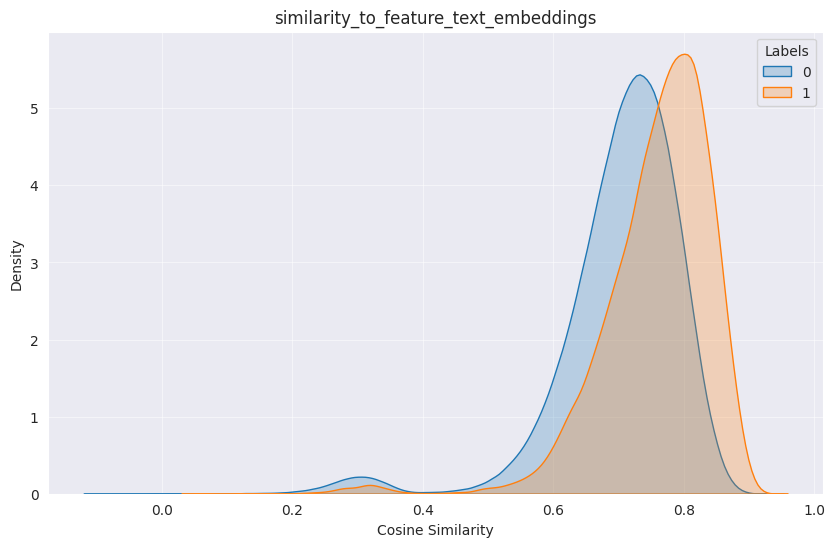

In [ ]:
plt.figure(figsize=(10, 6))
plot_kde_for_column("cosine_similarity","similarity_to_feature_text_embeddings", plt.gca(), token_pair_df)

Unfortunately, there is only a slight difference between an annotated token and a non-annotated one.

Each embedding consists of over 700 dimensions, making the dataset both large and computationally intensive. Additionally, only a subset of these dimensions is likely to be informative, while others may contribute little and remain relatively constant.

To address this, we will apply Principal Component Analysis (PCA) to reduce the dimensionality while preserving as much variance in the data as possible.

#### Reducing Dimensions With PCA

In [ ]:
from sklearn.decomposition import IncrementalPCA

def get_trained_pca(df: pd.DataFrame,
                    batch_size: int = 100_000) -> IncrementalPCA:
    """
    Perform PCA in batchs to avoid OOM on two DataFrame columns of NumPy arrays.

    Parameters:
    - df: Pandas DataFrame containing NumPy arrays in two columns.
    - col1: str, name of the first column (e.g., 'feature_embeddings').
    - col2: str, name of the second column (e.g., 'embeddings').
    - batch_size: int, number of rows to process per batch.
    - n_components: int, number of PCA components to retain.

    Returns:
    - ipca: Trained IncrementalPCA model.
    """

    ipca = IncrementalPCA()

    train_mask = get_df_mask_by_dataset_type(token_pair_df, "train")
    filtered_df = df[train_mask]
    num_rows = len(filtered_df)


    for i in tqdm(range(0, num_rows, batch_size)):
        batch = filtered_df.iloc[i:i+batch_size]

        batch_data = np.vstack(batch["embeddings"].to_numpy())
        batch_data2 = np.vstack(batch["feature_text_embeddings"].to_numpy())

        combined_batch = np.concatenate([batch_data, batch_data2], axis=0)

        ipca.partial_fit(combined_batch)

    return ipca

In [ ]:
from sklearn.decomposition import PCA


def plot_explained_variance(pca: PCA) -> None:
  """
  Plots the cumulative explained variance ratio from a trained PCA model.

  Args:
      pca (PCA): A trained PCA model from which the explained variance is extracted.

  Returns:
      None: Displays the plot showing cumulative explained variance.
  """
  explained_variance = pca.explained_variance_ratio_
  cumulative_variance = np.cumsum(explained_variance)

  plt.figure(figsize=(12, 6))
  plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', label='Cumulative Variance')
  plt.title('Explained Variance by PCA Components')
  plt.xlabel('Principal Component')
  plt.ylabel('Explained Variance Ratio')
  plt.xticks(range(1, len(explained_variance) + 1, max(len(explained_variance) // 10, 1)))  # Adjust x-axis ticks
  plt.legend()
  plt.show()


100%|██████████| 25/25 [05:57<00:00, 14.30s/it]


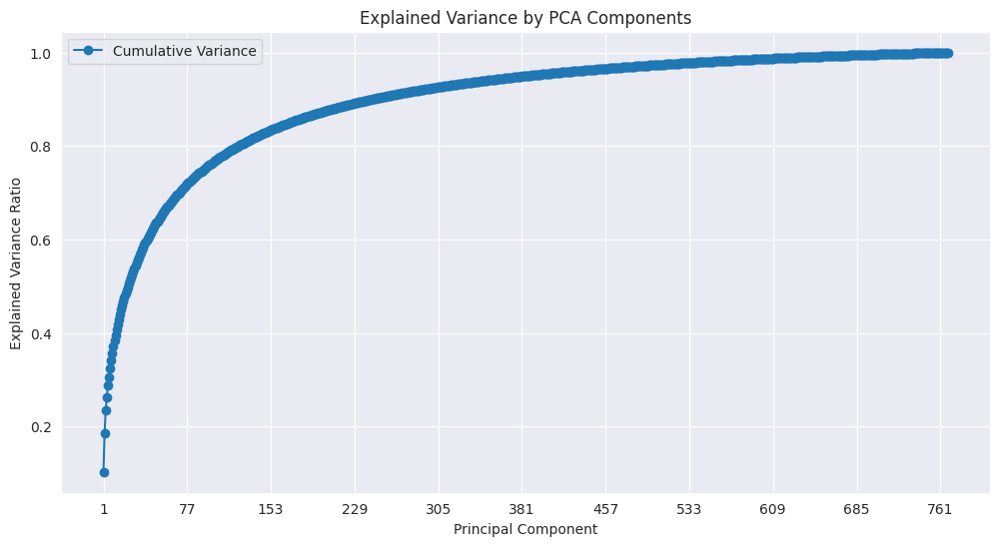

In [ ]:
pca = get_trained_pca(token_pair_df)
plot_explained_variance(pca)

Reducing the embeddings to 100 dimensions preserves around 80% of the explained variance, making it a reasonable choice for our analysis.

In [ ]:
def batch_pca_transform(df: pd.DataFrame, pca: PCA, batch_size=10_000, n_components=100) -> tuple[list[np.ndarray], list[np.ndarray]]:
  """
  Applies PCA transformation in batches to avoid OOM.

  Parameters:
  - df: Pandas DataFrame containing NumPy arrays in two columns ('embeddings' and 'feature_text_embeddings').
  - batch_size: int, number of rows to process per batch.
  - pca: Trained PCA model.
  - n_components: int, number of PCA components to retain.

  Returns:
  -  tuple: A tuple containing two lists of NumPy arrays,
      the transformed embeddings and feature embeddings.
  """

  embeddings_columns = ["embeddings", "feature_text_embeddings"]
  num_rows = len(df)
  reduced = {col: [] for col in embeddings_columns}

  for i in tqdm(range(0, num_rows, batch_size)):
    for embedding_column in embeddings_columns:
      embeddings_batch = df.loc[df.index[i:i + batch_size], embedding_column]
      transformed_embeddings = list(pca.transform(np.vstack(embeddings_batch.to_numpy())).astype(np.float16)[:, :n_components])
      reduced[embedding_column].extend(transformed_embeddings)
  return tuple(reduced.values())

Processing batches: 100%|██████████| 3095/3095 [00:18<00:00, 164.94it/s]


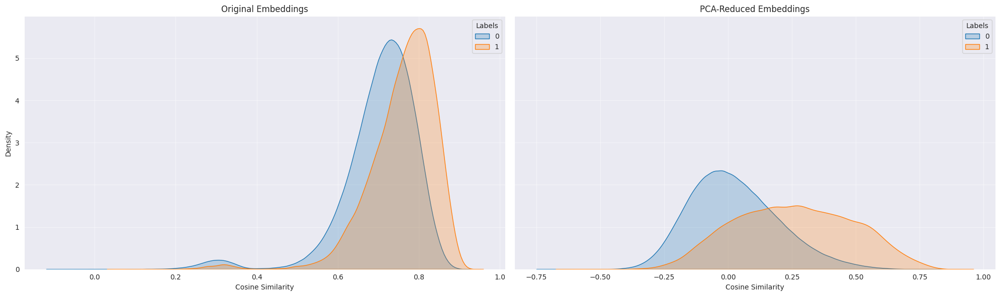

In [ ]:
token_pair_df["embeddings"], token_pair_df["feature_text_embeddings"] = batch_pca_transform(token_pair_df, pca)
token_pair_df["cosine_similarity_reduced"] = compute_cosine_similarity_batchwise(
                                    token_pair_df['embeddings'],
                                    token_pair_df['feature_text_embeddings'],
                                    1_000)
plot_kde_side_by_side(
    ["cosine_similarity", "cosine_similarity_reduced"],
    ["Original Embeddings", "PCA-Reduced Embeddings"],
    token_pair_df)

Not only did PCA reduced the embedding size (from ~700 to 100), but it also improved the separation between annotated and non-annotated tokens!

In [ ]:
token_pair_df = token_pair_df.drop(columns=["cosine_similarity"])

#### Visualizing PCA-Transformed Embeddings

By reducing the dimensionality of the embeddings with PCA, we can visualize them in a lower-dimensional space. This visualization may help reveal meaningful annotation patterns and relationships within the data.

<ipython-input-119-ceae64e14bfa>:39: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


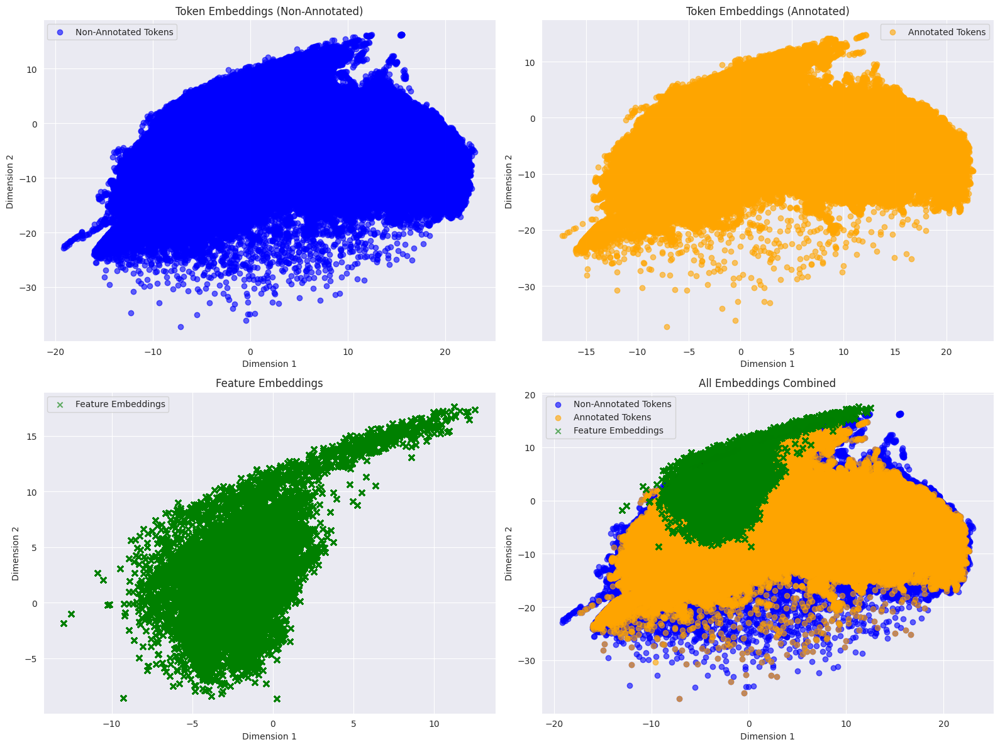

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

subset_0 = token_pair_df[token_pair_df["token_label"] == 0 & token_pair_train_mask]
coords_0 = np.stack(subset_0["embeddings"].to_numpy())
axes[0].scatter(coords_0[:, 0], coords_0[:, 1], c='blue', alpha=0.6, label="Non-Annotated Tokens")
axes[0].set_title("Token Embeddings (Non-Annotated)")
axes[0].set_xlabel("Dimension 1")
axes[0].set_ylabel("Dimension 2")
axes[0].legend()
axes[0].grid(True)

subset_1 = token_pair_df[token_pair_df["token_label"] == 1  & token_pair_train_mask]
coords_1 = np.stack(subset_1["embeddings"].to_numpy())
axes[1].scatter(coords_1[:, 0], coords_1[:, 1], c='orange', alpha=0.6, label="Annotated Tokens")
axes[1].set_title("Token Embeddings (Annotated)")
axes[1].set_xlabel("Dimension 1")
axes[1].set_ylabel("Dimension 2")
axes[1].legend()
axes[1].grid(True)

feature_coords = np.stack(token_pair_df.loc[token_pair_train_mask, "feature_text_embeddings"].to_numpy())
axes[2].scatter(feature_coords[:, 0], feature_coords[:, 1], c='green', alpha=0.6, marker='x', label="Feature Embeddings")
axes[2].set_title("Feature Embeddings")
axes[2].set_xlabel("Dimension 1")
axes[2].set_ylabel("Dimension 2")
axes[2].legend()
axes[2].grid(True)

axes[3].scatter(coords_0[:, 0], coords_0[:, 1], c='blue', alpha=0.6, label="Non-Annotated Tokens")
axes[3].scatter(coords_1[:, 0], coords_1[:, 1], c='orange', alpha=0.6, label="Annotated Tokens")
axes[3].scatter(feature_coords[:, 0], feature_coords[:, 1], c='green', alpha=0.6, marker='x', label="Feature Embeddings")
axes[3].set_title("All Embeddings Combined")
axes[3].set_xlabel("Dimension 1")
axes[3].set_ylabel("Dimension 2")
axes[3].legend()
axes[3].grid(True)

plt.tight_layout()
plt.show()


From the plot, we observe the following:

- The embedding space is highly continuous, and applying clustering would likely be artificial and uninformative for our goals.
- Tokens from all three categories overlap significantly, resulting a densely populated region with little clear separation.
- Feature embeddings (green Xs) are concentrated in a specific subregion of the space.
- Annotated token embeddings have a very similar spatial distribution to that of non annotated tokens.

While examining all embeddings provides a general overview, it’s also valuable to visualize the embeddings associated with individual, randomly selected features to gain deeper insight into annotation patterns:

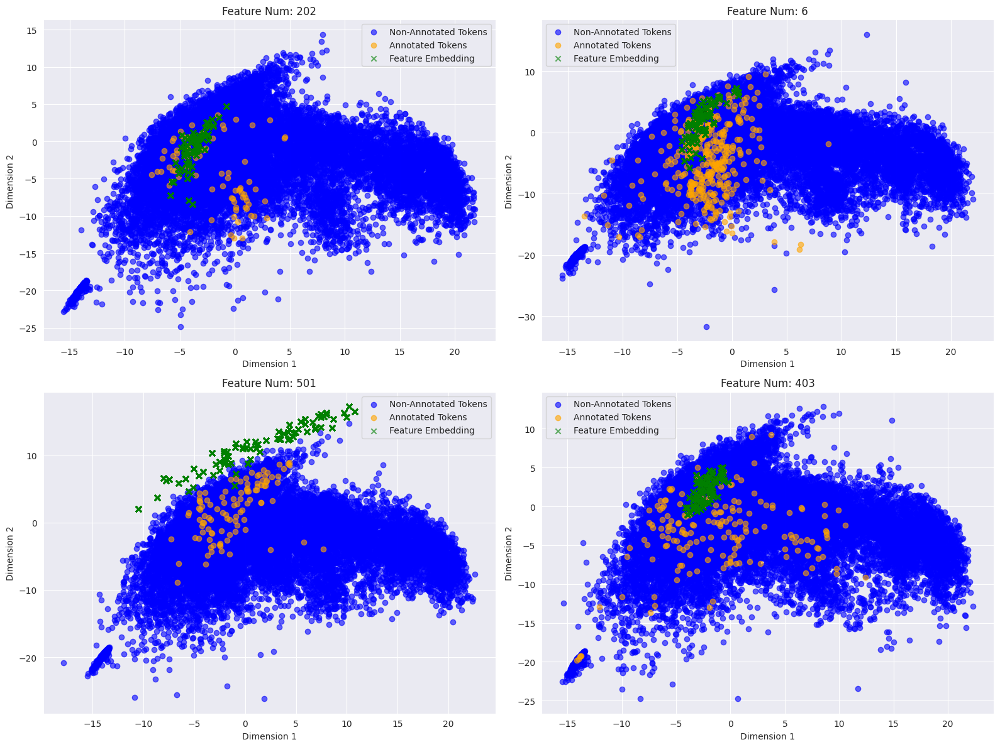

In [ ]:
import random

# Set random seed for reproducibility
random.seed(42)
unique_features = token_pair_df.loc[token_pair_train_mask,"feature_num"].unique()
selected_features = random.sample(list(unique_features), 4)

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, feature_num in enumerate(selected_features):
    subset = token_pair_df.loc[(token_pair_df["feature_num"] == feature_num) & (token_pair_train_mask)]
    tokens_0 = subset[subset["token_label"] == 0]
    tokens_1 = subset[subset["token_label"] == 1]

    coords_0 = np.stack(tokens_0["embeddings"].to_numpy())
    coords_1 = np.stack(tokens_1["embeddings"].to_numpy())
    feature_coords = np.stack(subset["feature_text_embeddings"].to_numpy())

    ax = axes[idx]
    ax.scatter(coords_0[:, 0], coords_0[:, 1], c='blue', alpha=0.6, label="Non-Annotated Tokens")
    ax.scatter(coords_1[:, 0], coords_1[:, 1], c='orange', alpha=0.6, label="Annotated Tokens")
    ax.scatter(feature_coords[:, 0], feature_coords[:, 1], c='green', alpha=0.6, marker='x', label="Feature Embedding")

    ax.set_title(f"Feature Num: {feature_num}")
    ax.set_xlabel("Dimension 1")
    ax.set_ylabel("Dimension 2")
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()


From visualizing the embeddings for specific features, we observe that annotated tokens tend to be close to each other, though some outliers exist where annotated tokens are relatively distant from others.

We can leverage these observation for classification and feature engineering by incorporating the distances to the top k nearest annotated tokens as an additional feature.

#### Mean Distance to Top *k* Annotated Tokens

We compute the mean distance to the top *k* nearest annotated tokens for each token, using several values of *k* ranging from 3 to 20. To ensure unbiased distance measurements, we exclude annotations that share the same `id` and `feature_num` as the query token.

As *k* increases, cases with fewer than *k* valid annotated neighbors become more common. In such situations, we use the mean based on tokens with enough neighbors.

Once computed, we’ll visualize the distributions of these features and assess which *k* values are most useful for modeling.

In [ ]:
import numpy as np
from tqdm import tqdm

In [ ]:
from sklearn.neighbors import NearestNeighbors

k_values = [3, 5, 10, 20]

token_pair_df[f"filtered_distances"] = None

train_mask_global = token_pair_train_mask & (token_pair_df["token_label"] == 1)

def filter_dists(row: pd.Series) -> pd.Series:
  exclude = id_to_indices_map.get(row["id"], [])
  valid_mask = ~np.isin(row["indices"], exclude, assume_unique=True)
  return np.array(row["distances"])[valid_mask]

for feature in tqdm(token_pair_df["feature_num"].unique(), desc="Processing features"):
  feature_mask = token_pair_df["feature_num"] == feature
  current_feature_data = token_pair_df.loc[feature_mask].copy()

  train_mask = train_mask_global & feature_mask
  current_feature_data["idx_for_k_calc"] = None
  current_feature_data.loc[train_mask, "idx_for_k_calc"] = current_feature_data.loc[train_mask].reset_index().index

  X_train = np.stack(current_feature_data.loc[train_mask, "embeddings"].to_numpy())
  X_all = np.stack(current_feature_data["embeddings"].to_numpy())

  nn = NearestNeighbors(metric='euclidean').fit(X_train)
  distances, indices = nn.kneighbors(X_all, n_neighbors=X_train.shape[0])

  current_feature_data["distances"] = list(distances)
  current_feature_data["indices"] = list(indices)

  id_to_indices_map = (
      current_feature_data[["id", "idx_for_k_calc"]]
      .dropna()
      .groupby("id")["idx_for_k_calc"]
      .agg(list)
  )

  token_pair_df.loc[feature_mask,"filtered_distances"] = current_feature_data.apply(filter_dists, axis=1)

def compute_mean(dists: np.ndarray, k: int) -> float:
  if len(dists) < k:
    return np.nan
  return dists[:k].mean()

for k in k_values:
  col = f"mean_dist_to_{k}_annotated_nn"
  token_pair_df[col] = token_pair_df["filtered_distances"].apply(lambda x: compute_mean(x, k))
  token_pair_df[col] = token_pair_df[col].fillna(token_pair_df[col].mean(skipna=True))
token_pair_df.drop(columns=["filtered_distances"], inplace=True)

Processing features: 100%|██████████| 143/143 [03:14<00:00,  1.36s/it]


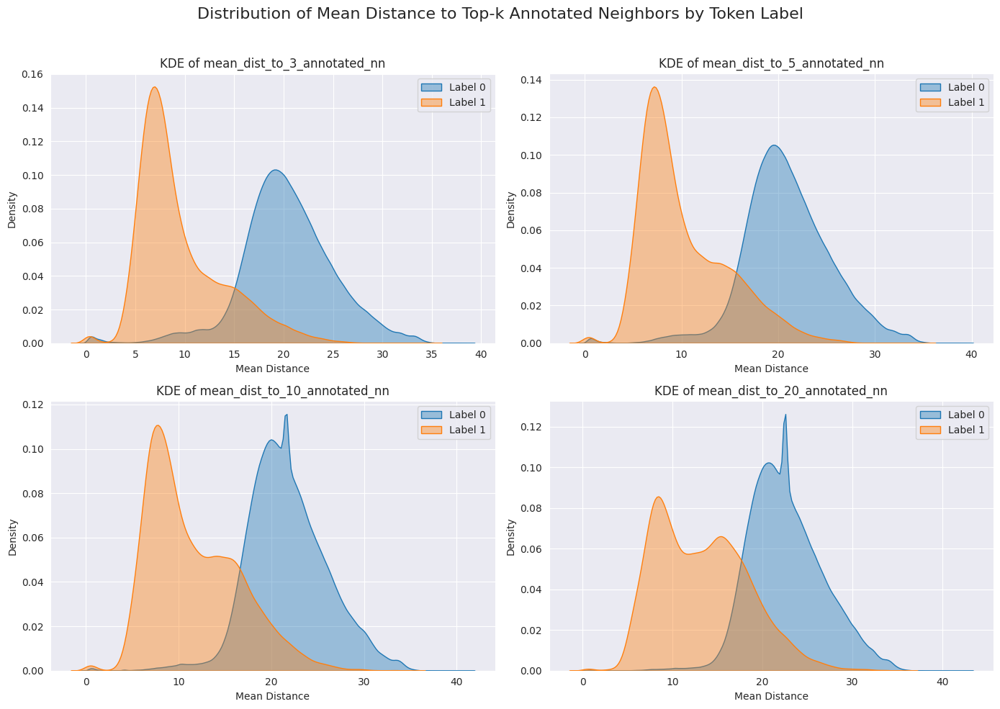

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, k in enumerate(k_values):
    ax = axes[i]
    col = f"mean_dist_to_{k}_annotated_nn"

    for label in [0, 1]:
        subset = token_pair_df[token_pair_train_mask & (token_pair_df['token_label'] == label)]
        sns.kdeplot(
            data=subset,
            x=col,
            label=f"Label {label}",
            fill=True,
            alpha=0.4,
            ax=ax
        )

    ax.set_title(f"KDE of {col}")
    ax.set_xlabel("Mean Distance")
    ax.set_ylabel("Density")
    ax.legend()

plt.suptitle("Distribution of Mean Distance to Top-k Annotated Neighbors by Token Label", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


We observe that the mean distance to the k nearest annotated tokens provides a clear separation between annotated and non-annotated tokens. Among the tested values, k = 3 yields the strongest separation, so we will proceed with this value:

In [ ]:
token_pair_df = token_pair_df.drop(columns=[f"mean_dist_to_{k}_annotated_nn" for k in k_values[1:]])

Next, we'll apply a similar approach to the one used in the word-matching method, and evaluate whether this distance-based signal also holds for neighboring tokens:

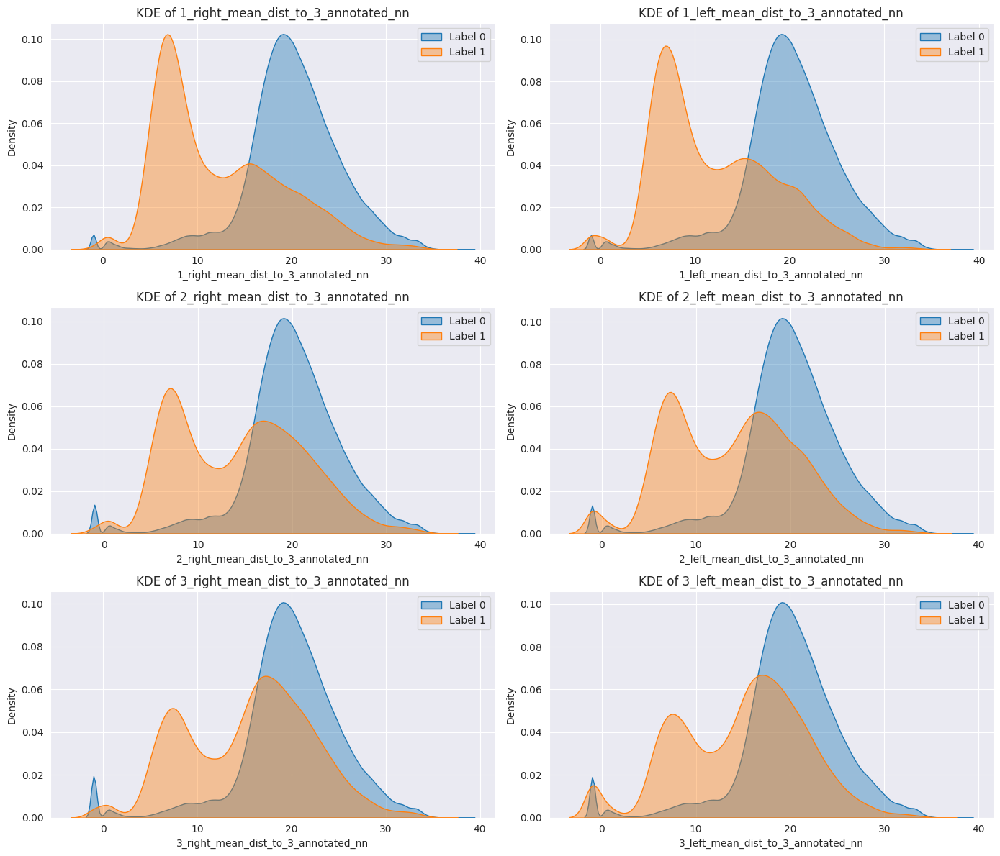

In [ ]:
token_pair_df = token_pair_df.sort_values(["id", "embeddings_slice_start"])

fig, axes = plt.subplots(3, 2, figsize=(14, 12), sharex=False, sharey=False)
axes = axes.flatten()

plot_idx = 0

for i in range(1, 4):
    for is_right in [True, False]:
        relative_place = "right" if is_right else "left"
        column_name = f"{i}_{relative_place}_mean_dist_to_3_annotated_nn"

        token_pair_df = add_i_near_segment_feature(token_pair_df, "mean_dist_to_3_annotated_nn", i, is_right)

        ax = axes[plot_idx]
        for label in [0, 1]:
            subset = token_pair_df[(token_pair_train_mask) & (token_pair_df['token_label'] == label)]
            sns.kdeplot(data=subset, x=column_name, label=f"Label {label}", ax=ax, fill=True, alpha=0.4)

        ax.set_title(f"KDE of {column_name}")
        ax.set_xlabel(column_name)
        ax.set_ylabel("Density")
        ax.legend()
        plot_idx += 1

plt.tight_layout()
plt.show()


Similar to the word-matching case, the distance-based feature still carries useful information—though its signal weakens as the tokens move farther from the one being evaluated.

### Final Overview of ModernBERT Feature Extraction
Now that we’ve extracted multiple features, let’s examine the correlation map to better understand their relationships.

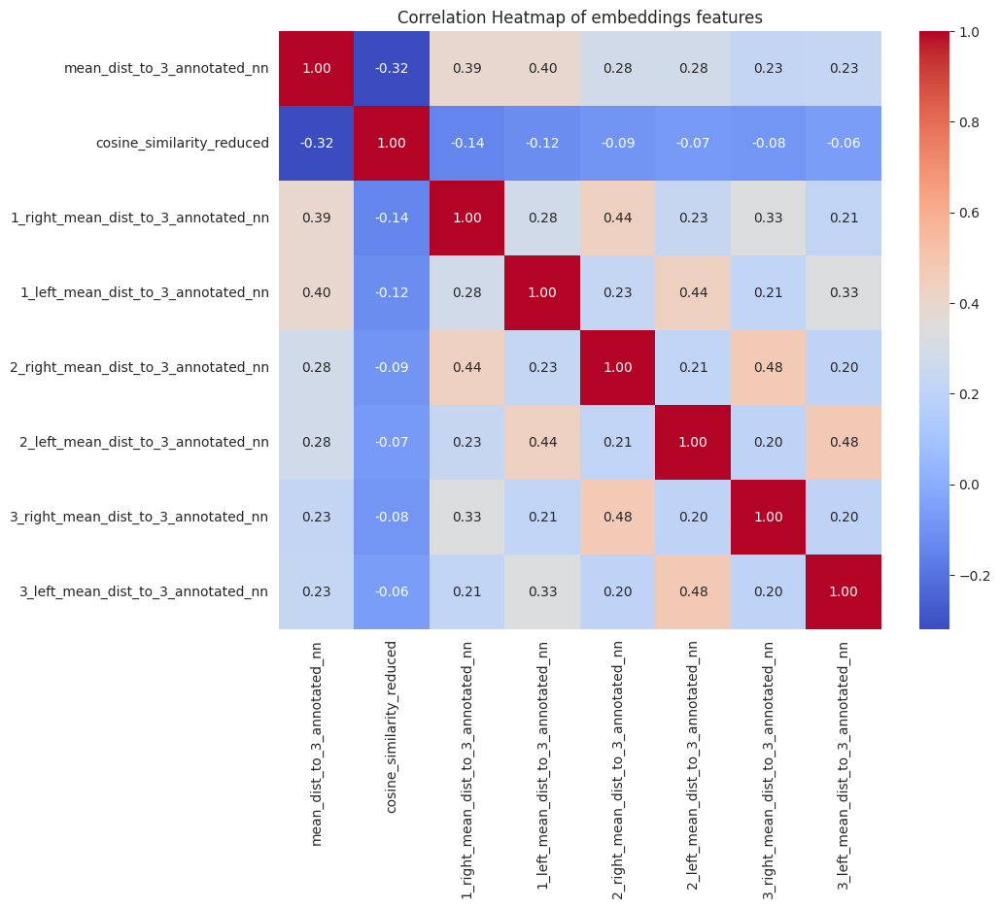

In [ ]:
embeddings_features = ["mean_dist_to_3_annotated_nn","cosine_similarity_reduced"]
for i in range(1,4):
  for is_right in [True, False]:
    relative_place = "right" if is_right else "left"
    column_name = f"{i}_{relative_place}_mean_dist_to_3_annotated_nn"
    embeddings_features.append(column_name)

correlation_matrix = token_pair_df[embeddings_features].corr()

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of embeddings features')
plt.show()


The embedding-based features show substantial redundancy, with many displaying strong positive correlations—especially those from distance calculations between neighboring tokens, where correlations often exceed 0.4.

This suggests that several features capture overlapping information, warranting potential dimensionality reduction.

While ModernBERT embeddings were introduced to address the limitations of word-matching methods by leveraging semantic distances, generalizing to new cases still requires more labeled data.

Back up for feature extraction

In [ ]:
# import os

# def save_dataframe(df: pd.DataFrame, filename: str):
#   """Saves a pandas DataFrame to a file.

#   Args:
#     df: The DataFrame to save.
#     filename: The name of the file to save to.
#   """
#   df.to_pickle(filename)

# backups_dir = "dataframe_backups"
# os.makedirs(backups_dir, exist_ok=True)

# save_dataframe(token_pair_df, os.path.join(backups_dir, f"{BASE_DIRECTORY}token_pair_df.pkl"))
# save_dataframe(word_train_df, os.path.join(backups_dir, f"{BASE_DIRECTORY}word_train_df.pkl"))
# print("DataFrame saved successfully to the 'dataframe_backups' directory.")


Load feature extraction data (instead of running the entire part)  

In [69]:
# import numpy as np
# import os
# from tqdm import tqdm
# from sklearn.decomposition import PCA
# backups_dir = "dataframe_backups"
# token_pair_df = pd.read_pickle(os.path.join(backups_dir, f"{BASE_DIRECTORY}token_pair_df.pkl"))
# token_pair_train_mask = get_df_mask_by_dataset_type(token_pair_df,"train")
# word_train_df = pd.read_pickle(os.path.join(backups_dir, f"{BASE_DIRECTORY}word_train_df.pkl"))
# token_pair_train_mask = get_df_mask_by_dataset_type(token_pair_df,"train")
# word_df_train_mask = get_df_mask_by_dataset_type(word_train_df,"train")
# words_features_names = [feature for feature in list(word_train_df.columns[15:]) if feature not in ["feature_synonyms", "annotated_set"]]
# embeddings_features = ["mean_dist_to_3_annotated_nn","cosine_similarity_reduced"]
# for i in range(1,4):
#   for is_right in [True, False]:
#     relative_place = "right" if is_right else "left"
#     column_name = f"{i}_{relative_place}_mean_dist_to_3_annotated_nn"
#     embeddings_features.append(column_name)
# def series_of_array_to_array(series: pd.Series) -> np.ndarray:
#   """
#   Converts a pandas Series of arrays into a single NumPy array.

#   Args:
#       series (pd.Series): A pandas Series where each element is an array.

#   Returns:
#       np.ndarray: A stacked NumPy array created from the Series of arrays.
#   """
#   return np.stack(series.to_numpy())

# def move_data_to_device(encoded_inputs: dict[str, torch.Tensor],device: str="cpu"):
#   return {key: value.to(device) if isinstance(value, torch.Tensor) else value for key, value in encoded_inputs.items()}

# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# def create_label_for_train_row(train_row: pd.Series) -> np.ndarray:
#   """
#   Creates a binary label array for a given training row, indicating which character positions
#   in the patient note are annotated.

#   Parameters:
#   - train_row (pd.Series): A row from the training DataFrame, containing 'pn_num' (patient note ID)
#     and 'location' (list of annotated spans as strings).

#   Returns:
#   - np.ndarray: A binary array of length equal to the patient note's length,
#     where 1 indicates an annotated character and 0 indicates non-annotated characters.
#   """
#   patient_note_length = pn_df[pn_df.pn_num==train_row.pn_num].pn_length.item()
#   label = np.zeros(patient_note_length)
#   for span_str in train_row.location:
#     for start, end in parse_location_string(span_str):
#       label[start:end] = 1
#   return label
# train_df["labels"] = train_df.apply(create_label_for_train_row, axis=1)

# 👷 Trys
Now that we've extracted features in various ways, it's time to build an effective model to tackle our core objective!

## Prediction Infrastructure
The following utility functions support efficient training and evaluation of our models.

Imports:

In [60]:
from sklearn.metrics import (f1_score,
                             accuracy_score,
                             roc_auc_score,
                             classification_report,
                             precision_score,
                             recall_score)
from sklearn.preprocessing import StandardScaler
import torch

Score and evaluation functions:

In [61]:
def micro_f1(preds: list[np.ndarray], truths: list[np.ndarray]) -> float:
  """
  Computes the micro-averaged F1 score for a set of predictions and ground truths.

  Parameters:
  - preds (list[np.ndarray]): A list of NumPy arrays containing binary predictions (0 or 1).
  - truths (list[np.ndarray]): A list of NumPy arrays containing binary ground truth labels (0 or 1).

  Returns:
  - float: The micro F1 score, which is the harmonic mean of precision and recall
    computed globally across all instances.
  """
  preds = np.concatenate(preds)
  truths = np.concatenate(truths)
  return f1_score(truths, preds)

def compute_metrics(preds: list[np.ndarray], truths: list[np.ndarray]) -> dict[str,float]:
    """
    Computes the micro-averaged F1 score, precision, and recall for a set of predictions and ground truths.

    Parameters:
    - preds (list[np.ndarray]): A list of NumPy arrays containing binary predictions (0 or 1).
    - truths (list[np.ndarray]): A list of NumPy arrays containing binary ground truth labels (0 or 1).

    Returns:
    - dict: A dictionary containing micro F1-score, precision, and recall.
    """
    preds = np.concatenate(preds)
    truths = np.concatenate(truths)

    micro_f1 = f1_score(truths, preds)
    precision = precision_score(truths, preds)
    recall = recall_score(truths, preds)

    return {
        "micro_f1": micro_f1,
        "precision": precision,
        "recall": recall
    }

In [62]:
def df_to_array(df: pd.DataFrame) -> np.ndarray:
  """
  Concatenates DataFrame columns to form a single NumPy array,
  handling columns of array and other columns.

  Parameters:
  - df (pd.DataFrame): The input DataFrame to be converted to a NumPy array.

  Returns:
  - np.ndarray: A NumPy array formed by concatenating all columns of the DataFrame.
  """

  def process_column(column):
    """Handles the conversion of each column depending on its type."""
    if isinstance(column.iloc[0], np.ndarray):
      return series_of_array_to_array(column)  # Assumed function to convert array series
    else:
      return np.expand_dims(column, axis=1)

  processed_columns = [process_column(df[column]) for column in df.columns]
  return np.concatenate(processed_columns, axis=1)

In [63]:
def eval_classifier(classifier,
                    X: np.ndarray,
                    y: pd.Series,
                    y_char_level: pd.Series,
                    train_mask: np.ndarray,
                    val_mask: np.ndarray,
                    do_standard_scaling: bool = True):
  """
  Train and Evaluates a classifier using accuracy, AUC-ROC, and F1 score at both word and character levels.

  Args:
      classifier (ClassifierMixin): A scikit-learn compatible classifier.
      X (pd.DataFrame): Feature matrix.
      y (pd.Series): Target labels.
      y_char_level (pd.Series): Character-level labels.
      train_mask (np.ndarray): Boolean mask for training samples.
      val_mask (np.ndarray): Boolean mask for validation samples.
      do_standard_scaling (bool, optional): Whether to apply standard scaling to the features. Defaults to True.

  Returns:
      The trained classifier.
  """
  X_train = X[train_mask]
  X_val = X[val_mask]
  y_train = y[train_mask].to_numpy()
  y_val = y[val_mask].to_numpy()
  y_val_char_level = y_char_level[val_mask]
  if do_standard_scaling:
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_val = scaler.transform(X_val)
  classifier.fit(X_train, y_train)

  y_pred = classifier.predict(X_val)
  y_pred_char_level = [np.ones(len(y_val_char_level.iloc[i])) if y_pred[i] == 1 else np.zeros(len(y_val_char_level.iloc[i])) for i in range(len(y_pred))]
  y_prob = classifier.predict_proba(X_val)[:, 1]

  print("Accuracy:", accuracy_score(y_val, y_pred))
  print("AUC-ROC:", roc_auc_score(y_val, y_prob))
  print("\nClassification Report:\n", classification_report(y_val, y_pred))
  print("Micro f1 character level score", micro_f1(y_pred_char_level, y_val_char_level.tolist()))
  return classifier

In [64]:
def get_fn_fp_mask(
  classifier,
  X: np.ndarray,
  y: np.ndarray,
  val_mask: np.ndarray
  ) -> tuple[np.ndarray, np.ndarray]:
  """
  Efficiently computes FN and FP masks for a word-level classifier
  on the validation set.

  Args:
      classifier: Trained classifier with a .predict method.
      X (np.ndarray): Feature matrix.
      y (np.ndarray): True binary labels.
      val_mask (np.ndarray): Boolean mask for validation samples.

  Returns:
      Tuple[np.ndarray, np.ndarray]:
          fn_mask and fp_mask over the validation set.
  """
  X_val = X[val_mask]
  y_val = y[val_mask]

  y_pred = classifier.predict(X_val)

  # Convert to numpy for efficient masking

  # Find indices of FN and FP

  fn_mask = (y_val == 1) & (y_pred == 0)
  fp_mask = (y_val == 0) & (y_pred == 1)

  return fn_mask, fp_mask


In [65]:
from IPython.display import display, Markdown

def display_spans(
    df: pd.DataFrame,
    id: int,
    start_col: str,
    end_col: str,
    label: str) -> None:
    """
    Display a highlighted span from a DataFrame row within the annotated document.

    Parameters
    ----------
    df : pd.DataFrame
        DataFrame with 'pn_num', 'feature_num', 'feature_text', and span columns.
    id : int
        id of the rows to visualize.
    start_col : str
        Column name for the span's start index.
    end_col : str
        Column name for the span's end index.
    label : str
        Label to assign to the highlighted span.
    """
    pn_num = df.loc[df.id==id, "pn_num"].iloc[0]
    feature_num = df.loc[df.id==id, "feature_num"].iloc[0]
    doc = get_patient_annotation_doc(pn_num, feature_num)
    words = df.loc[df.id==id]
    for index, row in words.iterrows():
      feature_text = row["feature_text"]
      start = int(row[start_col])
      end = int(row[end_col])

      doc["ents"].append({
          "start": start,
          "end": end,
          "label": label
      })

    display(Markdown(f"**Feature Text**: {feature_text}"))
    display_doc_with_colors(doc, {"Annotation": "pink"})

In [66]:
def plot_error_distribution_pie_charts(
    fp_df: pd.DataFrame,
    fn_df: pd.DataFrame,
    top_n: int = 15
) -> None:
    """
    Plots side-by-side pie charts showing the distribution of false positives and false negatives
    across feature numbers. Features outside the top N are grouped into an "Other" category.

    Args:
        fp_df (pd.DataFrame): DataFrame containing false positive entries.
        fn_df (pd.DataFrame): DataFrame containing false negative entries.
        top_n (int): Number of top features to display individually. Others are grouped as "Other".
    """

    def prepare_top_counts(counts: pd.Series, top_n: int) -> pd.Series:
        top_counts = counts.sort_values(ascending=False).head(top_n)
        other = counts.sum() - top_counts.sum()
        if other > 0:
            top_counts["Other"] = other
        return top_counts

    fp_counts = fp_df["feature_num"].value_counts().sort_index()
    fn_counts = fn_df["feature_num"].value_counts().sort_index()

    all_features = sorted(set(fp_counts.index).union(fn_counts.index))
    fp_counts = fp_counts.reindex(all_features, fill_value=0)
    fn_counts = fn_counts.reindex(all_features, fill_value=0)

    fp_top = prepare_top_counts(fp_counts, top_n)
    fn_top = prepare_top_counts(fn_counts, top_n)

    fig, axes = plt.subplots(1, 2, figsize=(16, 10))

    axes[0].pie(fp_top, labels=fp_top.index, autopct='%1.1f%%', startangle=140)
    axes[0].set_title(f"False Positives Distribution by Feature Number (Top {top_n} + Other)", fontsize=14)

    axes[1].pie(fn_top, labels=fn_top.index, autopct='%1.1f%%', startangle=140)
    axes[1].set_title(f"False Negatives Distribution by Feature Number (Top {top_n} + Other)", fontsize=14)

    plt.tight_layout()
    plt.show()


In [67]:
import shap

def plot_shap_diagnostics(
    classifier,
    X: pd.DataFrame,
    val_mask: np.ndarray,
    fp_mask: np.ndarray,
    fn_mask: np.ndarray,
    feature_names: list[str],
):
    """
    Visualize SHAP-based explanations for model predictions on a validation set.

    This function computes SHAP values and generates beeswarm plots to analyze
    feature contributions across all predictions, false positives, and false negatives.

    Parameters
    ----------
    classifier :
        Trained classification model to be explained.
    X : pd.DataFrame
        Full feature matrix.
    val_mask : np.ndarray
        Boolean mask specifying the validation subset.
    fp_mask : np.ndarray
        Boolean mask identifying false positives within the validation set.
    fn_mask : np.ndarray
        Boolean mask identifying false negatives within the validation set.
    feature_names : list[str]
        List of feature column names
    Returns
    -------
        Displays SHAP beeswarm plots.
        Returns
        SHAP values object, useful for further analysis.
    """
    X_val = X[val_mask]

    explainer = shap.Explainer(classifier)
    shap_values = explainer(X_val)
    shap_values.feature_names = feature_names

    plt.figure()
    plt.title("Feature Impact on All Validation Predictions")
    shap.plots.beeswarm(shap_values, show=False)
    plt.show()

    plt.figure()
    plt.title("Feature Impact on False Positives")
    shap.plots.beeswarm(shap_values[fp_mask.tolist()], show=False)
    plt.show()

    plt.figure()
    plt.title("Feature Impact on False Negatives")
    shap.plots.beeswarm(shap_values[fn_mask.tolist()], show=False)
    plt.show()

    return shap_values

In [68]:
def display_shap_waterfalls_by_id(
    shap_values,
    data_subset: pd.DataFrame,
    sub_set_mask: pd.Series,
    target_id: str,
    text_column: str,
    max_examples: int = 5
) -> None:
    """
    Display SHAP waterfall plots for samples with a given ID.

    Parameters
    ----------
    shap_values :
        SHAP values aligned with data_subset.
    data_subset : pd.DataFrame
        DataFrame containing 'id' and a text column.
    data_subset_mask : pd.Series
         mask for shap values for getting the shap values of the subset.
    target_id : str
        ID to filter and visualize.
    text_column : str
        Column with text to display above each plot.
    max_examples : int
        Max number of plots to show.
    """
    mask = data_subset["id"] == target_id
    subset_texts = data_subset.loc[mask, text_column].reset_index(drop=True)
    subset_shap = shap_values[sub_set_mask.tolist()][mask.tolist()][:max_examples]

    for i, shap_value in enumerate(subset_shap):
        text = subset_texts.iloc[i]
        display(Markdown(f"<span style='font-size:30px'><b>{text_column}:</b> {text}</span>"))
        shap.plots.waterfall(shap_value)

## First Attempt - Classify Words
As it's the most simple and explainable approach let's start by building a word classifier.
- We chose XGBoost for our word-level classifier because it performs well empirically on structured, tabular tasks and efficiently models non-linear relationships between features, making it a solid choice.

In [ ]:
X_word = df_to_array(word_train_df.loc[:,["case_num","feature_num"]+words_features_names])
y_word = word_train_df.word_label.astype(int)
y_char_level_word = word_train_df.word_labels
word_val_mask = get_df_mask_by_dataset_type(word_train_df,"val")


In [ ]:
from xgboost import XGBClassifier
word_classifier = XGBClassifier(random_state=42)
word_classifier = eval_classifier(word_classifier, X_word, y_word, y_char_level_word, word_df_train_mask, word_val_mask, do_standard_scaling=False)

Accuracy: 0.9913590482968789
AUC-ROC: 0.9851747290315632

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00    401688
           1       0.83      0.64      0.72      7179

    accuracy                           0.99    408867
   macro avg       0.91      0.82      0.86    408867
weighted avg       0.99      0.99      0.99    408867

Micro f1 character level score 0.7241529315094978


Our word-level classifier achieves surprisingly good results, although it's important to remember that it doesn't account for spaces between words.

To further improve its performance, it's essential to understand what drove the model's predictions—particularly the factors behind its incorrect ones.

In [ ]:
fn_mask, fp_mask = get_fn_fp_mask(
  word_classifier,
  X_word,
  y_word,
  word_val_mask
  )

In [ ]:
valid_subset = word_train_df[word_val_mask]
tp_subset = valid_subset[~fn_mask&(valid_subset.word_label==1)]
tn_subset = valid_subset[~fp_mask&(valid_subset.word_label==0)]
fn_subset = valid_subset[fn_mask]
fp_subset = valid_subset[fp_mask]

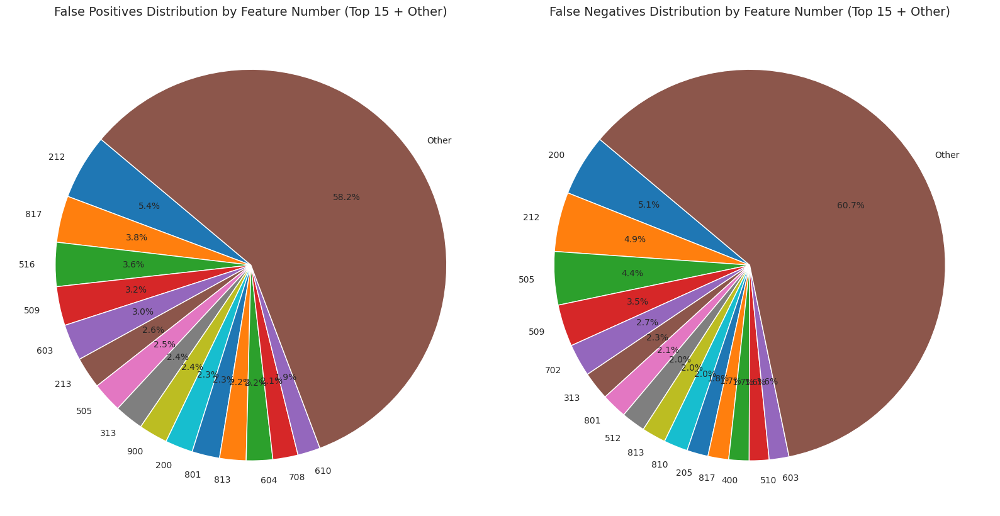

In [ ]:
plot_error_distribution_pie_charts(fp_subset,fn_subset)

Looking at the pie charts, we can see that while some features have more mistakes than others, the difference isn’t dramatic—no single feature stands out as causing most of the false positives or false negatives.

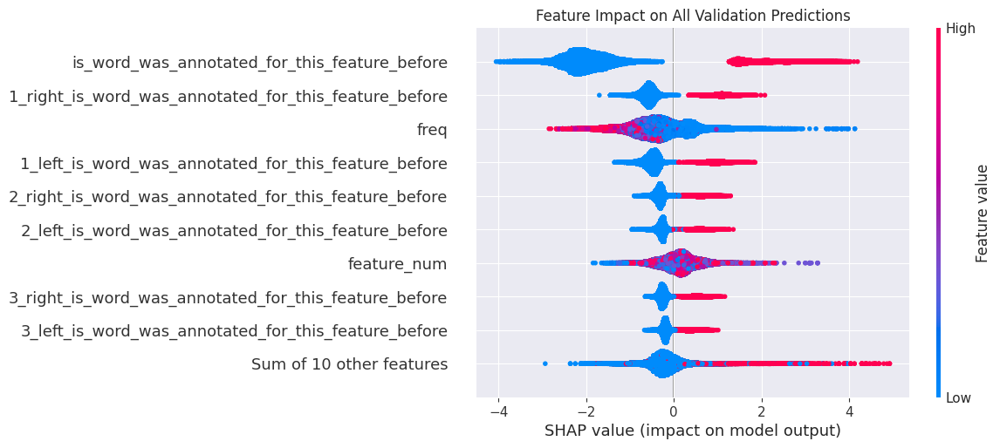

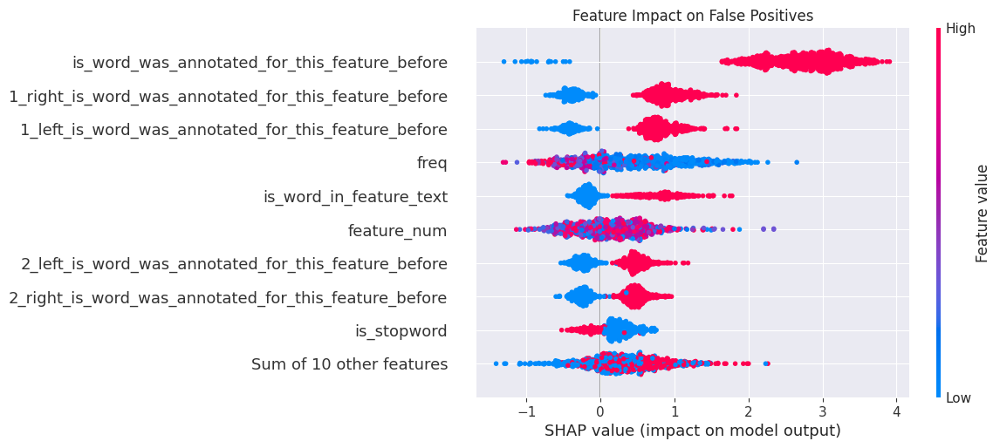

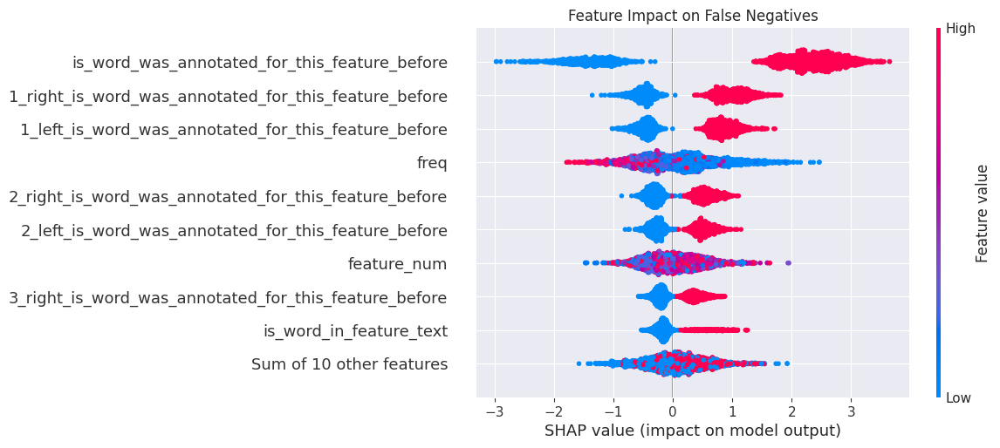

In [ ]:
shap_values = plot_shap_diagnostics(
    word_classifier,
    X_word,
    word_val_mask,
    fp_mask,
    fn_mask,
    ["case_num","feature_num"] + words_features_names,
    )

From the beeswarm plots, we can observe the following insights:

**Overall Trends**:

* The most impactful feature was whether the word had been annotated for this feature in the past.
* Contextual annotations—specifically, whether neighboring words (to the left or right) were previously annotated—also played a significant role.
* Frequency had a strong directional effect: **very low-frequency words** pushed the model *toward* annotation, while **very high-frequency words** pushed it *away* from annotation.

**False Positives**:

* By far, the most influential feature driving false positives was the word having been annotated before.
* Other contributing features included the word’s appearance in the feature text, annotated neighbors, and low frequency.

**False Negatives**:

* The same set of features remained dominant, but their influence was often weaker.
* In many of these cases, signals suggesting a word should be annotated were present but not strong enough to surpass the model’s decision threshold.
* This may reflect the imbalanced nature of the dataset, making it harder for the model to detect true positives.

Since the model’s recall is significantly lower than its precision, it's important to focus on understanding its false negatives. Let’s examine one such example to gain better insight into what might be going wrong:

**Feature Text**: duration 3 weeks

<span style='font-size:30px'><b>pn_history_word:</b> starte</span>

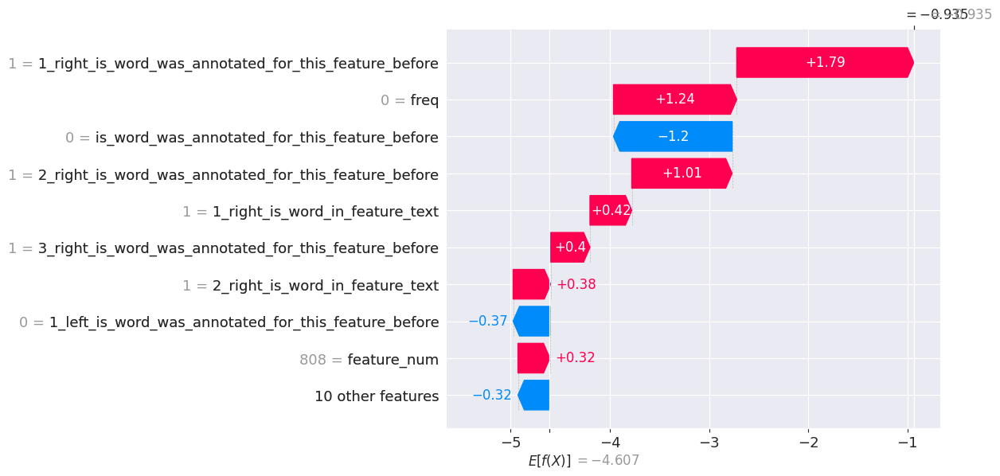

<span style='font-size:30px'><b>pn_history_word:</b> 3</span>

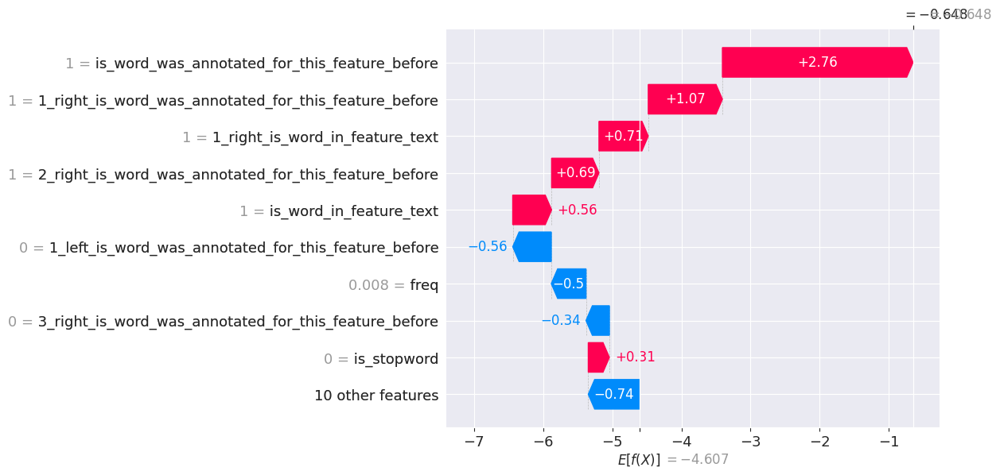

<span style='font-size:30px'><b>pn_history_word:</b> weeks</span>

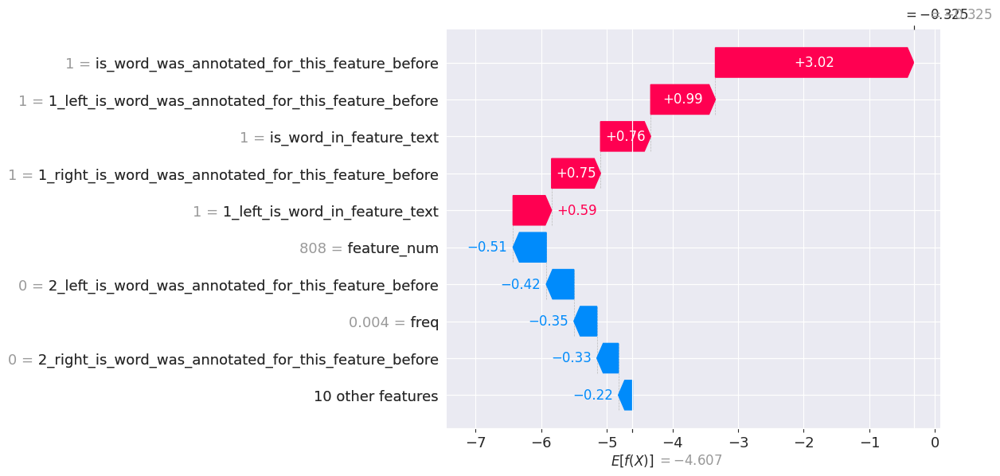

<span style='font-size:30px'><b>pn_history_word:</b> ago</span>

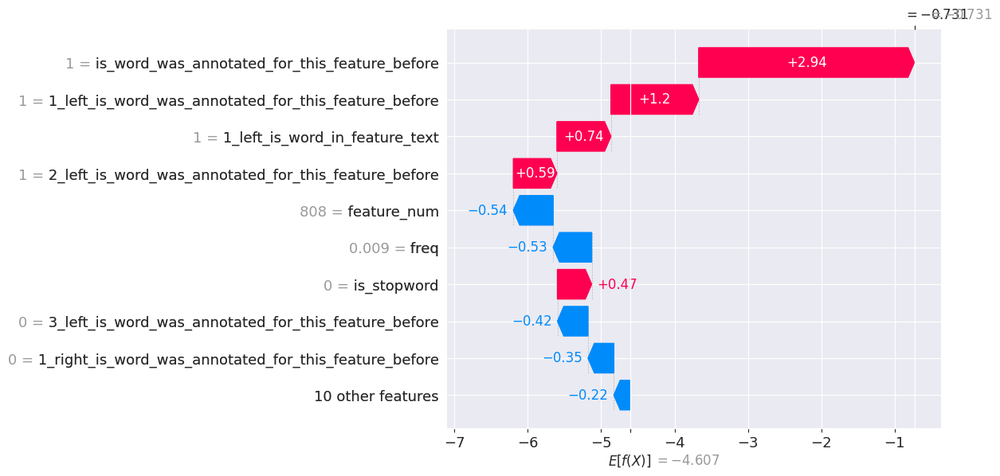

In [ ]:
np.random.seed(42)
fn_word_samples = np.random.permutation(fn_subset["id"].drop_duplicates())
display_spans(fn_subset, fn_word_samples[0], "words_start_index", "words_end_index", "FN_WORD")
fn_sample_id = fn_word_samples[0]

display_shap_waterfalls_by_id(
    shap_values,
    fn_subset,
    fn_mask,
    fn_sample_id,
    "pn_history_word",
)

In this patient note–feature pair, the word "starte", a misspelling of "started", had never been annotated before. This led to a strong negative SHAP value from the `is_word_was_annotated_for_this_feature_before` feature, lowering the model’s confidence and causing it to miss the annotation.

In the nearby cases, "starte" also harmed contextual features like `1/2/3_left_is_word_was_annotated_before`, further reducing the prediction scores. Had "starte" been seen during training, these features might have pushed the predictions above the threshold.

This highlights a key limitation of the word-matching approach: it is highly sensitive to minor format changes and misspellings.

> To summarize this first attempt, our word-level classifier achieved a **respectable micro F1 score of 0.724**, despite **not accounting for spaces between words**.
> Its **precision (83%)** is notably higher than its **recall (64%)**, indicating that while the model is cautious, it often **misses relevant annotations**.
> A key limitation is the model’s heavy reliance on matching words seen during training, leading to two main types of errors:
> * **Recall errors** – The model struggles with **unseen variations** in how features are expressed, including misspellings and rephrasings.
> * **Precision errors** – Due to **limited contextual understanding**, the model sometimes falsely annotates similar but irrelevant phrases.

## Second Attempt – Classify Tokens

Because **ModernBERT embeddings** capture richer contextual information compared to simple word matching, it's reasonable to expect that a model built on this approach will better handle the challenges faced by our word-level classifier — namely, **unseen variations** and **limited contextual understanding**.
In this attempt, we’ll build a **token-level classifier** using embedding-based features.

As the embeddings themselves capture rich semantic information, we want to leverage them directly — not just the handcrafted features we've extracted from them.

Just like in the word-matching approach, the XGBoost classifier remains a solid choice for this stage as well.

Let’s give it a try:

In [93]:
X_token = df_to_array(token_pair_df.loc[:,embeddings_features+["embeddings","feature_text_embeddings","case_num","feature_num"]])
y_token = token_pair_df.token_label.astype(int)
y_char_level_token = token_pair_df.labels
val_mask_token = get_df_mask_by_dataset_type(token_pair_df,"val")

In [94]:
from xgboost import XGBClassifier
token_classifier = XGBClassifier(random_state=42)
token_classifier = eval_classifier(token_classifier, X_token, y_token, y_char_level_token, token_pair_train_mask, val_mask_token)

Accuracy: 0.9926349123233532
AUC-ROC: 0.9825916042705831

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00    632379
           1       0.81      0.64      0.72      9297

    accuracy                           0.99    641676
   macro avg       0.90      0.82      0.86    641676
weighted avg       0.99      0.99      0.99    641676

Micro f1 character level score 0.7086797878545366


In terms of F1 score, the embedding-based model performed slightly worse than the word-matching model (0.709 vs. 0.724). However, it’s important to note that the word-matching model does not operates on the full text.

Interestingly, both models showed similar performance in terms of precision (81% vs. 83%) and recall (64% vs. 64%), making their overall performance **pretty equal for now**, despite their different architectures and inputs.

Let’s dive in to better understand what drives the embedding-based classifier and comparing it to the word-level model.

In [95]:
scaler = StandardScaler()
scaler.fit(X_token[token_pair_train_mask])
X_token_scaled = scaler.transform(X_token)

fn_token_mask, fp_token_mask = get_fn_fp_mask(
  token_classifier,
  X_token_scaled,
  y_token,
  val_mask_token
  )

token_valid_subset = token_pair_df[val_mask_token]
tp_token_subset = token_valid_subset[~fn_token_mask&(token_valid_subset.token_label==1)]
tn_token_subset = token_valid_subset[~fp_token_mask&(token_valid_subset.token_label==0)]
fn_token_subset = token_valid_subset[fn_token_mask]
fp_token_subset = token_valid_subset[fp_token_mask]

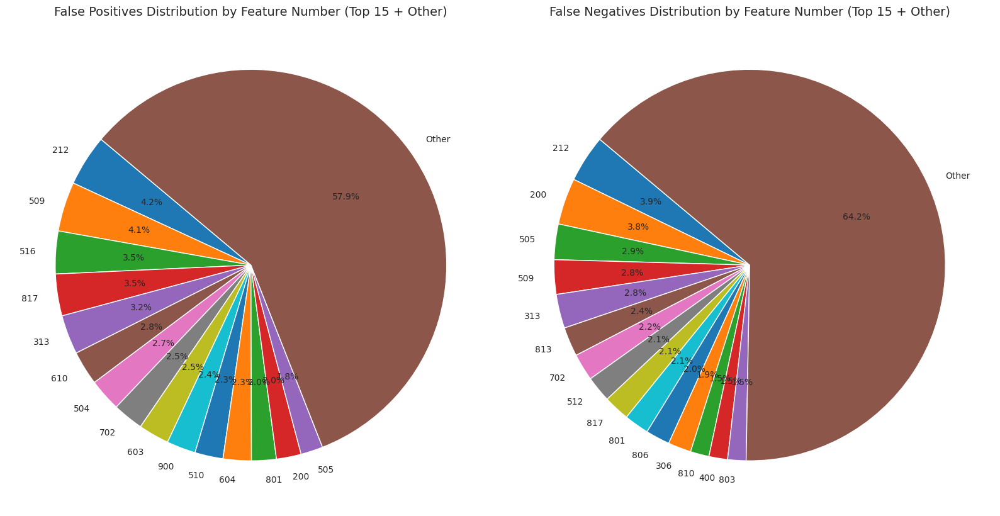

In [ ]:
plot_error_distribution_pie_charts(fp_token_subset,fn_token_subset)

From the pie chart, we can see that — similar to our word classifier — there are certain features where the token classifier makes more mistakes. However, the imbalance isn't extreme, and no single feature dominates the errors.

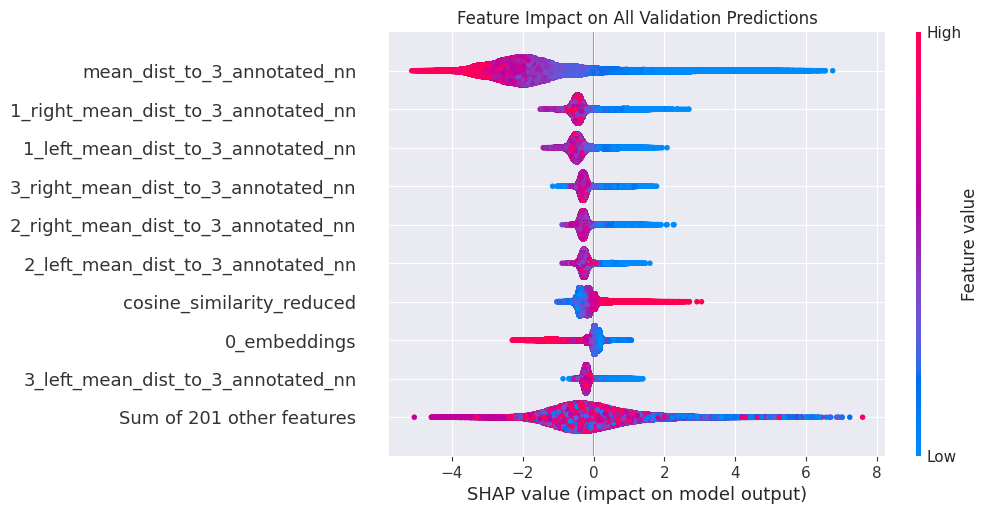

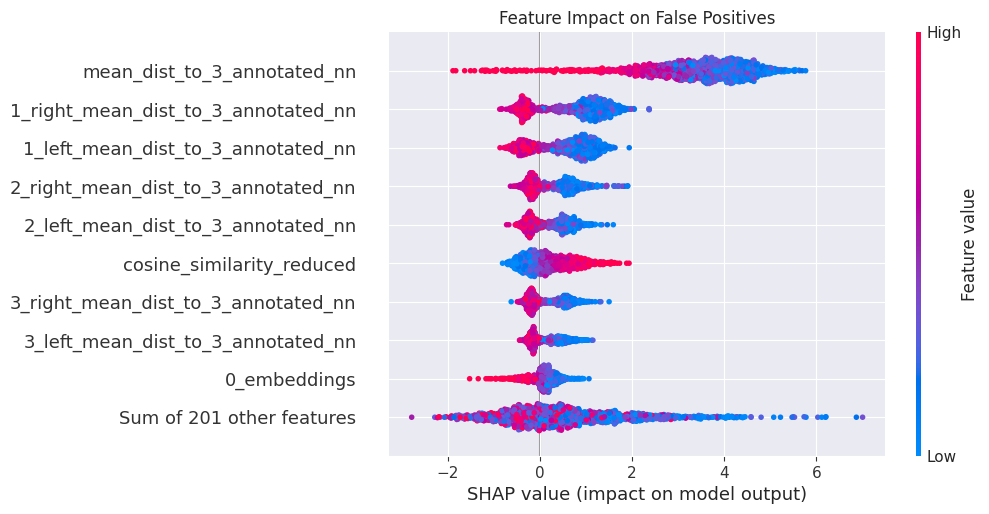

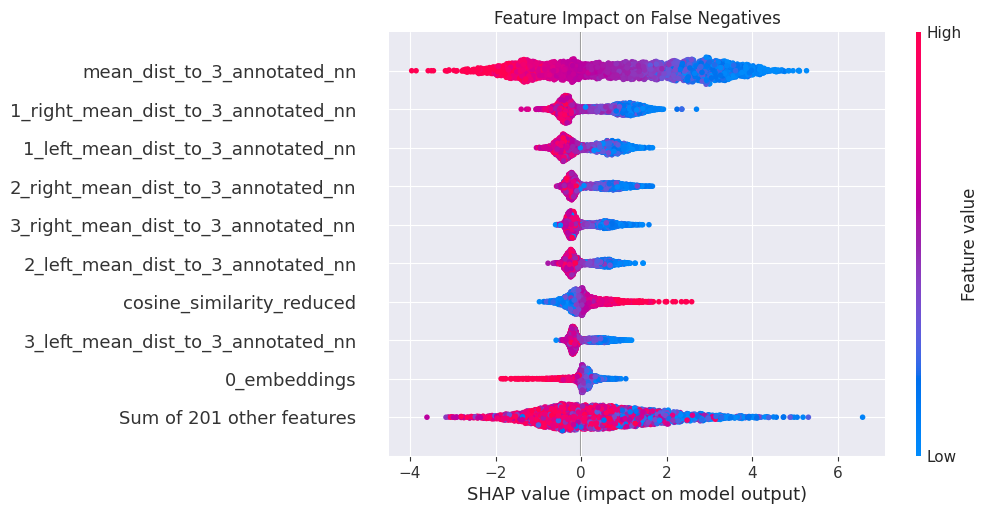

In [ ]:
tokens_shap_values = plot_shap_diagnostics(
    token_classifier,
    X_token_scaled,
    val_mask_token,
    fp_token_mask,
    fn_token_mask,
    embeddings_features +
     [f"{i}_embeddings" for i in range(100)] +
     [f"{i}_feature_text_embeddings" for i in range(100)] +
     ["case_num","feature_num"]
    )

The SHAP analysis shows that the most important features in our embedding-based model are distance-based ones—especially `mean_dist_to_3_annotated_nn`, which clearly has the biggest individual impact. Its neighbor-based versions and `cosine_similarity_reduced` also contribute a lot, with lower distances (i.e., higher similarity to known annotations) usually pushing predictions higher.

At the same time, the **combined effect of the other 201 features**—mostly **embedding coordinates**—is also pretty strong. While no single coordinate stands out, together they add up and help the model pick up on patterns that the distance features might miss.

All in all, the model depends on both the **structured distance features** and the **information hidden in the embeddings**, and it’s really the combination of the two that makes it work.

Looking at errors, in false positives, the model often gets “tricked” by low distances—it sees a word that looks close to annotated ones and decides to annotate even when it shouldn’t. In false negatives, we see the opposite: the distances might not be low enough, or the embedding pattern isn’t strong enough to push the score past the threshold.

Let's compare the results of our token-level classifier with those of our word-level classifier:

To compare the similarity between our two classifiers, we calculate the total number of false positive and false negative characters per id. Since the token-level classifier accounts for spaces while the word-level one does not, it naturally processes more characters and is biased toward both higher true and false character counts.

To assess their alignment, we compute the correlation between their error distributions and visualize the results.

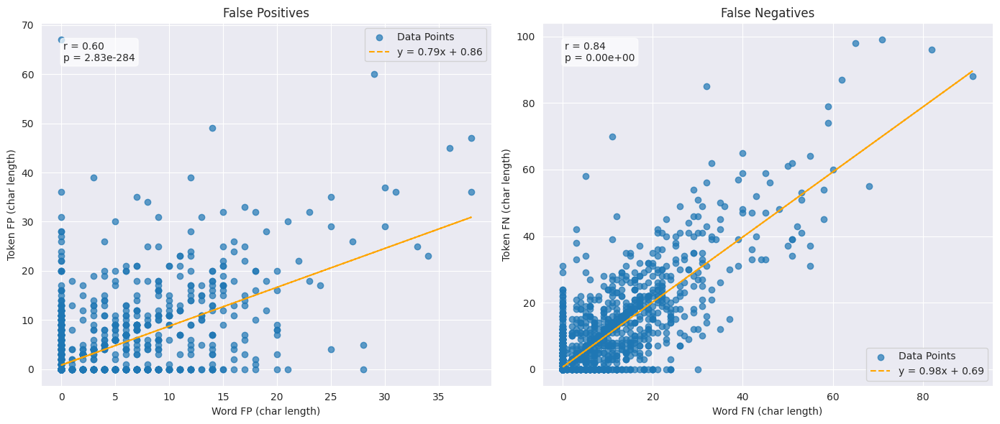

In [ ]:
val_ids = train_df[get_df_mask_by_dataset_type(train_df, "val")]["id"].unique()

# Count FP and FN per ID for both models
token_fp = token_valid_subset[fp_token_mask].groupby("id")["token_text"].apply(lambda x: sum(len(s) for s in x)).reindex(val_ids, fill_value=0)
word_fp = word_train_df[word_val_mask][fp_mask].groupby("id")["pn_history_word"].apply(lambda x: sum(len(s) for s in x)).reindex(val_ids, fill_value=0)
token_fn = token_valid_subset[fn_token_mask].groupby("id")["token_text"].apply(lambda x: sum(len(s) for s in x)).reindex(val_ids, fill_value=0)
word_fn = word_train_df[word_val_mask][fn_mask].groupby("id")["pn_history_word"].apply(lambda x: sum(len(s) for s in x)).reindex(val_ids, fill_value=0)

# Combine into one DataFrame
errors_df = pd.DataFrame({
    "token_fp": token_fp,
    "word_fp": word_fp,
    "token_fn": token_fn,
    "word_fn": word_fn
})


from scipy.stats import linregress

# Set up subplot layout
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=False, sharey=False)

# Define plotting logic
def plot_with_regression(ax, x, y, xlabel, ylabel, title):
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    reg_line = slope * x + intercept

    ax.scatter(x, y, alpha=0.7, label="Data Points")
    ax.plot(x, reg_line, color='orange', linestyle='--', label=f"y = {slope:.2f}x + {intercept:.2f}")
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.legend()
    ax.grid(True)
    ax.text(
        0.05, 0.95,
        f"r = {r_value:.2f}\np = {p_value:.2e}",
        ha="left", va="top", transform=ax.transAxes,
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.7)
    )

# Plot both subplots
plot_with_regression(
    axes[0],
    x=errors_df["word_fp"],
    y=errors_df["token_fp"],
    xlabel="Word FP (char length)",
    ylabel="Token FP (char length)",
    title="False Positives"
)

plot_with_regression(
    axes[1],
    x=errors_df["word_fn"],
    y=errors_df["token_fn"],
    xlabel="Word FN (char length)",
    ylabel="Token FN (char length)",
    title="False Negatives"
)

plt.tight_layout()
plt.show()

As we can see, false negative counts between the token and word classifiers are **strongly correlated** (r = 0.85), meaning both models tend to miss the same examples. This shows that they struggle in similar ways to catch features expressed in new or unexpected ways. We had hoped that the token classifier would be better at spotting subtle patterns and generalizing beyond the training data — but in practice, it ends up making many of the same mistakes as the word model.

On the other hand, false positives show a **moderate correlation** (r = 0.60), so while the models sometimes agree on overpredictions, they also have their own traits. The token model might overreact to local signals, while the word model leans more on memorized patterns.

In the end, both models are quite similar overall — and the key challenge remains recall.

## Third Attempt – Fine-Tuning ModernBERT

So far, we’ve trained classifiers on top of handcrafted features and frozen ModernBERT embeddings. While our word-level model relied on contextual word-matching, and our token-level model used semantic distances and embedding-based signals, both approaches still **struggle to generalize to new or varied expressions of clinical features not seen during training**.

In this third attempt, we shift to an **end-to-end approach**: we fine-tune **ModernBERT** directly on the patient notes and train the model to decide — based on raw text — whether each token expresses a given clinical feature.

Each input is constructed as:
`[PATIENT NOTE] [SEP] [FEATURE TEXT]`
The model is fine-tuned using a classification head on top of ModernBERT to output a binary label for each token in the patient note, conditioned on the specific feature.

This method gives the model full flexibility to learn relevant patterns without relying on handcrafted features. It represents a major step toward enabling the model to learn **clinical expression patterns directly from text**, with the potential to improve generalization.

### Pre-training with Masked Language Modeling (MLM)

**Masked Language Modeling (MLM)** involves masking parts of the input text and training the model to predict the masked tokens, allowing it to capture contextual relationships. We leveraged MLM as an additional pre-training step to enhance the model's understanding of clinical language. Since most patient notes are unannotated, MLM enables us to effectively utilize these unannotated notes for pre-training, enriching the model's contextual knowledge.

### Optimization Trials

To maximize performance, we experimented with:

1. **Dropout before the classification head (with/without).**
2. **Weight decay during optimization (with/without).**
3. **MLM pre-training (with/without).**
4. **Model size (ModernBERT Base vs. ModernBERT Large).**

#### Best Configuration:

The optimal setup consisted of **using MLM pre-training**, **omitting weight decay**, and **disabling dropout**. Additionally, we found that **ModernBERT Large consistently outperformed ModernBERT Base**, making it the preferred choice. The results of this configuration are detailed in the following section.


In [70]:
import torch
from transformers import AutoModel
from transformers import AutoTokenizer
from tqdm import tqdm

In [ ]:
!pip install flash-attn  # Install FlashAttention for faster and more memory-efficient attention computations

#### MLM

##### Hyperparameters

In [ ]:
# Train for a single epoch due to the large size of the training data and time constraints
BATCH_SIZE = 30
EPOCHS = 1
LR = 2e-5
MODEL_NAME = "answerdotai/ModernBERT-large"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

##### Datasets

For MLM pre-training, we’ll use all the **unlabeled patient notes** since they give us plenty of raw text to learn from.
For validation, we’ll use the **training data without the validation set** to make sure we’re not leaking any data.
This way, we make the most of the available data while keeping the validation fair.

In [ ]:
pn_df_for_mlm_train = pn_df.loc[(~get_df_mask_by_dataset_type(pn_df, "train"))&(~get_df_mask_by_dataset_type(pn_df, "val"))]
pn_df_for_mlm_val = pn_df.loc[get_df_mask_by_dataset_type(pn_df, "train")]


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader

class PatientNotesDataset(Dataset):
    def __init__(self, dataframe, tokenizer, max_length=512):
        self.data = dataframe
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        text = self.data.iloc[idx]['pn_history']
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )
        return {
            'input_ids': encoding['input_ids'].squeeze(0),
            'attention_mask': encoding['attention_mask'].squeeze(0),
        }


# Create datasets
train_dataset = PatientNotesDataset(pn_df_for_mlm_train, tokenizer)
val_dataset = PatientNotesDataset(pn_df_for_mlm_val, tokenizer)

##### Model

In [ ]:
if torch.cuda.is_available():
    torch.cuda.empty_cache()

In [ ]:
from transformers import AutoModelForMaskedLM

model = AutoModelForMaskedLM.from_pretrained(MODEL_NAME)
model

config.json:   0%|          | 0.00/1.19k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.58G [00:00<?, ?B/s]

ModernBertForMaskedLM(
  (model): ModernBertModel(
    (embeddings): ModernBertEmbeddings(
      (tok_embeddings): Embedding(50368, 1024, padding_idx=50283)
      (norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
      (drop): Dropout(p=0.0, inplace=False)
    )
    (layers): ModuleList(
      (0): ModernBertEncoderLayer(
        (attn_norm): Identity()
        (attn): ModernBertAttention(
          (Wqkv): Linear(in_features=1024, out_features=3072, bias=False)
          (rotary_emb): ModernBertRotaryEmbedding()
          (Wo): Linear(in_features=1024, out_features=1024, bias=False)
          (out_drop): Identity()
        )
        (mlp_norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
        (mlp): ModernBertMLP(
          (Wi): Linear(in_features=1024, out_features=5248, bias=False)
          (act): GELUActivation()
          (drop): Dropout(p=0.0, inplace=False)
          (Wo): Linear(in_features=2624, out_features=1024, bias=False)
        )
      )
    

##### Train

In [ ]:
import os
from transformers import DataCollatorForLanguageModeling
from transformers import Trainer, TrainingArguments
import wandb

data_collator = DataCollatorForLanguageModeling(tokenizer=tokenizer, mlm_probability=0.15)


os.makedirs(os.path.join(BASE_DIRECTORY, "mlm_results"), exist_ok=True)
training_args = TrainingArguments(
    output_dir=os.path.join(BASE_DIRECTORY, "mlm_results"),
    overwrite_output_dir=True,
    eval_strategy="steps",
    eval_steps=100,
    save_strategy="steps",
    save_steps=100,
    logging_strategy="steps",
    logging_steps=1,
    per_device_train_batch_size=BATCH_SIZE,
    per_device_eval_batch_size=BATCH_SIZE,
    learning_rate=1e-5,
    num_train_epochs=EPOCHS,
    report_to="wandb",
    run_name="mlm_modern_bert_large"
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    data_collator=data_collator,
    tokenizer=tokenizer,
)

trainer.train()

wandb.finish()


<ipython-input-12-09cf057aaf0e>:23: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(
wandb: Currently logged in as: gilrodni (gilrodni-open-university-of-israel) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Step,Training Loss,Validation Loss
100,1.080600,1.070607
200,0.803400,0.952413
300,0.863000,0.916510
400,0.893400,0.899865
500,0.904200,0.883422
600,0.905500,0.867292
700,0.839700,0.843613
800,0.792600,0.852790
900,0.811800,0.832379
1000,0.721400,0.816190


/usr/local/lib/python3.11/dist-packages/torch/_inductor/compile_fx.py:194: UserWarning: TensorFloat32 tensor cores for float32 matrix multiplication available but not enabled. Consider setting `torch.set_float32_matmul_precision('high')` for better performance.
  warnings.warn(


eval/loss,█▅▄▄▃▃▂▂▂▁▁▂▁
eval/runtime,█▁▁▁▁▁▁▁▁▁▁▁▁
eval/samples_per_second,▁████████▇▇▇█
eval/steps_per_second,▁████████▇▇▇█
train/epoch,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇██
train/global_step,▁▁▁▁▁▂▂▂▂▂▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇█████
train/grad_norm,▂▁▃▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▂▁▁▂▁▁▂▁▁▁▁
train/learning_rate,█▇▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁
train/loss,▇▇▄█▆▆▅▄▄▄▃▃▃▅▄▅▃▂▄▃▆▃▃▃▂▃▃▆▄▂▄▂▅▁▅▃▅▂▁▃
eval/loss,0.81379
eval/runtime,9.7971


As we can see, after 1100 steps, our model achieved the best results on the validation data. Therefore, we'll use this checkpoint as the starting point for fine-tuning the downstream task.

#### Fine-Tuning

##### Hyperparameters

In [71]:
BATCH_SIZE = 10
EPOCHS = 6  # Chosen based on trials; training for fewer epochs led to overfitting
LR = 1e-5
MODEL_NAME = "answerdotai/ModernBERT-large"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.13M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/694 [00:00<?, ?B/s]

##### Datasets

In [72]:
from torch.utils.data import Dataset, DataLoader

In [73]:
class CustomDataset(Dataset):
  def __init__(self,
               pn_histories: list[str],
               feature_text: list[str],
               pn_char_labels: list[np.ndarray],
               tokenizer):
    super().__init__()
    self.tokenizer = tokenizer
    self.pn_histories = pn_histories
    self.feature_text = feature_text
    self.pn_char_labels = pn_char_labels

  def create_labels(self,
                    pn_char_labels: np.ndarray,
                    model_input: dict[str, torch.Tensor]) -> torch.Tensor:
    """
    create label for each token:
        0 should not be annotated,
        1 should,
       -1 should be ignored
    """
    labels = np.full(model_input["input_ids"].shape[1], -1)
    tokens_of_pn_history_mask = np.array(model_input.sequence_ids())==0
    labels_of_pn_histories = pn_char_labels[model_input["offset_mapping"][0,tokens_of_pn_history_mask,0]]
    labels[tokens_of_pn_history_mask] = labels_of_pn_histories
    return torch.tensor(labels)

  def __len__(self) -> int:
    return len(self.pn_histories)

  def __getitem__(self, idx: int) -> tuple[dict[str,torch.Tensor],torch.Tensor]:
    pn_history = self.pn_histories[idx]
    feature_text = self.feature_text[idx]
    pn_char_labels = self.pn_char_labels[idx]

    model_input = tokenizer(pn_history,
                            feature_text,
                            max_length=512, # extra padding to handle longer input in the future
                            padding="max_length",
                            return_tensors="pt",
                            return_offsets_mapping=True)
    labels = self.create_labels(pn_char_labels, model_input)
    model_input["input_ids"] = model_input["input_ids"].squeeze(0)
    model_input["attention_mask"] = model_input["attention_mask"].squeeze(0)
    return model_input, labels


In [76]:
train_mask_for_train_df = get_df_mask_by_dataset_type(train_df,"train")
val_mask_for_train_df = get_df_mask_by_dataset_type(train_df,"val")

train_dataset = CustomDataset(train_df.loc[train_mask_for_train_df].pn_history.tolist(),
              train_df.loc[train_mask_for_train_df].feature_text.tolist(),
              train_df.loc[train_mask_for_train_df].labels.tolist(),
              tokenizer)
val_dataset = CustomDataset(train_df.loc[val_mask_for_train_df].pn_history.tolist(),
              train_df.loc[val_mask_for_train_df].feature_text.tolist(),
              train_df.loc[val_mask_for_train_df].labels.tolist(),
              tokenizer)

##### Dataloaders

In [77]:
from itertools import cycle
train_loader = DataLoader(train_dataset,
                          batch_size=BATCH_SIZE,
                          shuffle=True,
                          pin_memory=True,
                          drop_last=True)
val_loader = DataLoader(val_dataset,
                        batch_size=BATCH_SIZE,
                        shuffle=False,
                        pin_memory=True,
                        drop_last=True)

cycle_val_loader = cycle(val_loader)


##### Model

In [78]:
class BertClassifierNetwork(torch.nn.Module):
    def __init__(self, bert_model):
        super().__init__()
        self.bert = bert_model
        self.config = self.bert.config
        self.fc = torch.nn.Linear(self.bert.config.hidden_size, 1)
        # self.drop_out = torch.nn.Dropout(0.2)
    def forward(self, input_ids, attention_mask):
        features = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        # score = self.fc(self.drop_out(features.last_hidden_state))
        score = self.fc(features.last_hidden_state)
        return score

In [ ]:
import os
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if torch.cuda.is_available():
    torch.cuda.empty_cache()
mlm_dir = os.path.join(BASE_DIRECTORY, "mlm_results")
classifier_model = BertClassifierNetwork(AutoModel.from_pretrained(os.path.join(mlm_dir,"checkpoint-1100")))
classifier_model.to(device)

BertClassifierNetwork(
  (bert): ModernBertModel(
    (embeddings): ModernBertEmbeddings(
      (tok_embeddings): Embedding(50368, 1024, padding_idx=50283)
      (norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
      (drop): Dropout(p=0.0, inplace=False)
    )
    (layers): ModuleList(
      (0): ModernBertEncoderLayer(
        (attn_norm): Identity()
        (attn): ModernBertAttention(
          (Wqkv): Linear(in_features=1024, out_features=3072, bias=False)
          (rotary_emb): ModernBertRotaryEmbedding()
          (Wo): Linear(in_features=1024, out_features=1024, bias=False)
          (out_drop): Identity()
        )
        (mlp_norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
        (mlp): ModernBertMLP(
          (Wi): Linear(in_features=1024, out_features=5248, bias=False)
          (act): GELUActivation()
          (drop): Dropout(p=0.0, inplace=False)
          (Wo): Linear(in_features=2624, out_features=1024, bias=False)
        )
      )
     

##### Optimizer

In [ ]:
optimizer = torch.optim.Adam(classifier_model.parameters(), lr=LR)
# optimizer = torch.optim.AdamW(after_mlm_classifier_model.parameters(), lr=LR)

##### Criterion

In [ ]:
criterion = torch.nn.BCEWithLogitsLoss(reduction="none") # redcution is none because we want to filter out part of the tokens

##### Train

In [ ]:
import wandb # platform to monitor the runs of training

In [ ]:
wandb.login()

wandb: Currently logged in as: gilrodni (gilrodni-open-university-of-israel) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [ ]:
wandb.init(
    project="Key Phrase Extraction in Medical Exam Notes ",
    config={
    "learning_rate": LR,
    "batch_size": BATCH_SIZE,
    "epochs": EPOCHS,
    }
)


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: gilrodni (gilrodni-open-university-of-israel) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


###### Eval Functions

In [79]:
def get_character_level_prediction(prediction: torch.Tensor, index: int) -> np.ndarray:
  """
  Converts token-level predictions into character-level predictions by mapping token spans
  to the corresponding character positions in the original text.

  Args:
      prediction (torch.Tensor): The token-level prediction tensor, where each value is
                                  the predicted label (0 or 1) for each token.
      index (int): The index of the sample in the validation set to retrieve the corresponding text.

  Returns:
      np.ndarray: An array of predictions (0 or 1) corresponding to each character in the input text.
  """
  text = train_df.loc[val_mask_for_train_df,"pn_history"].iloc[index]
  encoded_text = tokenizer(text,
                           add_special_tokens=False,
                           return_offsets_mapping=True)
  char_level_pred = np.zeros(len(text))
  for idx, (offset_mapping, pred) in enumerate(zip(encoded_text['offset_mapping'], prediction)):
    start = offset_mapping[0]
    end = offset_mapping[1]
    char_level_pred[start:end] = pred
  return char_level_pred

In [80]:
def get_character_level_predictions_for_model_result(
    model_result: torch.Tensor,
    labels: torch.Tensor,
    batch_num: int
) -> list[np.ndarray]:
  """
  Converts model predictions into character-level predictions for each token in the batch.

  Args:
      model_result (torch.Tensor): The raw output from the classifier model.
      labels (torch.Tensor): The ground truth labels for the tokens.
      batch_num (int): The current batch number, used for indexing.

  Returns:
      List[np.ndarray]: A list of character-level predictions for each token in the batch.
  """
  model_result_list = list(model_result)
  labels_list = list(labels)
  char_level_preds = []
  for i, (result,labels) in enumerate(zip(model_result_list,labels_list)):
    valid_labels_mask = (labels != -1)
    predicted_labels = result[valid_labels_mask].sigmoid().round().flatten()
    char_level_preds.append(get_character_level_prediction(predicted_labels.detach().cpu(),
                                                           batch_num*BATCH_SIZE+i))
  return char_level_preds

###### Train functions

In [81]:
def iterate_batch(model, optimizer, criterion, model_input: dict[str, torch.Tensor],
                  labels: torch.Tensor, epoch_num: int, batch_num: int) -> None:
    """
    Performs a single batch iteration for training, computing loss and accuracy,
    and updating the model weights using backpropagation.

    Args:
        model (torch.nn.Module): The PyTorch model to train.
        optimizer (torch.optim.Optimizer): The optimizer to update model weights.
        criterion (Callable): The loss function used for training.
        model_input (dict): Input dictionary containing model data, with keys like "input_ids" and "attention_mask".
        labels (torch.Tensor): Ground truth labels for the current batch, with -1 indicating ignored labels.
        epoch_num (int): The current epoch number.
        batch_num (int): The current batch number.

    Returns:
        None: The function logs the loss and accuracy to wandb and updates the model weights.
    """
    model.train()
    optimizer.zero_grad()
    model_result = model(model_input["input_ids"], attention_mask=model_input["attention_mask"])

    valid_labels_mask = labels.view(-1, 1) != -1
    filtered_model_result = torch.masked_select(model_result.view(-1, 1), valid_labels_mask)
    filtered_labels = torch.masked_select(labels.view(-1, 1), valid_labels_mask)
    loss = criterion(filtered_model_result, filtered_labels.float()).mean()
    loss.backward()
    optimizer.step()

    with torch.no_grad():
        correct_labels_amount = (filtered_model_result.sigmoid().round() == filtered_labels).sum()
        train_acc = correct_labels_amount / filtered_labels.numel()
        wandb.log({"train_loss": loss.item(), "train_acc": train_acc.item(),
                   "batch_num": batch_num, "epoch_num": epoch_num})


In [82]:
def iterate_val_batch(model, criterion, model_input: dict[str, torch.Tensor],
                      labels: torch.Tensor, epoch_num: int, batch_num: int,
                      to_log: bool = False) -> list:
    """
    Processes a batch of validation data, computes loss, accuracy, and generates predictions.

    Args:
        model (torch.nn.Module): The model to evaluate.
        criterion (Callable): The loss function used for evaluation.
        model_input (dict): Input dictionary containing model data, with keys like "input_ids" and "attention_mask".
        labels (torch.Tensor): Ground truth labels for the current batch.
        epoch_num (int): The current epoch number.
        batch_num (int): The current batch number.
        to_log (bool): Whether to log the results to wandb. Defaults to False.

    Returns:
        list: A list of predictions for each token in the batch.
    """
    model.eval()
    with torch.no_grad():
        model_result = model(model_input["input_ids"], attention_mask=model_input["attention_mask"])
        char_level_preds = get_character_level_predictions_for_model_result(model_result, labels, batch_num)

    if to_log:
        valid_labels_mask = labels.view(-1, 1) != -1
        filtered_model_result = torch.masked_select(model_result.view(-1, 1), valid_labels_mask)
        filtered_labels = torch.masked_select(labels.view(-1, 1), valid_labels_mask)
        loss = criterion(filtered_model_result, filtered_labels.float()).mean()
        predicted_labels = filtered_model_result.sigmoid().round()
        correct_labels_amount = (predicted_labels==filtered_labels).sum()
        acc = correct_labels_amount/filtered_labels.numel()
        char_level_labels = train_df.loc[val_mask_for_train_df,"labels"].iloc[batch_num*BATCH_SIZE:batch_num*BATCH_SIZE+len(char_level_preds)].tolist()
        metrics_dict = compute_metrics(char_level_preds, char_level_labels)
        wandb.log({"validation_loss": loss,
                  "validation_acc": acc,
                  "validation_batch_num": batch_num,
                  "validation_epoch_num": epoch_num,
                  **{f"validation_{metric}": metrics_dict[metric] for metric in metrics_dict},
                  })
    return char_level_preds


In [83]:
import os

def save_model_weights(model, filename: str) -> None:
    """
    Saves the weights of a PyTorch model to a file.

    Args:
        model (torch.nn.Module): The PyTorch model to save.
        filename (str): The name of the file to save to.
    """
    backups_dir = "model_weights_backups"
    dir_path = BASE_DIRECTORY+ backups_dir
    os.makedirs(dir_path, exist_ok=True)
    torch.save(model.state_dict(), os.path.join(dir_path, f"{filename}_mlm_decay.pth"))
    print(f"Model weights saved successfully to {filename}.pth")

In [84]:
def iterate_epoch(model, optimizer, criterion, epoch_num: int) -> None:
    """
    Iterates over the entire training dataset for one epoch, processing each batch.

    Args:
        model (torch.nn.Module): The PyTorch model to train.
        optimizer (torch.optim.Optimizer): The optimizer to update model weights.
        criterion (Callable): The loss function used for training.
        epoch_num (int): The current epoch number.

    Returns:
        None
    """
    val_loader_size = len(val_loader)
    for i , (model_input, labels) in tqdm(enumerate(train_loader)):
      model_input = move_data_to_device(model_input,device=device)
      labels = labels.to(device)
      iterate_batch(model, optimizer, criterion, model_input, labels,epoch_num,i)
      if i % 10 == 0:
        test_model_input, test_labels = next(cycle_val_loader)
        test_model_input = move_data_to_device(test_model_input,device=device)
        test_labels = test_labels.to(device)
        iterate_val_batch(model,
                          criterion,
                          test_model_input,
                          test_labels,
                          epoch_num,
                          i%val_loader_size,
                          to_log=True)
    save_model_weights(model, f"bert_classifier_weights_epoch_{epoch_num}")

In [85]:
def iterate_val_epoch(model, criterion, epoch_num: int) -> float:
    """
    Validates the model over the entire validation dataset for one epoch.

    Args:
        model (torch.nn.Module): The model to evaluate.
        criterion (Callable): The loss function used for evaluation.
        epoch_num (int): The current epoch number.

    Returns:
        float: The micro F1 score calculated from the validation set.
    """
    char_level_predictions = []
    for i , (model_input, labels) in enumerate(val_loader):
      model_input = move_data_to_device(model_input,device=device)
      labels = labels.to(device)
      char_level_prediction = iterate_val_batch(model, criterion, model_input, labels, epoch_num, i)
      char_level_predictions.extend(char_level_prediction)

    with torch.no_grad():
      char_level_labels = train_df.loc[val_mask_for_train_df,"labels"].iloc[:len(char_level_predictions)].tolist()
      metrics_dict = compute_metrics(char_level_predictions, char_level_labels)
      for metric in metrics_dict:
        print(f"{metric}: {metrics_dict[metric]} : {epoch_num}")
        wandb.log({f"validation_epoch_{metric}": metrics_dict[metric], "epoch_num": epoch_num})
    return metrics_dict["micro_f1"]

In [86]:
def run_training(model, optimizer, criterion):
    """
    Runs the training process for the specified number of epochs.

    Args:
        model: The PyTorch model to train.
        optimizer: The optimizer used for updating model weights.
        criterion: Loss function used for optimization.

    Returns:
        None: The function iterates through epochs, trains the model, and evaluates performance.
    """
    for epoch_num in range(EPOCHS):
        iterate_epoch(model, optimizer, criterion, epoch_num)
        iterate_val_epoch(model, criterion, epoch_num)
    wandb.finish()

In [ ]:
run_training(classifier_model,optimizer,criterion)

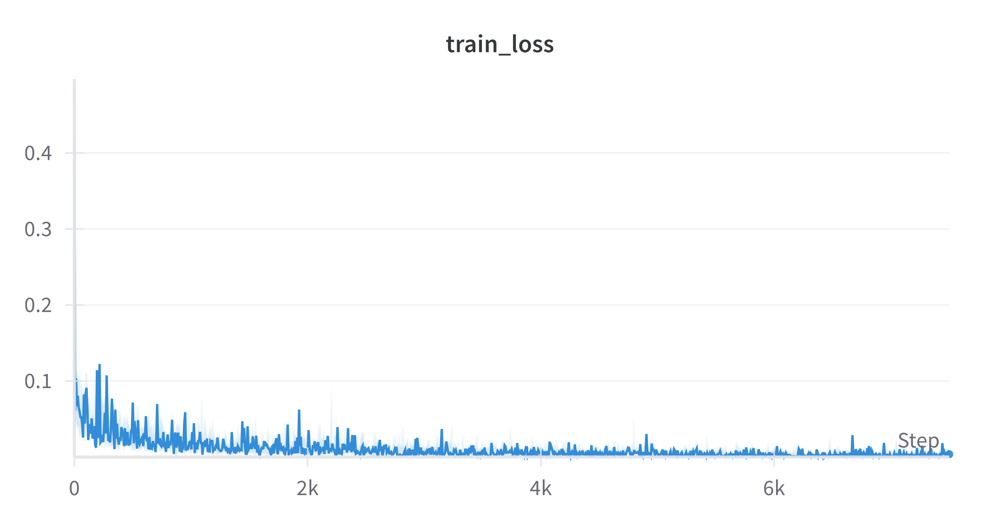

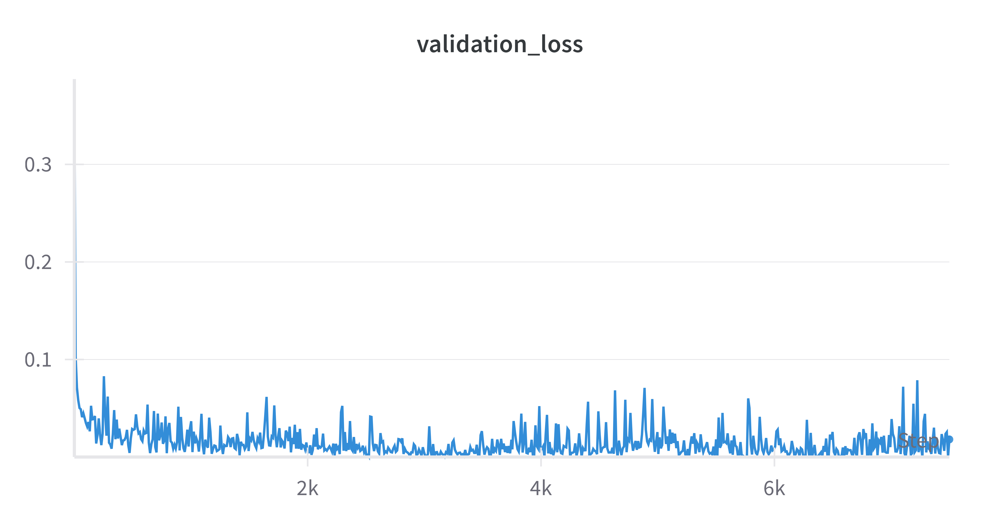

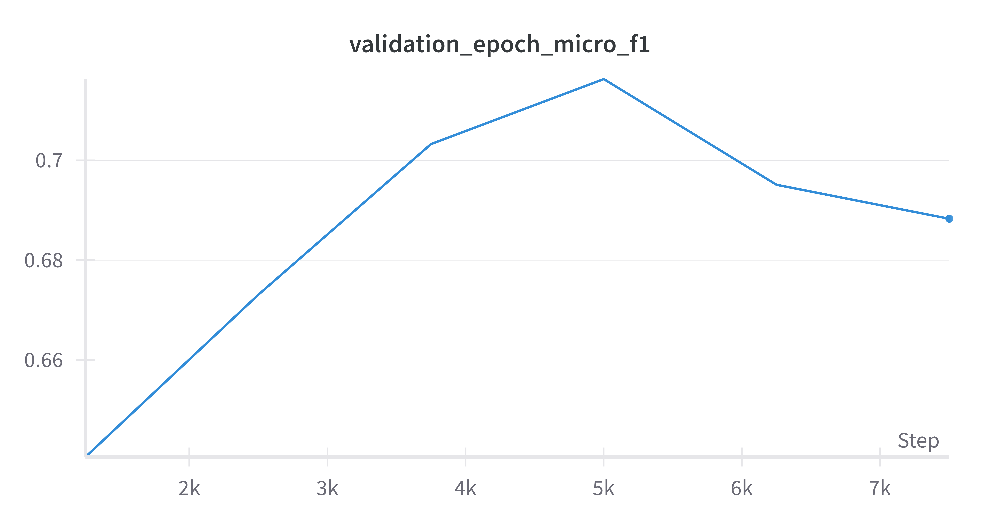

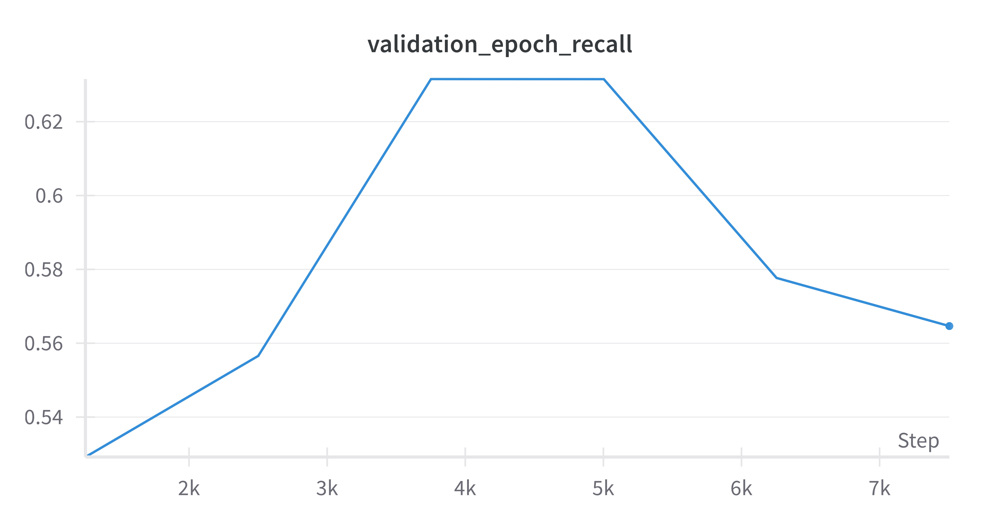

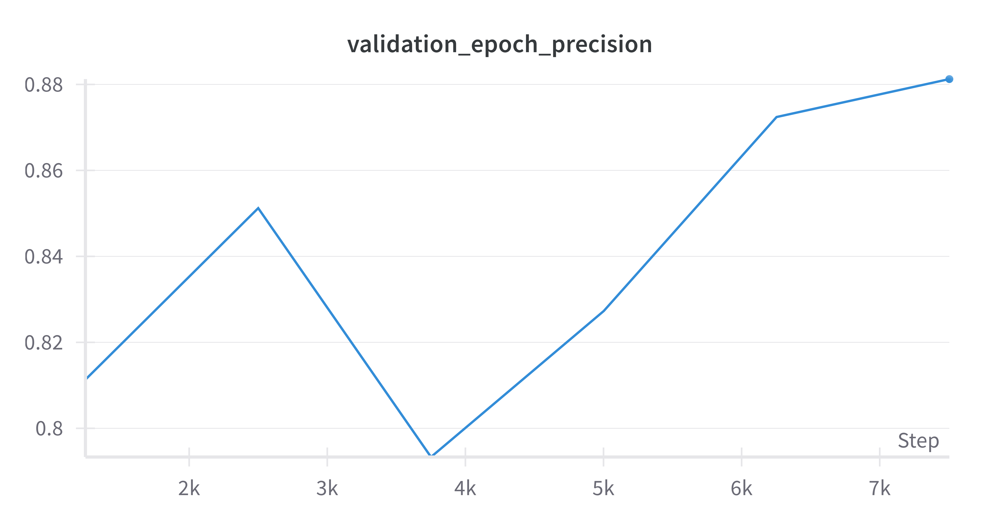

We observed that the best **micro F1 score** on the validation set was achieved at **epoch 4**, reaching **0.716**. This is slightly higher than the score of the **XGBoost token classifier** (**0.7087**) but slightly lower than the **word classifier** (**0.724**), which did not account for spaces.

Both **precision (0.827)** and **recall (0.63)** are comparable to those of the word classifier.

Since the XGBoost token classifier was trained on the **same set of tokens**, it will be particularly insightful to conduct a **token-level comparison** between the models.

Let’s dive into the analysis. 🔍

Get the model weights from fourth epoch:

In [87]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
classifier_model = BertClassifierNetwork(AutoModel.from_pretrained(MODEL_NAME))
classifier_model.load_state_dict(torch.load(BASE_DIRECTORY+ os.path.join("classifier_weights_backups_large_after_mlm","bert_classifier_weights_epoch_3.pth")))
# Note: This directory was renamed, so if you run it yourself, the name may differ.
# To find the actual directory name, check the save_model_weights function.
classifier_model.to(device)

config.json:   0%|          | 0.00/1.19k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.58G [00:00<?, ?B/s]

BertClassifierNetwork(
  (bert): ModernBertModel(
    (embeddings): ModernBertEmbeddings(
      (tok_embeddings): Embedding(50368, 1024, padding_idx=50283)
      (norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
      (drop): Dropout(p=0.0, inplace=False)
    )
    (layers): ModuleList(
      (0): ModernBertEncoderLayer(
        (attn_norm): Identity()
        (attn): ModernBertAttention(
          (Wqkv): Linear(in_features=1024, out_features=3072, bias=False)
          (rotary_emb): ModernBertRotaryEmbedding()
          (Wo): Linear(in_features=1024, out_features=1024, bias=False)
          (out_drop): Identity()
        )
        (mlp_norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
        (mlp): ModernBertMLP(
          (Wi): Linear(in_features=1024, out_features=5248, bias=False)
          (act): GELUActivation()
          (drop): Dropout(p=0.0, inplace=False)
          (Wo): Linear(in_features=2624, out_features=1024, bias=False)
        )
      )
     

Build a token-level DataFrame with the validation set predictions generated by the fine-tuned model:

In [90]:
loader_for_val_df = DataLoader(val_dataset,
                        batch_size=BATCH_SIZE,
                        shuffle=False,
                        pin_memory=True,
                        drop_last=False)

fine_tuned_model_results_df = train_df.loc[val_mask_for_train_df].copy()
texts = train_df.loc[val_mask_for_train_df,"pn_history"].to_list()
encoded_text = tokenizer(texts,
                          add_special_tokens=False,
                          return_offsets_mapping=True)
classifier_model.eval()
all_probs = []
all_predicted_labels = []
offsets = encoded_text["offset_mapping"]
for i, (model_input, labels) in enumerate(loader_for_val_df):
  with torch.no_grad():
    model_input = move_data_to_device(model_input,device=device)
    labels = labels.to(device)
    valid_labels_mask = (labels != -1)
    scores = classifier_model(model_input["input_ids"],
                              attention_mask = model_input["attention_mask"])
    for j in range(scores.size(0)):
      all_probs.append(scores[j][valid_labels_mask[j]].sigmoid().detach().cpu().numpy())
      all_predicted_labels.append(all_probs[-1].round())

fine_tuned_model_results_df["probs"] = all_probs
fine_tuned_model_results_df["predicted_labels"] = all_predicted_labels
fine_tuned_model_results_df["offsets"] = encoded_text["offset_mapping"]

/usr/local/lib/python3.11/dist-packages/torch/_inductor/compile_fx.py:194: UserWarning: TensorFloat32 tensor cores for float32 matrix multiplication available but not enabled. Consider setting `torch.set_float32_matmul_precision('high')` for better performance.
  warnings.warn(
W0509 14:45:41.292000 465 torch/_inductor/utils.py:1137] [1/0] Not enough SMs to use max_autotune_gemm mode


In [91]:
fine_tuned_model_results_df_token = fine_tuned_model_results_df.explode(["probs", "predicted_labels", "offsets"])
fine_tuned_model_results_df_token.probs = fine_tuned_model_results_df_token.probs.apply(lambda x: x.item())
fine_tuned_model_results_df_token.predicted_labels = fine_tuned_model_results_df_token.predicted_labels.apply(lambda x: x.item())
fine_tuned_model_results_df_token["start"] = fine_tuned_model_results_df_token.offsets.apply(lambda x: x[0])
fine_tuned_model_results_df_token["end"] = fine_tuned_model_results_df_token.offsets.apply(lambda x: x[1])

Create a single DataFrame that combines predictions from both token classifiers:

In [96]:
token_valid_subset["xg_predicted_probs"] = token_classifier.predict_proba(X_token_scaled[val_mask_token])[:,1]
token_valid_subset["xg_predicted_labels"] = 0
token_valid_subset.loc[fp_token_mask,"xg_predicted_labels"] = 1
token_valid_subset.loc[(~fn_token_mask)&(token_valid_subset.token_label==1),"xg_predicted_labels"] = 1
fine_tuned_model_results_df_token = fine_tuned_model_results_df_token.drop(columns=["labels"])
tokens_classifiers_val_df = fine_tuned_model_results_df_token.merge(token_valid_subset.loc[:,["id","embeddings_slice_start","embeddings_slice_end","token_text","xg_predicted_labels","xg_predicted_probs","token_label","labels"]+embeddings_features],left_on=["id","start","end"],right_on=["id","embeddings_slice_start","embeddings_slice_end"],how="left",validate="one_to_one",copy=True)


<ipython-input-96-aaf0e1eb7905>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  token_valid_subset["xg_predicted_probs"] = token_classifier.predict_proba(X_token_scaled[val_mask_token])[:,1]
<ipython-input-96-aaf0e1eb7905>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  token_valid_subset["xg_predicted_labels"] = 0


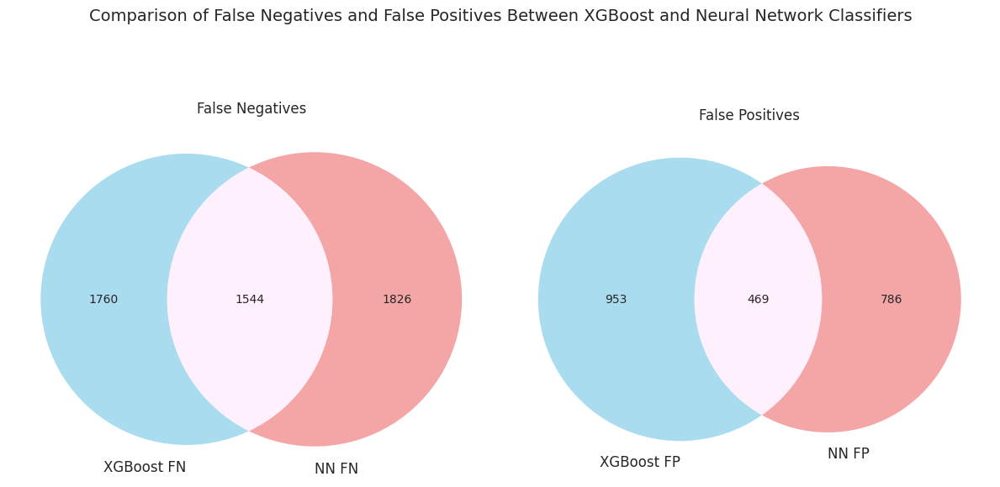

In [97]:
from matplotlib_venn import venn2

# Extract labels
true_labels = tokens_classifiers_val_df["token_label"].values
xg_preds = tokens_classifiers_val_df["xg_predicted_labels"].values
nn_preds = tokens_classifiers_val_df["predicted_labels"].values

# False Negatives
fn_xg = set(np.where((true_labels == 1) & (xg_preds == 0))[0])
fn_nn = set(np.where((true_labels == 1) & (nn_preds == 0))[0])

# False Positives
fp_xg = set(np.where((true_labels == 0) & (xg_preds == 1))[0])
fp_nn = set(np.where((true_labels == 0) & (nn_preds == 1))[0])

# Plot Venn diagrams
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
fig.suptitle("Comparison of False Negatives and False Positives Between XGBoost and Neural Network Classifiers", fontsize=14, y=1.05)

# FN Venn
venn2([fn_xg, fn_nn],
      set_labels=("XGBoost FN", "NN FN"),
      ax=axes[0],
      set_colors=("skyblue", "lightcoral"),
      alpha=0.7)
axes[0].set_title("False Negatives")

# FP Venn
venn2([fp_xg, fp_nn],
      set_labels=("XGBoost FP", "NN FP"),
      ax=axes[1],
      set_colors=("skyblue", "lightcoral"),
      alpha=0.7)
axes[1].set_title("False Positives")

plt.tight_layout()
plt.show()


As we can see, although there is a **significant overlap** between the false negatives (FNs) and false positives (FPs) of the two classifiers, there are also many **distinct cases** where only one model made an error while the other got it right.

This suggests that the two models are relying on **different underlying patterns**, and combining their strengths through **ensembling** could potentially improve overall performance.

Here are two simple ensembling strategies that might be effective:

* **Mean Probability**:
  Combine the predicted probabilities from both models and take the average. The final prediction is made by the model that is more confident on average. This approach ensures that the ensembled model's confidence is **always at least as strong** as the more confident individual model.

* **Max Probability**:
  Select the highest probability from either model for each prediction. Since both models tend to suffer from **low recall**, using the maximum probability is likely to **increase recall**, though it may also **reduce precision** as a tradeoff.

## Fourth Attempt: Ensembling Token-Level Classifiers

In [98]:
tokens_classifiers_val_df["mean_ensembeled_prob"] = (tokens_classifiers_val_df["probs"] +
    tokens_classifiers_val_df["xg_predicted_probs"])/2
tokens_classifiers_val_df["mean_ensembeled_prediction"] = tokens_classifiers_val_df["mean_ensembeled_prob"].round()
tokens_classifiers_val_df["max_ensembeled_prob"] = np.where(
    tokens_classifiers_val_df["probs"] >  tokens_classifiers_val_df["xg_predicted_probs"],
    tokens_classifiers_val_df["probs"],
    tokens_classifiers_val_df["xg_predicted_probs"]
)
tokens_classifiers_val_df["max_ensembeled_prediction"] = tokens_classifiers_val_df["max_ensembeled_prob"].round()


In [99]:
from sklearn.metrics import classification_report

def eval_ensemble(pred_column_name: str):
    """
    Evaluate ensemble predictions at both character and token levels.

    Parameters:
    - pred_column_name (str): name of the column in `tokens_classifiers_val_df` with the ensembled token-level predictions (0 or 1)
    Prints:
    - Micro F1 score at the character level
    - Classification report at the token level
    """
    char_level_preds = tokens_classifiers_val_df.apply(lambda row: np.ones(len(row["labels"])) if row[pred_column_name] == 1 else np.zeros(len(row["labels"])),axis=1)

    print("📏 Micro F1 Character-Level Score:")
    print(micro_f1(char_level_preds.tolist(), tokens_classifiers_val_df["labels"].tolist()))

    print("\n📊 Token-Level Classification Report:")
    print(classification_report(tokens_classifiers_val_df["token_label"], tokens_classifiers_val_df[pred_column_name]))


In [100]:
eval_ensemble("mean_ensembeled_prediction")

📏 Micro F1 Character-Level Score:
0.7032881080593243

📊 Token-Level Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00    632379
           1       0.87      0.59      0.70      9297

    accuracy                           0.99    641676
   macro avg       0.93      0.79      0.85    641676
weighted avg       0.99      0.99      0.99    641676



Our mean ensembling approach led to higher precision, but at the cost of even lower recall — an unfavorable tradeoff that ultimately reduced the overall F1 score.

In [110]:
eval_ensemble("max_ensembeled_prediction")

📏 Micro F1 Character-Level Score:
0.7893116287951117

📊 Token-Level Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    632379
           1       0.78      0.83      0.81      9297

    accuracy                           0.99    641676
   macro avg       0.89      0.92      0.90    641676
weighted avg       0.99      0.99      0.99    641676



**Max ensembling** resulted in a significant performance boost, achieving our **best micro F1 score to - 0.789!**

This method substantially increased **recall**, with only a modest decrease in **precision**. The improvement can be attributed to the **diversity in true positives** captured by each classifier individually. As a result, max ensembling led to:

* A substantial increase in **true positives** and a reduction in **false negatives**, driving recall up.
* A slight increase in **false positives**, but due to the overall gain in true positives, **precision remained relatively stable**.

### Post-Processing Leading Space

As noted previously, some labeled tokens start with unlabeled space, leading to false positives and reduced precision. To enhance our ensembled classifier, we will identify cases where annotations start with a space and correct them by removing the leading space from the prediction.


In [143]:
tokens_classifiers_val_df = tokens_classifiers_val_df.sort_values(["id", "start"])

tokens_classifiers_val_df["char_level_ensembled_preds"] = tokens_classifiers_val_df.apply(
    lambda row: np.ones(len(row["labels"])) if row["max_ensembeled_prediction"] == 1 else np.zeros(len(row["labels"])),
    axis=1
)
is_space_and_positive = (
    tokens_classifiers_val_df.token_text.str.startswith(" ") &
    (tokens_classifiers_val_df.max_ensembeled_prediction == 1)
)

is_shifted_same_id = tokens_classifiers_val_df.shift(1).id == tokens_classifiers_val_df.id
is_shifted_label_zero = tokens_classifiers_val_df.shift(1).token_label == 0
is_shifted_diff_id = tokens_classifiers_val_df.shift(1).id != tokens_classifiers_val_df.id

leading_space_mistake_mask = is_space_and_positive & (
    (is_shifted_label_zero & is_shifted_same_id) | is_shifted_diff_id
)

def change_first_element_to_zero(arr: np.ndarray) -> np.ndarray:
    arr[0] = 0
    return arr

tokens_classifiers_val_df.loc[leading_space_mistake_mask, "char_level_ensembled_preds"] = (
    tokens_classifiers_val_df.loc[leading_space_mistake_mask, "char_level_ensembled_preds"]
    .map(change_first_element_to_zero)
)

print("📏 Micro F1 Character-Level Score After Post-Processing Leading Space:")
print(micro_f1(
    tokens_classifiers_val_df["char_level_ensembled_preds"].tolist(),
    tokens_classifiers_val_df["labels"].tolist()
))

📏 Micro F1 Character-Level Score After Post-Processing Leading Space:
0.8203773304059837


After correction, the micro F1 score significantly improved, reaching **0.82**, indicating reduced false positives and enhanced precision!

# Results

| Attempt # | Approach                            | Description                                                                                                                                                                                                                                                                                   | F1-Score | Precision | Recall   |
| --------- | ----------------------------------- | --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | -------- | --------- | -------- |
| 1         | Word-Level Classification           | XGBoost classifier operating at the word level,<br>without accounting for spaces.<br>Dominant features included whether a word or its neighbors were previously annotated,<br>and frequency of occurrence.                                                                                    | 0.72     | **0.83**      | 0.64     |
| 2         | Token-Level Classification          | XGBoost classifier using PCA-reduced ModernBERT embeddings.<br> Features included the mean distance to the top 3 annotated tokens in embedding space,<br>average embedding of the feature text, cosine similarity between token and feature embeddings,<br>and reduced embedding coordinates. | 0.71     | 0.81      | 0.64     |
| 3         | Fine-Tuning ModernBERT              | The model was first pre-trained using Masked Language Modeling (MLM) on the unlabeled data,<br>allowing it to better adapt to the language patterns of patient notes.<br>Then, a classifier head was added to ModernBERT,<br>and the full model was fine-tuned on the task to directly predict annotations from text.                                                                                                                                                                                                 | 0.72     | **0.83**  | 0.63     |
| 4         | Ensemble of Token-Level Classifiers | Combined predictions of the XGBoost and fine-tuned ModernBERT<br> by taking the highest predicted probability for each token,<br> followed by post-processing to correct cases where labeled tokens started with an unlabeled space,<br> reducing false positives and significantly improving the micro F1 score.                                                                                                                                                                  | **0.82** | 0.78      | **0.83** |

<br>

* **Precision** and **Recall** are calculated per segment (word/token), while the **F1-score** is calculated per character.

* **XGBoost Word Classification Based on Word Matching**

  * A simple yet surprisingly effective approach.
  * The main drawbacks were its limited generalization ability—struggling to identify novel expressions of clinical features, leading to recall errors—and a weak understanding of context, which contributed to precision errors.

* **XGBoost Token Classification**

  * Produced results similar to the word-level approach.

* **Fine-Tuning ModernBERT**

  * Although it produced similar performance metrics to the XGBoost token classifier, it likely relied on **different patterns**, resulting in correct predictions on some samples where the token classifier failed, and vice versa.  

* **Ensembling Token Classifiers**

  * Many false negatives made by one model were correctly classified by the other.
  * By ensembling (taking the higher predicted probability), we significantly improved recall without substantially sacrificing precision—yielding the best overall performance.

# 📑 Conclusions

In this project, we aimed to develop an automated method for extracting key phrases from patient notes written by medical students and mapping them to the correct (given) exam rubrics.

## 🔍 Understanding the Data

We began by analyzing the dataset structure and performing basic validations. Next, we explored the data distribution from various perspectives, highlighting the inherently **imbalanced nature** of the problem and the diversity in **expression variations**—including misspellings, synonyms, and abbreviations—which pose challenges for automated annotation.

We found that accurately identifying annotations requires a strong level of **domain knowledge**, **contextual understanding**, and **resilience to expression variations**. Interestingly, however, in many cases, simply searching for words that appear in the feature text can do the trick.

## 🛠️ Feature Extraction

After gaining a deeper understanding of the data, we began feature extraction.

### Word-Level Features

We started with a straightforward approach by extracting features for each word. To enhance robustness, we utilized **word matching** based on known annotations, which proved to be effective. We also incorporated features related to the **word’s environment** rather than just the word itself.

### Token-Level Features with ModernBERT

Recognizing the limitations of word matching, we moved to token-level features derived from **ModernBERT embeddings**. We aimed to capture richer contextual information and handle variations not seen during training. After applying **PCA** to reduce dimensionality, we visualized the embeddings, noting that **annotations of the same feature tend to cluster together**. This motivated us to develop a feature extraction method based on the **mean Euclidean distance** to the closest annotated tokens, expanding this concept to include the **token's environment**.

## 🧠 Modeling

During the modeling phase, we initially found that the **word-matching classifier** performed surprisingly well. However, we were somewhat disappointed that the **token classifier** did not significantly improve upon the word-matching results. The main weakness of both models was **low recall**, likely due to their difficulty in detecting **new variations** of feature expressions not encountered during training.

### Fine-Tuning ModernBERT

To overcome these limitations, we adopted an **end-to-end approach** by fine-tuning ModernBERT to directly classify annotations. To better adapt the model to clinical text, we first performed **Masked Language Modeling (MLM) pretraining** on the massive amount of unlabeled data before fine-tuning.

Despite this more advanced approach, the fine-tuned ModernBERT did not significantly outperform the previous models. However, it performed well on **different samples** compared to the token classifier, suggesting that it learned to capture **different patterns**.

### Ensembling for Best Performance

To leverage the strengths of both models, we created an ensemble by combining the **fine-tuned ModernBERT** with the **token classifier**. The ensemble took the **maximum predicted probability** from both models, significantly boosting **recall** and leading to the best overall performance with an **F1 score of 0.82** on the validation set.

## 🚧 Challenges and Limitations

Although the ensemble model achieved promising results, it remains **far from perfect** and is likely **not reliable enough** for full automation. It could, however, serve as a **supportive tool** to assist examiners by suggesting potential annotations for cases similar to those seen during training.

---
## 💡 Improvement Ideas

To further enhance performance, we suggest the following strategies:

1. **Cross-Validation:**
   Instead of using a simple 80%/20% train-validation split, employing cross-validation could provide a more comprehensive evaluation by leveraging the entire dataset. This would also allow training on a higher percentage of data, potentially boosting performance and generalization.

2. **Pseudo-Labeling:**
   While we utilized unlabeled patient notes for MLM pretraining, we have not yet explored semi-supervised approaches. Applying pseudo-labeling by using a trained model to label the unlabeled data could expand the labeled dataset. Subsequently, training a model on the combined labeled and pseudo-labeled data might improve generalization and performance.

3. **Leveraging Pretrained Embeddings:**
   Since MLM pretraining improved the fine-tuned model, using the pretrained embeddings as input for the XGBoost classifier could also enhance its performance. The improved embeddings would better capture the token representations, though this may make the predictions more similar to those of the fine-tuned model.

By incorporating these strategies, we can aim to build a more accurate and robust annotation system for clinical text.

# 🧑 Self Reflection

I thoroughly enjoyed every part of this project and learned a great deal throughout the process. It was both challenging and rewarding, and I came away with valuable insights and skills that will definitely be useful in future work.


### 📊 Effective Data Analysis

During this project, I often encountered complex questions about data distribution. This challenged me to improve my ability to **translate abstract questions into efficient data processing and visualization** tasks. More importantly, it helped me develop a better sense of how to **analyze results accurately and extract meaningful insights**.

One of the most satisfying aspects was making data-driven decisions that led to extracting meaningful features — often in ways I hadn't anticipated at the outset. While not every approach was successful, even the failures taught me important lessons. For instance:

* Attempts like exploring **TF-IDF as a feature** ultimately didn’t work (I ended up using only **term frequency**).
* Unsuccessful experiments with **clustering** and **alternative feature reduction methods**.
* Logical bugs that were challenging to track down.

These experiences reinforced the importance of being persistent, analyzing failures critically, and continuously iterating — all of which ultimately led to better model performance.

---

### 💻 Dealing with Limited Hardware and Long Run Times

Many of the tasks in this project were **computationally intensive**, both in terms of memory and time. I often faced challenges related to **memory limits** and **long algorithm run times**, but I managed to overcome these obstacles by adopting a few practical strategies:

* **Batch Processing:** Dividing large operations into manageable batches to avoid memory overflow.
* **Saving Intermediate Results:** Keeping intermediate outputs to avoid redundant computations.
* **Efficient Implementations:** Putting extra effort into optimizing functions where speed was critical.
* **Parallelizing Tasks:** Making the most of my time by running one process while working on other parts of the project.

These strategies not only improved efficiency but also taught me how to better manage computational resources in large-scale projects.

---


### 🌐 Exploring NLP Techniques

One of the most exciting aspects of this project was diving into **Natural Language Processing (NLP)**. I discovered just how diverse and challenging the field can be, gaining hands-on experience with a wide range of techniques — from basic word matching to leveraging **ModernBERT**, including both pretraining and fine-tuning. This journey deepened my understanding of both traditional and modern NLP methods.

I was pleasantly surprised to see how powerful tools are now readily available and intuitive to use. However, I also realized that truly understanding the underlying processes is essential to achieving the best results. Balancing **practical implementation** with **theoretical insight** proved crucial in making the most of these advanced methods.


---

### 🔄 Iterative Improvement in Prediction Models

At the beginning, my model’s performance was far from satisfactory. However, several key factors led to significant improvements:

* **Better Feature Engineering:** As I gained a deeper understanding of the data, I managed to extract more informative features, which proved crucial for boosting performance.
* **Choosing the Right Algorithm:** Initially, I used classic models like **decision trees**, **logistic regression**, and **random forest** but they didn’t scale well to the data’s size and complexity. After experimenting with various algorithms, I discovered **XGBoost**, which provided the best balance between performance and efficiency.
* **Analyzing Model Results:** Examining the model's output carefully led to crucial insights. For example, identifying differences in the strengths of token classifiers motivated me to **ensemble the models**, which ultimately yielded the highest F1 score.

---

### 🌱 Looking Back and Moving Forward

Reflecting on this journey, I’m proud of the progress I made from the early stages, when I was still searching for a project, to achieving a solid final result. This project reinforced the idea that there are countless tools, algorithms, and datasets out there to explore. More importantly, it showed me that I can tackle real-life problems with data science — and I’m excited to take on more challenges in the future.